In [1]:
# Import modules
import string
import time
import argparse as ap
import sys
import os
import glob

import numpy as np
import pandas as pd
import obspy.core as oc
from obspy.core import read
from obspy.signal.trigger import trigger_onset
from obspy import Stream, Trace
import obspy.signal
import obspy.signal.filter as obs
from obspy.core.utcdatetime import UTCDateTime

import matplotlib.pyplot as plt

import math # for pi, sqrt, etc

import tensorflow as tf
import keras
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras import backend as K
from keras import losses
from keras.legacy import interfaces

import h5py
import json

import random

import scipy.stats as stats
import scipy.signal as signal

from datetime import datetime
from scipy.interpolate import InterpolatedUnivariateSpline
import dateutil

# for location
import pyproj

import pickle as pkl

Using TensorFlow backend.


In [2]:
# Defining file reading function
def readPNR(fname,**kwargs):
    """Wrapper function for reading PNR segy data which sets headers for
    stations and channels automatically"""
    st = read(fname,**kwargs)
    # populate trace headers for network, station name, channel, and distance (depth, needed to easily produce section plots)
    for i, trace in enumerate(st):
        trace.stats.network = "PNR"
        trace.stats.station = "{:0>3d}".format(trace.stats.segy.trace_header.geophone_group_number_of_last_trace)
        trace.stats.channel = 'BS'+str(i%3+1)
        trace.stats.distance = trace.stats.segy.trace_header.receiver_group_elevation/1000
    return st

def readPNR_ENZ(fname,**kwargs):
    """Wrapper function for reading PNR segy data and reorienting it into ENZ
    components witgh appropriate headers.

    Note: Requires that the stns dataframe has been read in correctly"""
    st = readPNR(fname,**kwargs)

    # Create a copy of the traces to be rotated
    strot=st.copy()

    # Loop through stations, construct rotation matrices and apply to apply to traces
    for i, row in stns.iterrows():
        azi=np.radians(row['azi'])
        inc=np.radians(row['inc'])
        rot=np.radians(row['rgb_orient'])

        # Create rotation matrices
        R1=np.array([[np.sin(azi), -np.cos(azi), 0],
                     [np.cos(azi),  np.sin(azi), 0],
                     [          0,            0, 1]])
        R2=np.array([[np.cos(inc), 0, -np.sin(inc)],
                     [          0, 1,            0],
                     [np.sin(inc), 0,  np.cos(inc)]])
        R3=np.array([[ np.cos(rot), np.sin(rot), 0],
                     [-np.sin(rot), np.cos(rot), 0],
                     [           0,           0, 1]])

        # Select traces from appropriate station
        stnm = "{:0>3d}".format(int(row['name']))
        sttmp = strot.select(station=stnm)

        # instrument coordinates are left-handed Hx,Hy,Vz, need to flip polarization of Hy to make it right handed
        tmparrays = np.stack((sttmp[0].data,-sttmp[1].data,sttmp[2].data))

        # Apply the rotation
        rotated = R1 @ R2 @ R3 @ tmparrays

        # Set the data of the traces
        sttmp[0].data=rotated[0,:]
        sttmp[1].data=rotated[1,:]
        sttmp[2].data=rotated[2,:]

        # Rename the channels
        sttmp[0].stats.channel = 'BSE'
        sttmp[1].stats.channel = 'BSN'
        sttmp[2].stats.channel = 'BSZ'
    return strot

# Adam optimiser with variable learning rates (applied through a learning rate multiplier)
# This was used during model training to set a learning rate 'multiplier' for different layers (so we can have lower learning rate for GPD layers)
# It needs to be defined so we can load our trained model

# Adapted from: https://erikbrorson.github.io/2018/04/30/Adam-with-learning-rate-multipliers/


class Adam_lr_mult(Optimizer):
    """Adam optimizer.
    Adam optimizer, with learning rate multipliers built on Keras implementation
    # Arguments
        lr: float >= 0. Learning rate.
        beta_1: float, 0 < beta < 1. Generally close to 1.
        beta_2: float, 0 < beta < 1. Generally close to 1.
        epsilon: float >= 0. Fuzz factor. If `None`, defaults to `K.epsilon()`.
        decay: float >= 0. Learning rate decay over each update.
        amsgrad: boolean. Whether to apply the AMSGrad variant of this
            algorithm from the paper "On the Convergence of Adam and
            Beyond".
    # References
        - [Adam - A Method for Stochastic Optimization](http://arxiv.org/abs/1412.6980v8)
        - [On the Convergence of Adam and Beyond](https://openreview.net/forum?id=ryQu7f-RZ)
        
    AUTHOR: Erik Brorson
    """

    def __init__(self, lr=0.001, beta_1=0.9, beta_2=0.999,
                 epsilon=None, decay=0., amsgrad=False,
                 multipliers=None, debug_verbose=False,**kwargs):
        super(Adam_lr_mult, self).__init__(**kwargs)
        with K.name_scope(self.__class__.__name__):
            self.iterations = K.variable(0, dtype='int64', name='iterations')
            self._lr = K.variable(lr, name='lr')
            self.beta_1 = K.variable(beta_1, name='beta_1')
            self.beta_2 = K.variable(beta_2, name='beta_2')
            self.decay = K.variable(decay, name='decay')
        if epsilon is None:
            epsilon = K.epsilon()
        self.epsilon = epsilon
        self.initial_decay = decay
        self.amsgrad = amsgrad
        self.multipliers = multipliers
        self.debug_verbose = debug_verbose

    @interfaces.legacy_get_updates_support
    def get_updates(self, loss, params):
        grads = self.get_gradients(loss, params)
        self.updates = [K.update_add(self.iterations, 1)]

        lr = self._lr
        if self.initial_decay > 0:
            lr *= (1. / (1. + self.decay * K.cast(self.iterations,
                                                  K.dtype(self.decay))))

        t = K.cast(self.iterations, K.floatx()) + 1
        lr_t = lr * (K.sqrt(1. - K.pow(self.beta_2, t)) /
                     (1. - K.pow(self.beta_1, t)))

        ms = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        vs = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        if self.amsgrad:
            vhats = [K.zeros(K.int_shape(p), dtype=K.dtype(p)) for p in params]
        else:
            vhats = [K.zeros(1) for _ in params]
        self.weights = [self.iterations] + ms + vs + vhats

        for p, g, m, v, vhat in zip(params, grads, ms, vs, vhats):

            # Learning rate multipliers
            if self.multipliers:
                multiplier = [mult for mult in self.multipliers if mult in p.name]
            else:
                multiplier = None
            if multiplier:
                new_lr_t = lr_t * self.multipliers[multiplier[0]]
                if self.debug_verbose:
                    print('Setting {} to learning rate {}'.format(multiplier[0], new_lr_t))
                    print(K.get_value(new_lr_t))
            else:
                new_lr_t = lr_t
                if self.debug_verbose:
                    print('No change in learning rate {}'.format(p.name))
                    print(K.get_value(new_lr_t))
            m_t = (self.beta_1 * m) + (1. - self.beta_1) * g
            v_t = (self.beta_2 * v) + (1. - self.beta_2) * K.square(g)
            if self.amsgrad:
                vhat_t = K.maximum(vhat, v_t)
                p_t = p - new_lr_t * m_t / (K.sqrt(vhat_t) + self.epsilon)
                self.updates.append(K.update(vhat, vhat_t))
            else:
                p_t = p - new_lr_t * m_t / (K.sqrt(v_t) + self.epsilon)

            self.updates.append(K.update(m, m_t))
            self.updates.append(K.update(v, v_t))
            new_p = p_t

            # Apply constraints.
            if getattr(p, 'constraint', None) is not None:
                new_p = p.constraint(new_p)

            self.updates.append(K.update(p, new_p))
        return self.updates

    def get_config(self):
        config = {'lr': float(K.get_value(self._lr)),
                  'beta_1': float(K.get_value(self.beta_1)),
                  'beta_2': float(K.get_value(self.beta_2)),
                  'decay': float(K.get_value(self.decay)),
                  'epsilon': self.epsilon,
                  'amsgrad': self.amsgrad,
                  'multipliers':self.multipliers}
        base_config = super(Adam_lr_mult, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

# Define function to produce sliding windows of signal

def sliding_window(data, size, stepsize=1, padded=False, axis=-1, copy=True):
    """
    Calculate a sliding window over a signal
    Parameters
    ----------
    data : numpy array
        The array to be slided over.
    size : int
        The sliding window size
    stepsize : int
        The sliding window stepsize. Defaults to 1.
    axis : int
        The axis to slide over. Defaults to the last axis.
    copy : bool
        Return strided array as copy to avoid sideffects when manipulating the
        output array.
    Returns
    -------
    data : numpy array
        A matrix where row in last dimension consists of one instance
        of the sliding window.
    Notes
    -----
    - Be wary of setting `copy` to `False` as undesired sideffects with the
      output values may occurr.
    Examples
    --------
    >>> a = numpy.array([1, 2, 3, 4, 5])
    >>> sliding_window(a, size=3)
    array([[1, 2, 3],
           [2, 3, 4],
           [3, 4, 5]])
    >>> sliding_window(a, size=3, stepsize=2)
    array([[1, 2, 3],
           [3, 4, 5]])
    See Also
    --------
    pieces : Calculate number of pieces available by sliding
    """
    if axis >= data.ndim:
        raise ValueError(
            "Axis value out of range"
        )

    if stepsize < 1:
        raise ValueError(
            "Stepsize may not be zero or negative"
        )

    if size > data.shape[axis]:
        raise ValueError(
            "Sliding window size may not exceed size of selected axis"
        )

    shape = list(data.shape)
    shape[axis] = np.floor(data.shape[axis] / stepsize - size / stepsize + 1).astype(int)
    shape.append(size)

    strides = list(data.strides)
    strides[axis] *= stepsize
    strides.append(data.strides[axis])

    strided = np.lib.stride_tricks.as_strided(
        data, shape=shape, strides=strides
    )

    if copy:
        return strided.copy()
    else:
        return strided



# For UGPD

In [3]:
root = './'
# Load model and weights
model = keras.models.load_model(root +'U-GPD/model/best/model.h5', custom_objects={'Adam_lr_mult': Adam_lr_mult})
# model = keras.models.load_model('model.h5', custom_objects={'Adam_lr_mult': Adam_lr_mult})
print("*** 1 of 2: MODEL LOADED FROM DISK ***")

model.load_weights(root+ 'U-GPD/model/best/weights_lowest_loss.hdf5') # Load in weights from training epoch with lowest validation loss
# model.load_weights('weights_lowest_loss.hdf5')

print ("*** 2 of 2:BEST TRAINING WEIGHTS LOADED ***")

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
*** 1 of 2: MODEL LOADED FROM DISK ***
*** 2 of 2:BEST TRAINING WEIGHTS LOADED ***


In [4]:
#####################################################################################  
# Hyperparameters
# INPUT

# Model prediction parameters
shift_size = 200 # Overlap (in samples) for sliding window
batch_size = 100 # No. of windows to process at a time

# Trigger parameters
p_thresh = 0.3 # Trigger on threshold for P-waves
s_thresh = 0.3 # Trigger on threshold for S-waves
trig_off = 0.2 # Trigerr off threshold for both phase arrivals

freq_max = 50.0
filter_data = True

In [5]:
# folders and data

P_df = pd.read_csv('./Classification_test_data/P_df_070122.csv',index_col=0)
S_df = pd.read_csv('./Classification_test_data/S_df_070122.csv',index_col=0)
N_df = pd.read_csv('./Classification_test_data/N_df_070122.csv',index_col=0)


# Define some paths
drive = './../'

# Read the station orientations for trace rotations
# read in event catalogue as a dataframe (note that these don't have traveltime picks)
df_cat = pd.read_csv(drive + '/Catalog/Event_and_Station/PNR-1z_FullCatalogue.dat',
                    delim_whitespace=True)

# create a new datetime column with the origin times of the events
df_cat['datetime']=df_cat['T'].apply(UTCDateTime) + df_cat['QC_LOC_T0']

# well path 1
wp1 = pd.read_csv(drive + '/Catalog/Event_and_Station/PNR-1z_Wellpath.dat', delim_whitespace=True)

# well path 2
wp2 = pd.read_csv(drive + '/Catalog/Event_and_Station/PNR-2_Wellpath.dat', delim_whitespace=True)

# location of the injection sleeves of pnr1 and 2
pnr1_stgs = pd.read_csv(drive + '/Catalog/Event_and_Station/PNR-1z_Stages.dat', delim_whitespace=True)
pnr2_stgs = pd.read_csv(drive + '/Catalog/Event_and_Station/PNR-2_Stages.dat', delim_whitespace=True)

# station locations and "orientations"
stns = pd.read_csv(drive + '/Catalog/Event_and_Station/PNR-1z_Stations_orient.dat', delim_whitespace=True)


# Functions to return well inclination and azimuth from measured depth
md2inc=InterpolatedUnivariateSpline(wp2['MD'],wp2['Inc'])
md2az=InterpolatedUnivariateSpline(wp2['MD'],wp2['Az'])


# Find measured depth for each station by root finding
MDs=[]
for stdp in stns['stz']:
    MDs.append(InterpolatedUnivariateSpline(wp2['MD'],wp2['TVD_MSL']-stdp).roots()[0])

# assign station measured depth and compute station azimuth and inclination
stns['MD'] = MDs
stns['azi']=stns['MD'].apply(md2az)
stns['inc']=stns['MD'].apply(md2inc)

#####################################################################################
# Converting the event starttimes from string to UTCDateTime

# converting str to UTCDateTime
for i in np.arange(0,len(P_df)):
    evnt=P_df.iloc[i]
    starttime = evnt['starttime']   
    if (starttime, str):
        P_df['starttime'].iloc[i]= UTCDateTime(starttime)
    else:
        pass
 
# converting str to UTCDateTime
for i in np.arange(0,len(S_df)):
    evnt=S_df.iloc[i]
    starttime = evnt['starttime']   
    if (starttime, str):
        S_df['starttime'].iloc[i]= UTCDateTime(starttime)
    else:
        pass
        
# converting str to UTCDateTime
for i in np.arange(0,len(N_df)):
    evnt=N_df.iloc[i]
    starttime = evnt['starttime']   
    if (starttime, str):
        N_df['starttime'].iloc[i]= UTCDateTime(starttime)
    else:
        print('None')
        pass
#####################################################################################

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [6]:
# Converting station numbers from integer to strings
# converting station int to str
for i in np.arange(0,len(P_df)):
    evnt=P_df.iloc[i]
    sta = evnt['sta_str']   
    if sta < 10:
        P_df['sta_str'].iloc[i]= '00' + str(sta)
    elif sta >= 10:
        P_df['sta_str'].iloc[i]= '0' + str(sta)
    else:
        pass

        
# converting station int to str
for i in np.arange(0,len(S_df)):
    evnt=S_df.iloc[i]
    sta = evnt['sta_str']   
    if sta < 10:
        S_df['sta_str'].iloc[i]= '00' + str(sta)
    elif sta >= 10:
        S_df['sta_str'].iloc[i]= '0' + str(sta)
    else:
        pass
        
# converting station int to str
for i in np.arange(0,len(N_df)):
    evnt= N_df.iloc[i]
    sta = evnt['sta_str']   
    if sta < 10:
        N_df['sta_str'].iloc[i]= '00' + str(sta)
    elif sta >= 10:
        N_df['sta_str'].iloc[i]= '0' + str(sta)
    else:
        pass
#####################################################################################

idx: 0
Origin time: 2018-10-16T10:54:18.348596Z
Station: 10.0
29/29 [==============================] - 0s 4ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



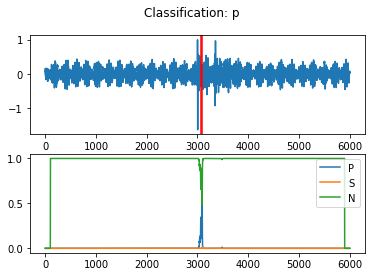

idx: 1
Origin time: 2018-10-17T10:44:06.572483Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

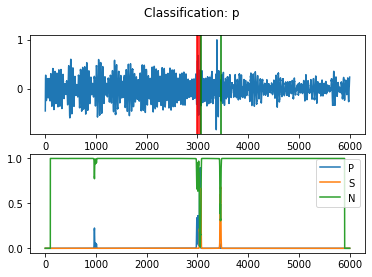

idx: 2
Origin time: 2018-10-17T10:44:19.299796Z
Station: 19.0
17/17 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

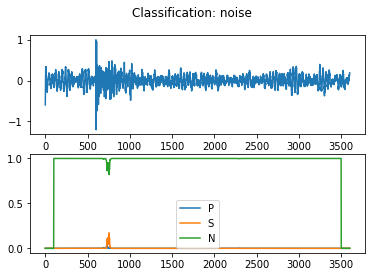

idx: 3
Origin time: 2018-10-17T10:46:22.151227Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

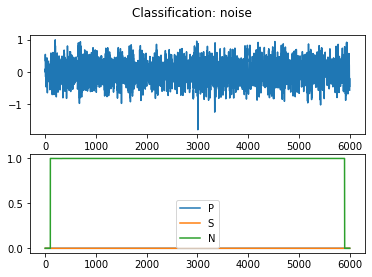

idx: 4
Origin time: 2018-10-17T10:47:01.083957Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

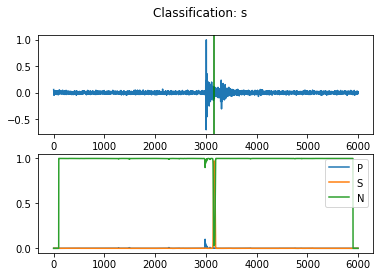

idx: 5
Origin time: 2018-10-17T10:48:49.666153Z
Station: 2.0
27/27 [==============================] - 0s 2ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

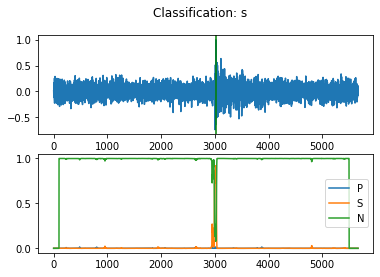

idx: 6
Origin time: 2018-10-17T10:54:21.868852Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

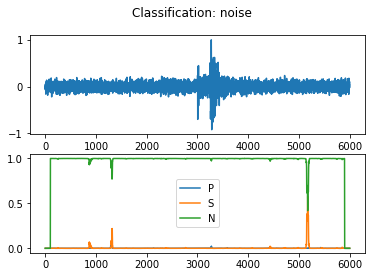

idx: 7
Origin time: 2018-10-23T14:22:12.817697Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

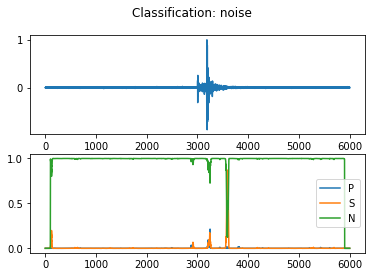

idx: 8
Origin time: 2018-10-23T14:27:16.127296Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

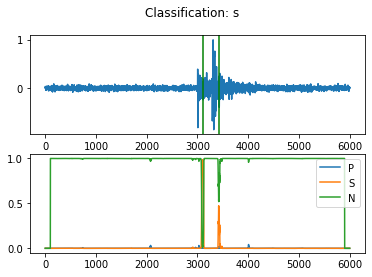

idx: 9
Origin time: 2018-10-23T14:30:57.305669Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

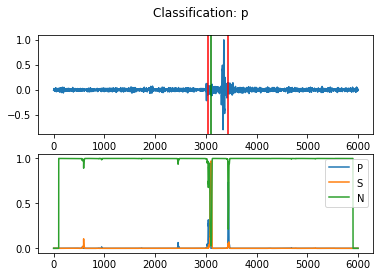

idx: 10
Origin time: 2018-10-23T14:35:43.946102Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

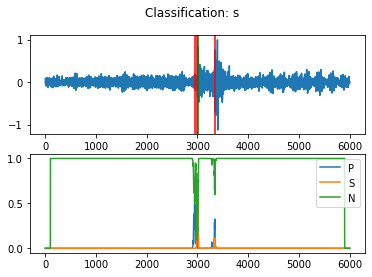

idx: 11
Origin time: 2018-10-23T14:36:15.795023Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

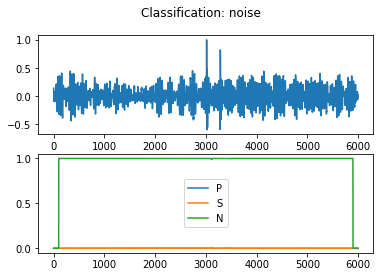

idx: 12
Origin time: 2018-10-23T14:36:50.665293Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

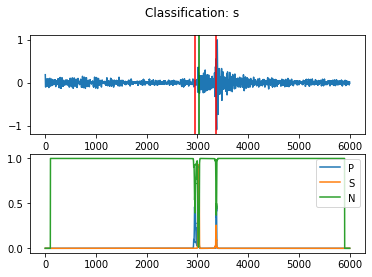

idx: 13
Origin time: 2018-10-23T14:37:29.276876Z
Station: 10.0
21/21 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

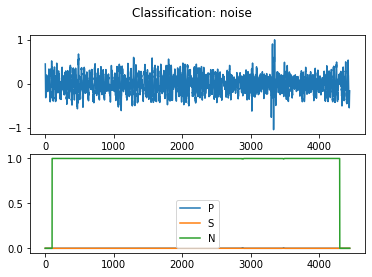

idx: 14
Origin time: 2018-10-23T14:38:07.056302Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

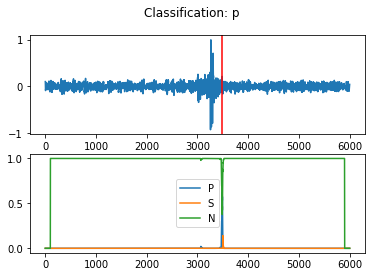

idx: 15
Origin time: 2018-10-23T14:39:14.087327Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

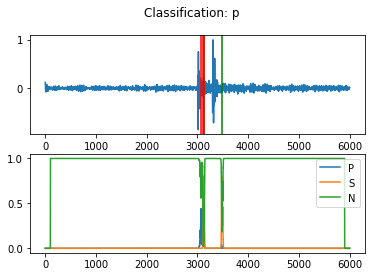

idx: 16
Origin time: 2018-10-23T14:39:20.668372Z
Station: 9.0
27/27 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

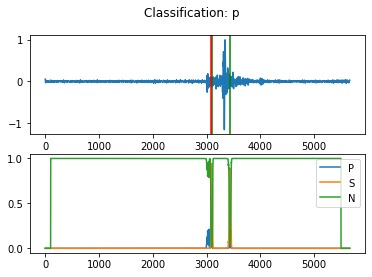

idx: 17
Origin time: 2018-10-23T14:40:34.403000Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

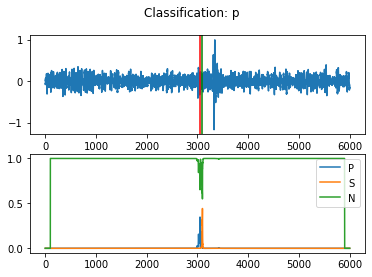

idx: 18
Origin time: 2018-10-23T14:41:41.137625Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

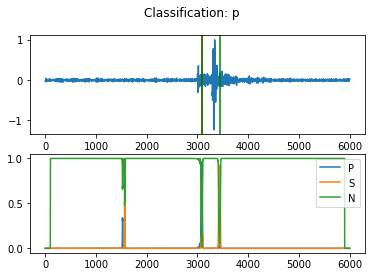

idx: 19
Origin time: 2018-10-23T14:41:50.364001Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

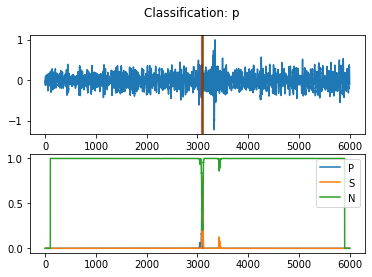

idx: 20
Origin time: 2018-10-23T14:41:53.380754Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

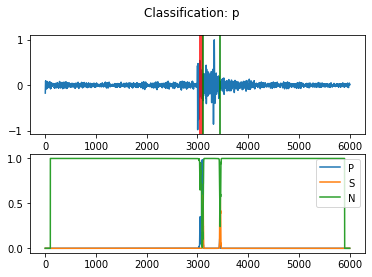

idx: 21
Origin time: 2018-10-23T14:44:25.324501Z
Station: 7.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

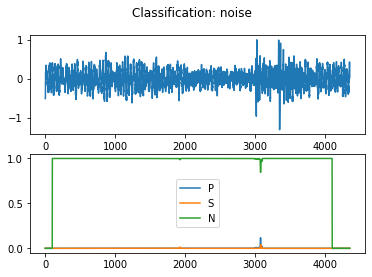

idx: 22
Origin time: 2018-10-23T14:44:29.444719Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

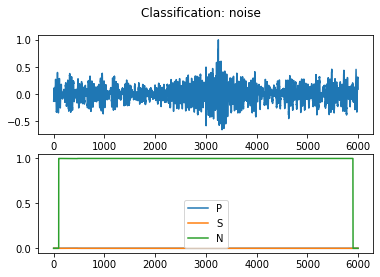

idx: 23
Origin time: 2018-10-23T14:44:35.731000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

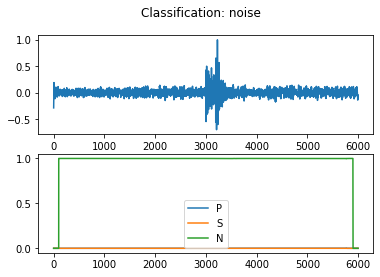

idx: 24
Origin time: 2018-10-23T14:44:37.540141Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

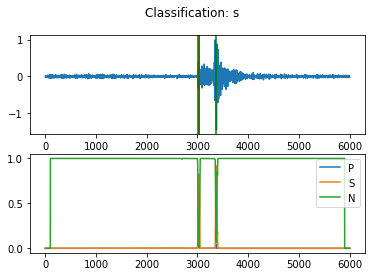

idx: 25
Origin time: 2018-10-23T14:44:44.536276Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

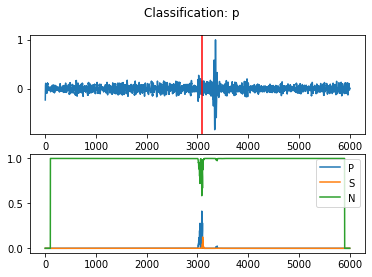

idx: 26
Origin time: 2018-10-23T14:34:59.967670Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

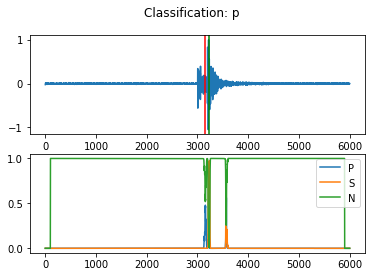

idx: 27
Origin time: 2018-10-23T14:45:32.791670Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

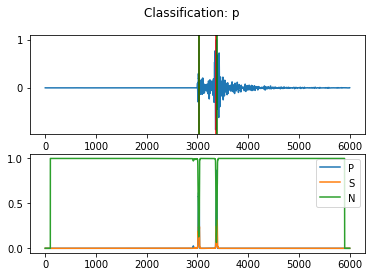

idx: 28
Origin time: 2018-10-23T14:45:40.266110Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

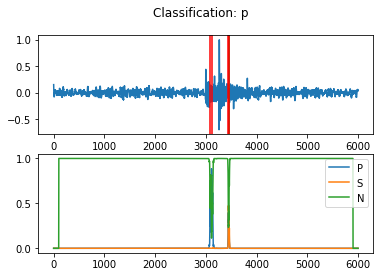

idx: 29
Origin time: 2018-10-23T14:45:44.157500Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

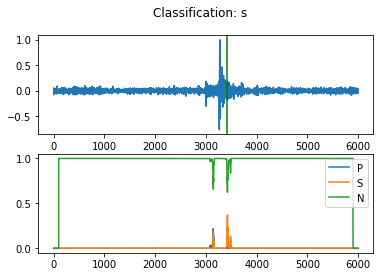

idx: 30
Origin time: 2018-10-23T14:42:01.529500Z
Station: 13.0
18/18 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

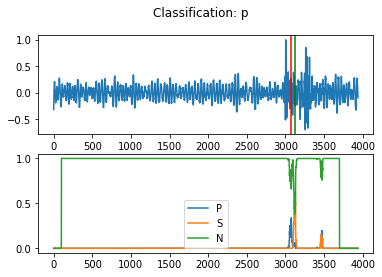

idx: 31
Origin time: 2018-10-23T14:48:46.351333Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

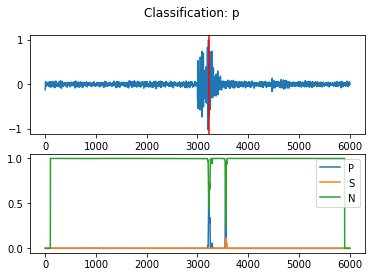

idx: 32
Origin time: 2018-10-23T14:49:00.605501Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

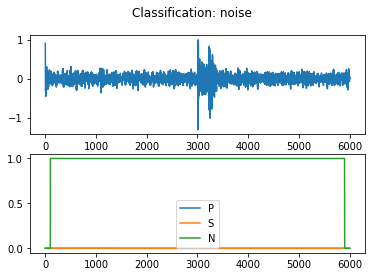

idx: 33
Origin time: 2018-10-23T14:49:48.966822Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

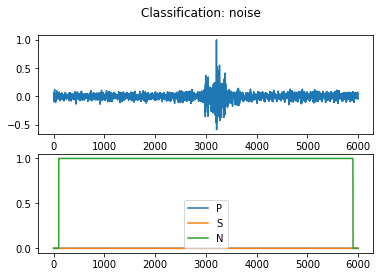

idx: 34
Origin time: 2018-10-23T14:51:51.780492Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

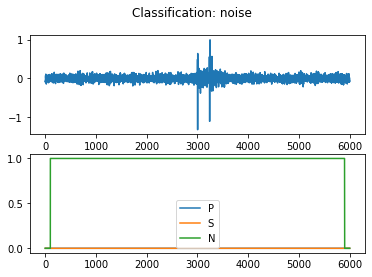

idx: 35
Origin time: 2018-10-23T14:52:02.484999Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

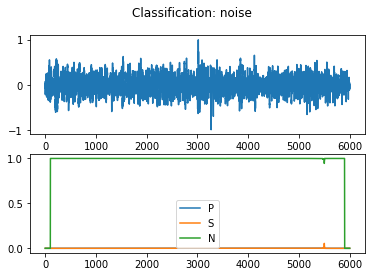

idx: 36
Origin time: 2018-10-23T14:52:36.282500Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

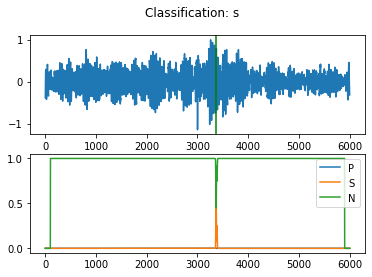

idx: 37
Origin time: 2018-10-23T14:53:38.671001Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

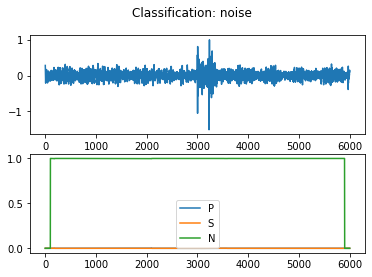

idx: 38
Origin time: 2018-10-23T14:53:42.281478Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

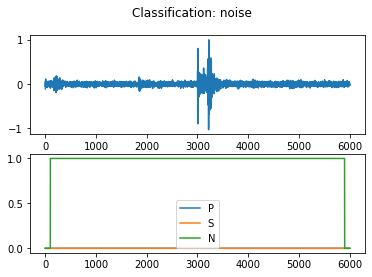

idx: 39
Origin time: 2018-10-23T14:54:25.141013Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

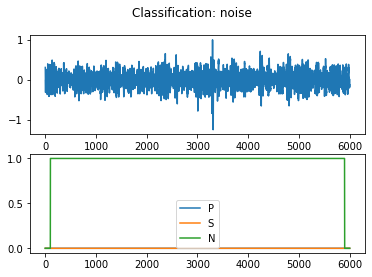

idx: 40
Origin time: 2018-10-23T14:55:58.016572Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

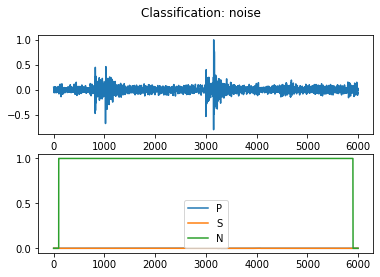

idx: 41
Origin time: 2018-10-23T14:56:27.626500Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

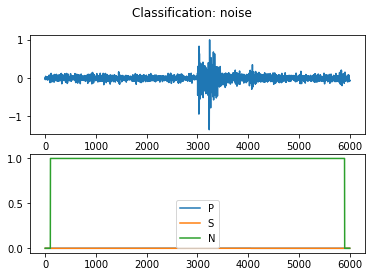

idx: 42
Origin time: 2018-10-23T14:57:04.338996Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

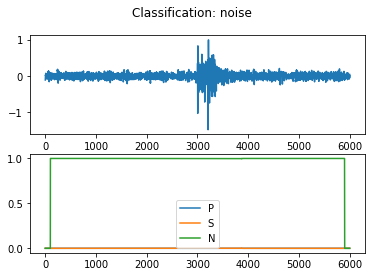

idx: 43
Origin time: 2018-10-23T14:57:33.832999Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

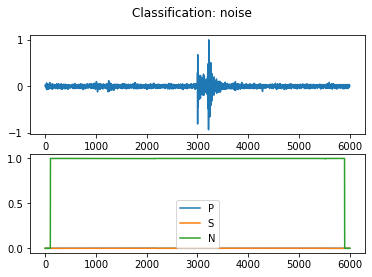

idx: 44
Origin time: 2018-10-23T14:57:41.061501Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

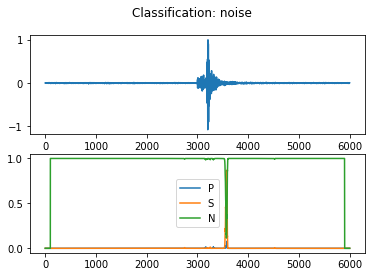

idx: 45
Origin time: 2018-10-23T14:57:49.520499Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

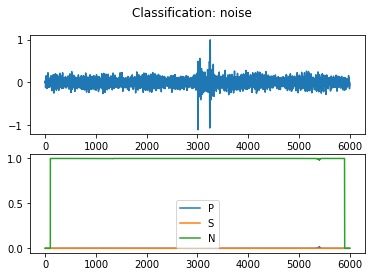

idx: 46
Origin time: 2018-10-23T14:58:02.146001Z
Station: 22.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

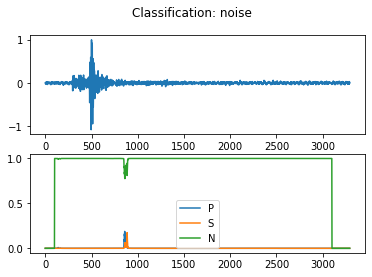

idx: 47
Origin time: 2018-10-23T14:58:05.918501Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

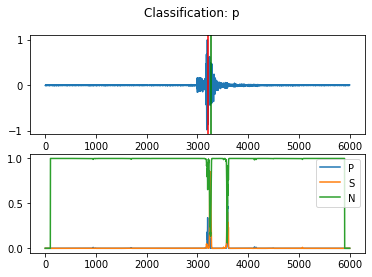

idx: 48
Origin time: 2018-10-23T14:58:39.214893Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

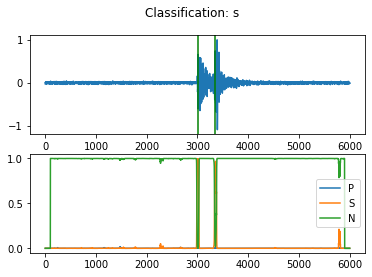

idx: 49
Origin time: 2018-10-23T14:58:48.747501Z
Station: 18.0
26/26 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

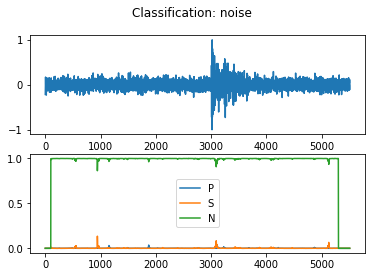

idx: 50
Origin time: 2018-10-23T14:59:02.840000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

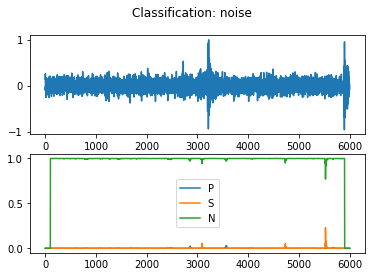

idx: 51
Origin time: 2018-10-23T14:59:16.811999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

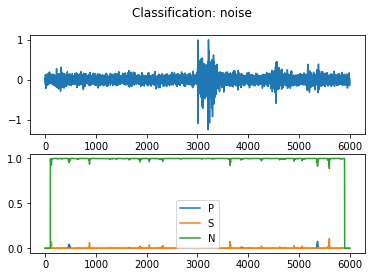

idx: 52
Origin time: 2018-10-23T14:59:19.305999Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

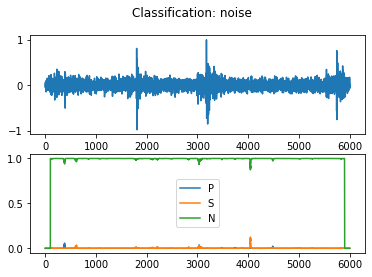

idx: 53
Origin time: 2018-10-23T14:59:24.748624Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

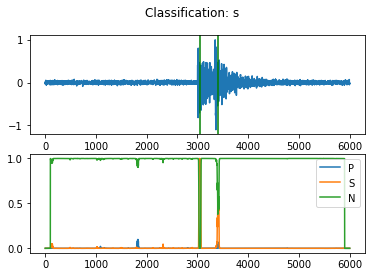

idx: 54
Origin time: 2018-10-23T14:59:29.086514Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

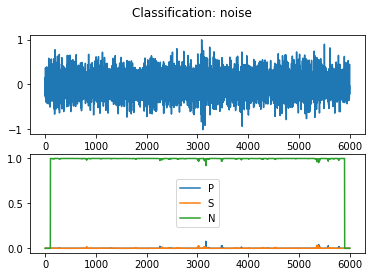

idx: 55
Origin time: 2018-10-23T14:59:37.794000Z
Station: 12.0
16/16 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

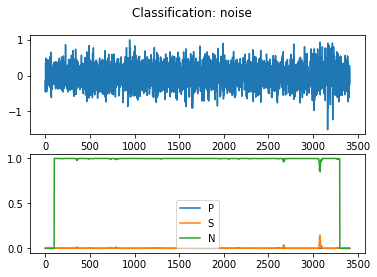

idx: 56
Origin time: 2018-10-23T14:59:38.425500Z
Station: 17.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

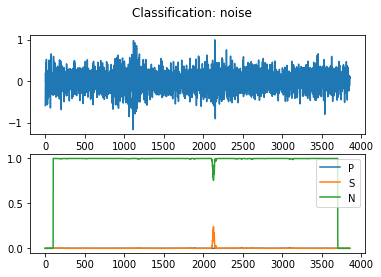

idx: 57
Origin time: 2018-10-29T09:07:44.643459Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

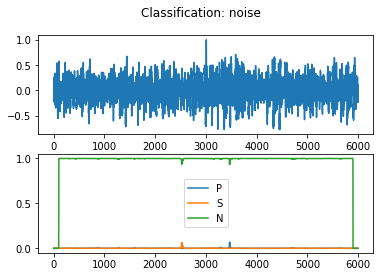

idx: 58
Origin time: 2018-10-29T09:11:10.254020Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

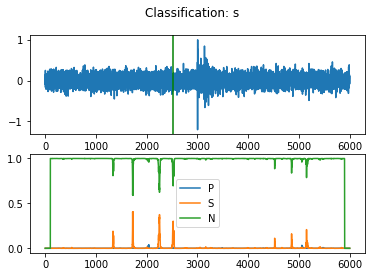

idx: 59
Origin time: 2018-10-29T09:11:28.526414Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

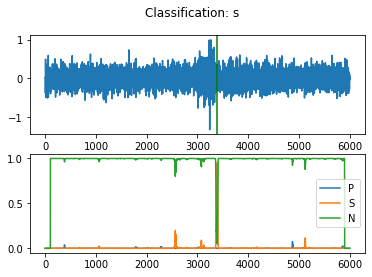

idx: 60
Origin time: 2018-10-29T09:13:16.337352Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

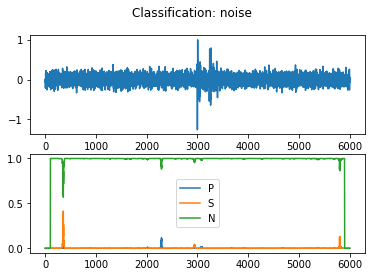

idx: 61
Origin time: 2018-10-29T09:13:27.369081Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

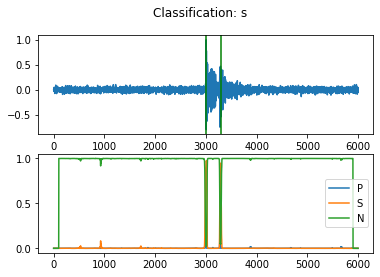

idx: 62
Origin time: 2018-10-29T09:17:59.615387Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

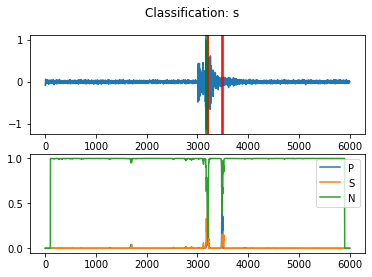

idx: 63
Origin time: 2018-10-29T09:24:15.774174Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

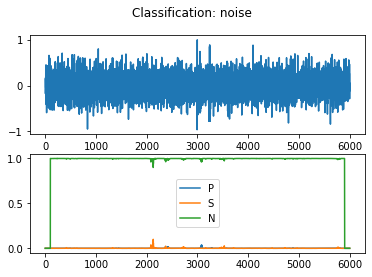

idx: 64
Origin time: 2018-10-29T09:26:05.926933Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

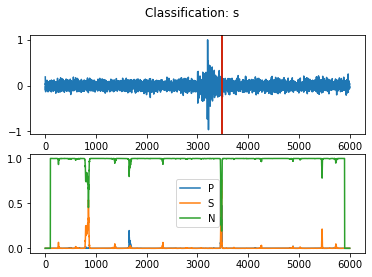

idx: 65
Origin time: 2018-10-29T09:29:51.416275Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

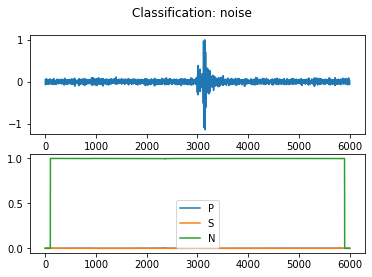

idx: 66
Origin time: 2018-10-29T09:30:20.500192Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

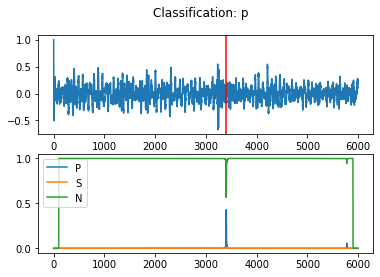

idx: 67
Origin time: 2018-10-29T09:31:18.404956Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

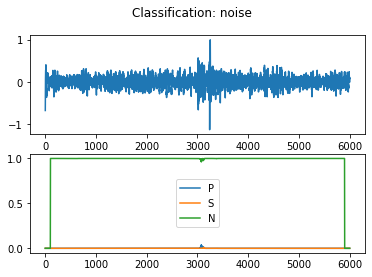

idx: 68
Origin time: 2018-10-29T09:31:40.936847Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

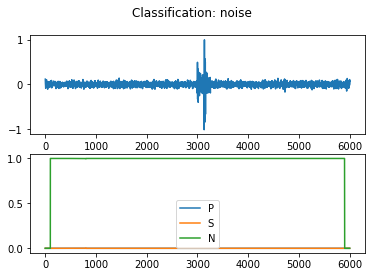

idx: 69
Origin time: 2018-10-29T09:31:48.083910Z
Station: 14.0
24/24 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

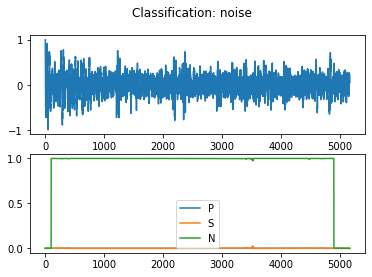

idx: 70
Origin time: 2018-10-29T09:31:50.477337Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

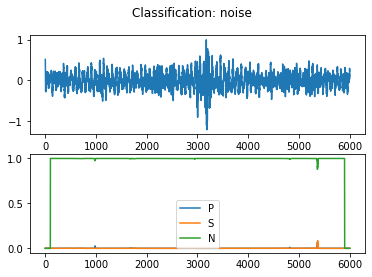

idx: 71
Origin time: 2018-10-29T09:31:58.929528Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

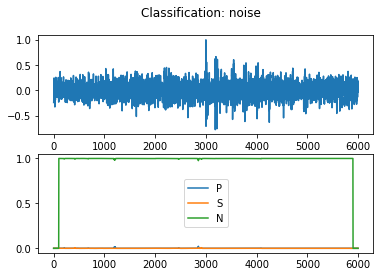

idx: 72
Origin time: 2018-10-29T09:32:39.978250Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

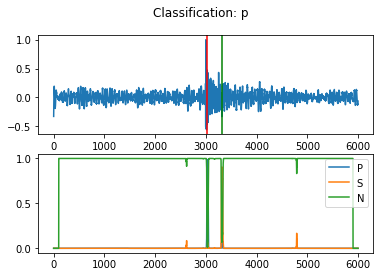

idx: 73
Origin time: 2018-10-29T09:50:49.513060Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

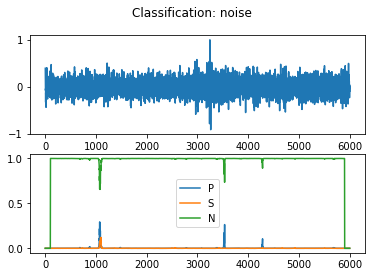

idx: 74
Origin time: 2018-10-29T09:53:28.841347Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

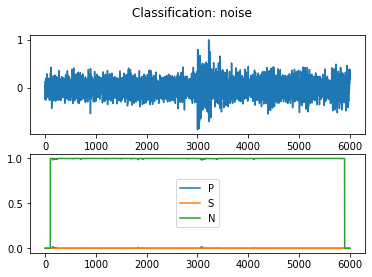

idx: 75
Origin time: 2018-10-29T09:57:34.818267Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

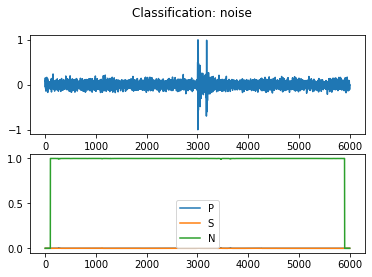

idx: 76
Origin time: 2018-10-29T09:58:53.263098Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

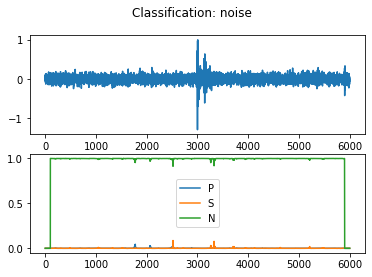

idx: 77
Origin time: 2018-10-29T09:59:25.915310Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

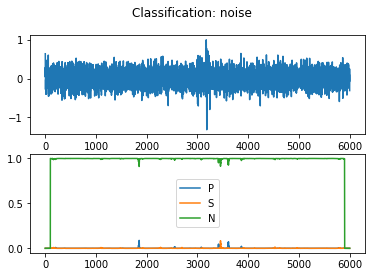

idx: 78
Origin time: 2018-10-29T09:59:31.422156Z
Station: 22.0
18/18 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

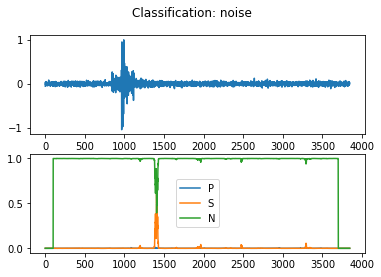

idx: 79
Origin time: 2018-12-11T09:19:19.330001Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

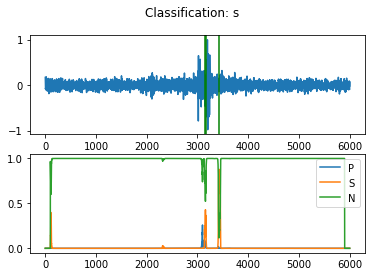

idx: 80
Origin time: 2018-12-11T09:22:29.117658Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

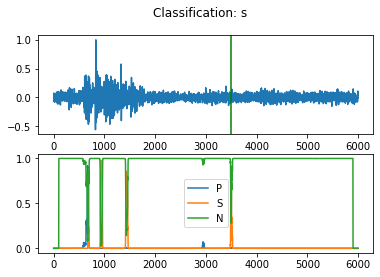

idx: 81
Origin time: 2018-12-11T09:25:21.915001Z
Station: 23.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

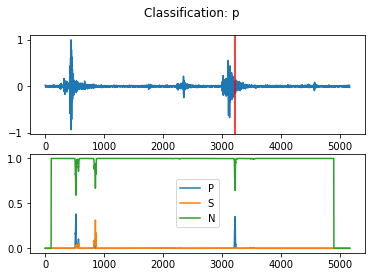

idx: 82
Origin time: 2018-12-11T09:25:56.050501Z
Station: 5.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

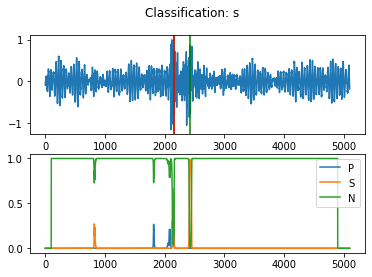

idx: 83
Origin time: 2018-12-11T09:27:07.731999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

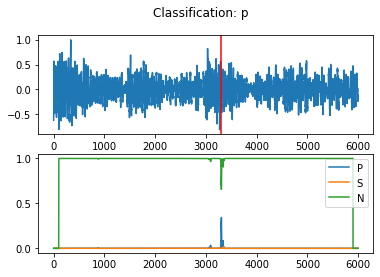

idx: 84
Origin time: 2018-12-11T09:27:26.409002Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

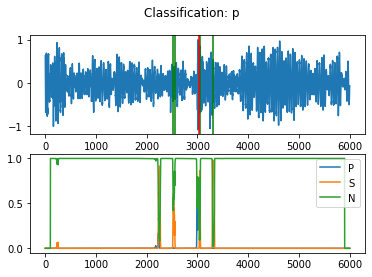

idx: 85
Origin time: 2018-12-11T09:28:28.721000Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

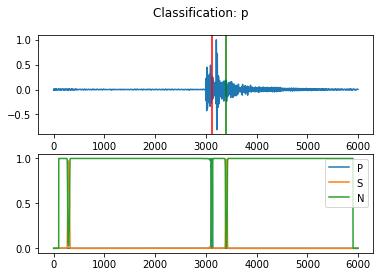

idx: 86
Origin time: 2018-12-11T09:33:02.932002Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

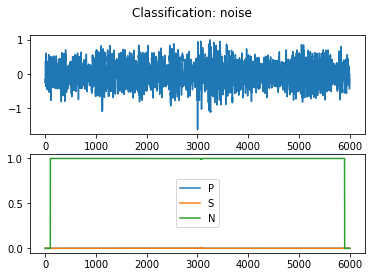

idx: 87
Origin time: 2018-12-11T09:33:41.199497Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

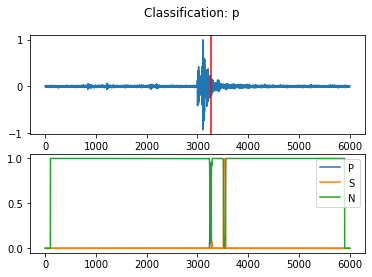

idx: 88
Origin time: 2018-12-11T09:37:45.932116Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

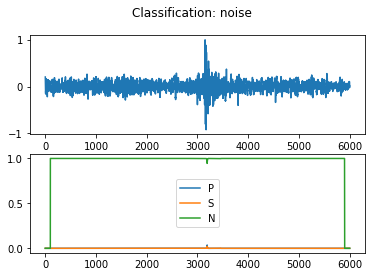

idx: 89
Origin time: 2018-12-11T09:41:22.845110Z
Station: 4.0
15/15 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

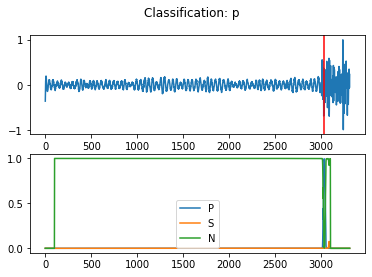

idx: 90
Origin time: 2018-12-11T09:42:20.740003Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

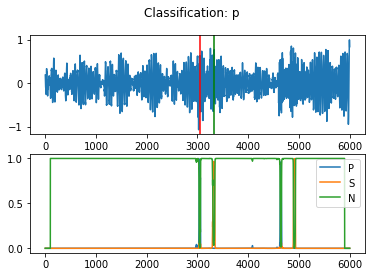

idx: 91
Origin time: 2018-12-11T09:43:38.506276Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

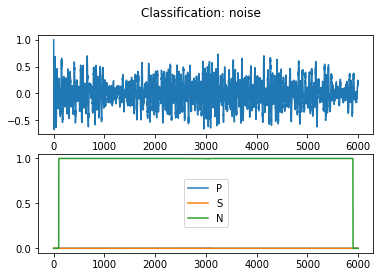

idx: 92
Origin time: 2018-12-11T09:50:33.846501Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

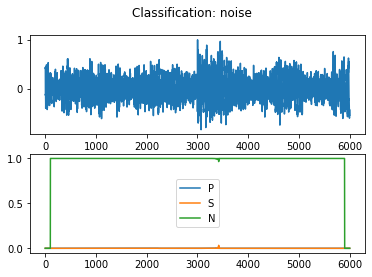

idx: 93
Origin time: 2018-12-11T09:50:50.095503Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

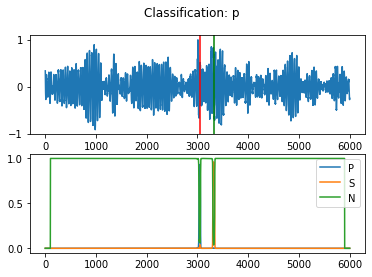

idx: 94
Origin time: 2018-12-11T09:52:46.646497Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

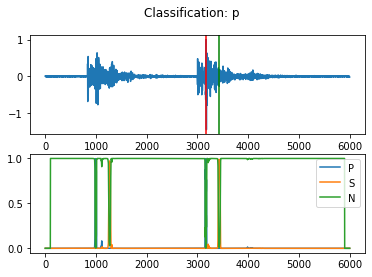

idx: 95
Origin time: 2018-12-11T09:54:57.795501Z
Station: 24.0
26/26 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

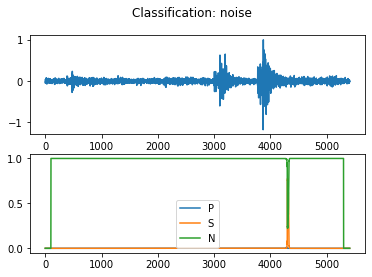

idx: 96
Origin time: 2018-12-11T09:55:23.110502Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

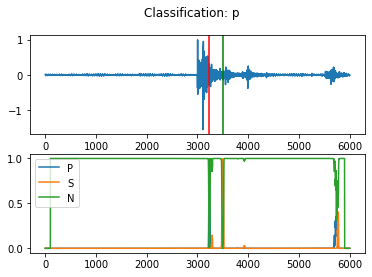

idx: 97
Origin time: 2018-12-11T09:55:58.204001Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

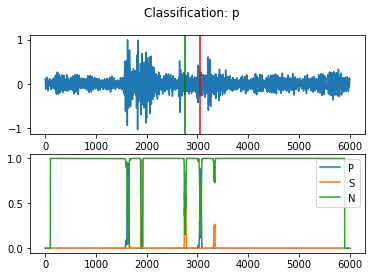

idx: 98
Origin time: 2018-12-11T09:57:28.467947Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

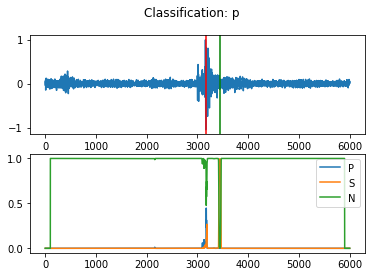

idx: 99
Origin time: 2018-12-11T09:59:12.796001Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

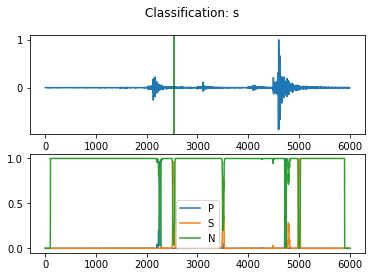

idx: 100
Origin time: 2018-12-11T11:21:15.789824Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

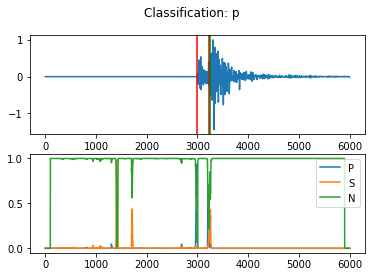

idx: 101
Origin time: 2018-10-29T11:30:39.454076Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

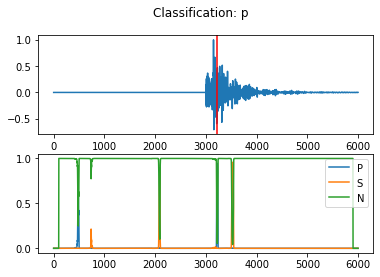

idx: 102
Origin time: 2018-10-29T18:01:12.670937Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

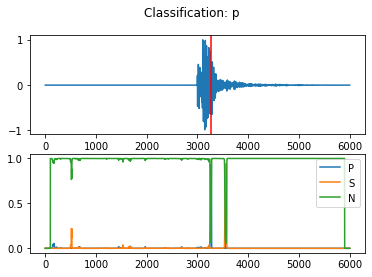

idx: 103
Origin time: 2018-10-26T11:36:59.057398Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

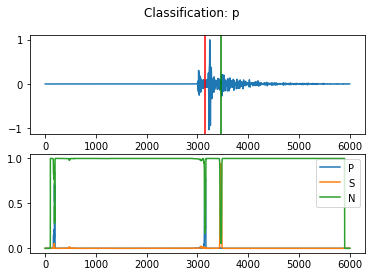

idx: 104
Origin time: 2018-10-27T10:55:25.828788Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

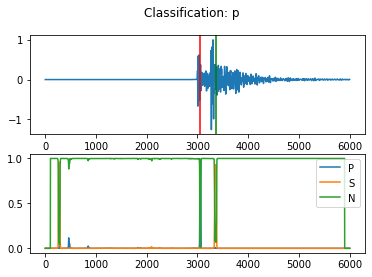

idx: 105
Origin time: 2018-11-04T16:24:06.636114Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

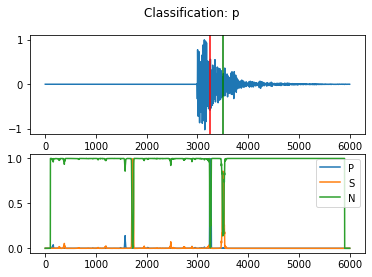

idx: 106
Origin time: 2018-10-24T13:02:29.636215Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

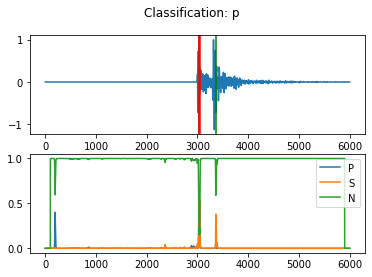

idx: 107
Origin time: 2018-10-25T14:59:27.650128Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

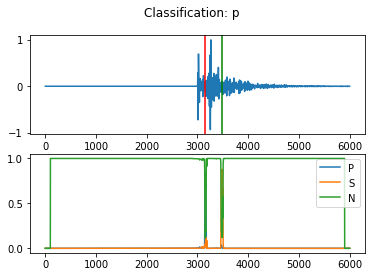

idx: 108
Origin time: 2018-10-23T14:45:32.711670Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

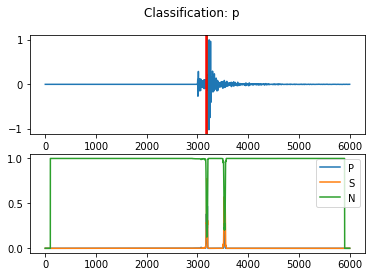

idx: 109
Origin time: 2018-12-14T13:41:06.077303Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

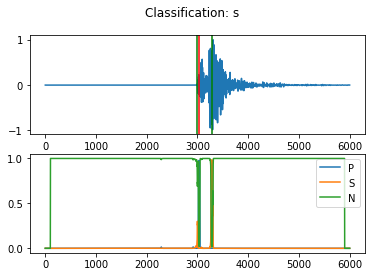

idx: 110
Origin time: 2018-10-25T17:00:34.353072Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

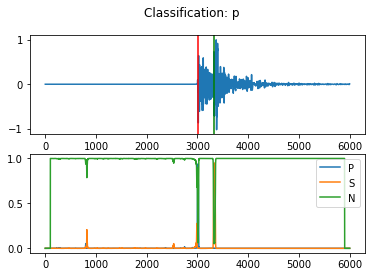

idx: 111
Origin time: 2018-10-26T11:26:45.125376Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

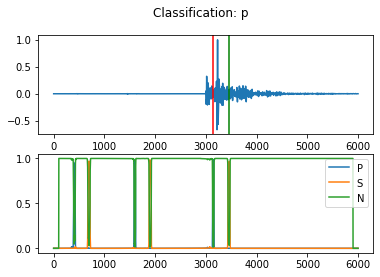

idx: 112
Origin time: 2018-12-11T09:53:31.523274Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

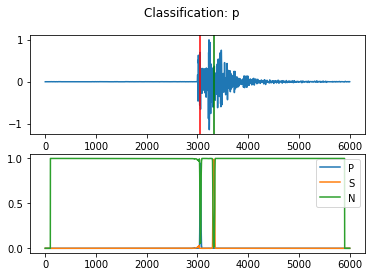

idx: 113
Origin time: 2018-10-29T11:58:35.007222Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

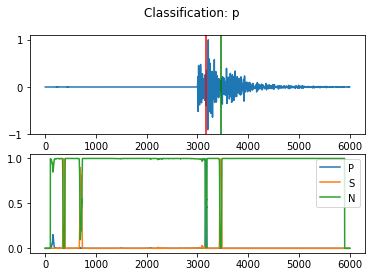

idx: 114
Origin time: 2018-12-11T10:06:45.020583Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

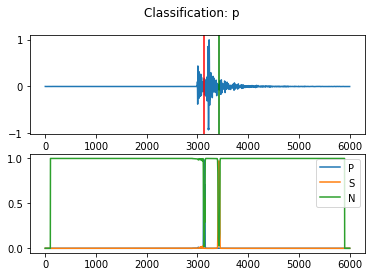

idx: 115
Origin time: 2018-12-14T13:09:51.883000Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

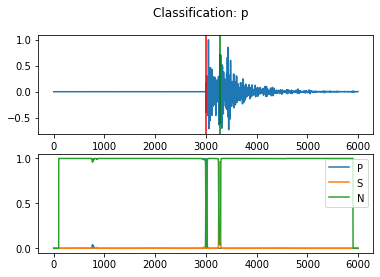

idx: 116
Origin time: 2018-12-11T09:35:01.573777Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

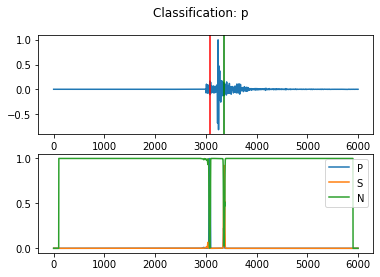

idx: 117
Origin time: 2018-10-26T20:39:23.234610Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

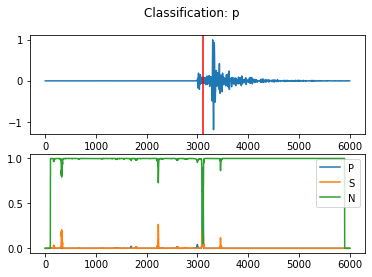

idx: 118
Origin time: 2018-10-24T13:26:26.808736Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

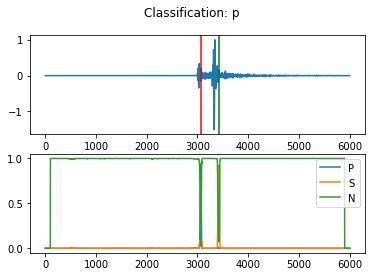

idx: 119
Origin time: 2018-12-14T14:51:57.048504Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

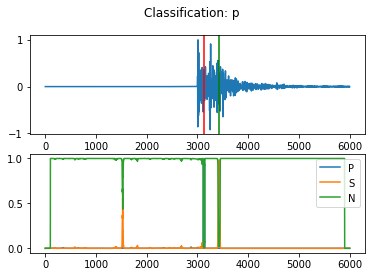

idx: 120
Origin time: 2018-12-13T13:25:17.197558Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

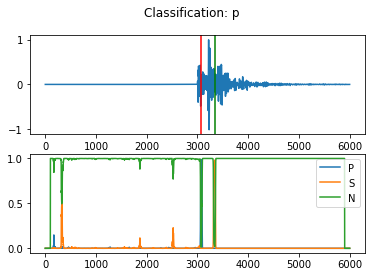

idx: 121
Origin time: 2018-12-08T12:28:22.481485Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

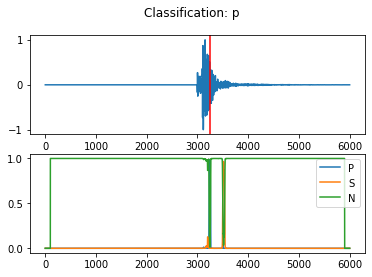

idx: 122
Origin time: 2018-10-25T15:06:05.002139Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

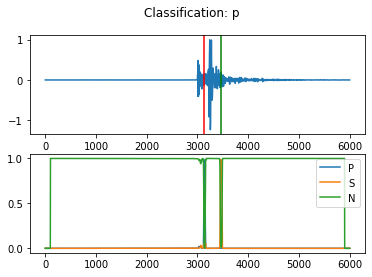

idx: 123
Origin time: 2018-10-24T23:56:13.326137Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

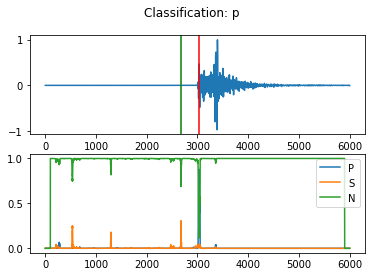

idx: 124
Origin time: 2018-10-25T12:40:56.946937Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

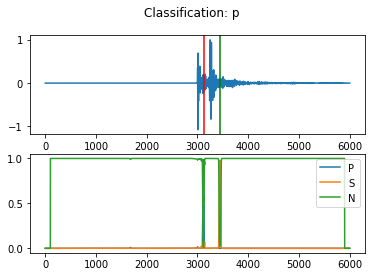

idx: 125
Origin time: 2018-10-18T15:48:53.843427Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

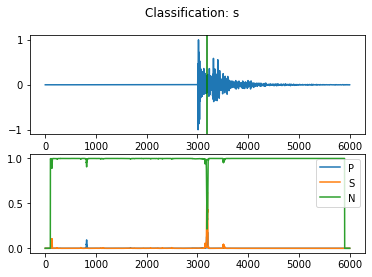

idx: 126
Origin time: 2018-12-11T10:34:35.715646Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

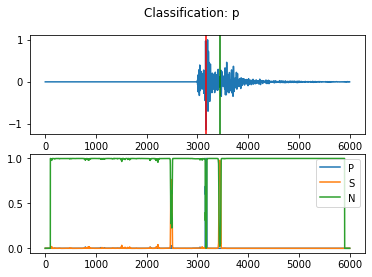

idx: 127
Origin time: 2018-10-29T21:13:59.087642Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

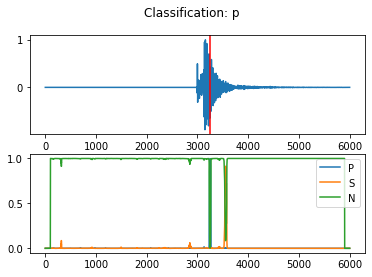

idx: 128
Origin time: 2018-10-30T01:37:37.940873Z
Station: 16.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

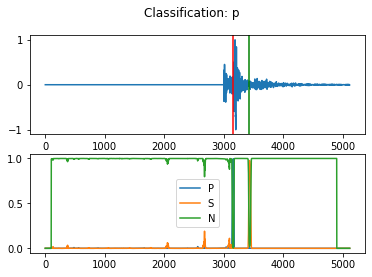

idx: 129
Origin time: 2018-10-27T11:44:31.601597Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

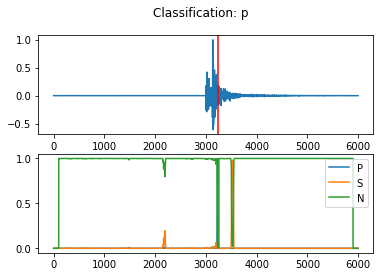

idx: 130
Origin time: 2018-12-11T10:18:47.021932Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

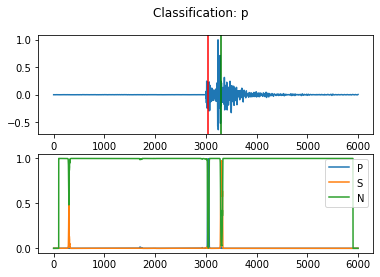

idx: 131
Origin time: 2018-10-20T03:44:01.674986Z
Station: 14.0
27/27 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

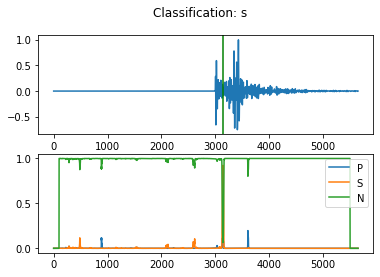

idx: 132
Origin time: 2018-10-29T11:44:42.301886Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

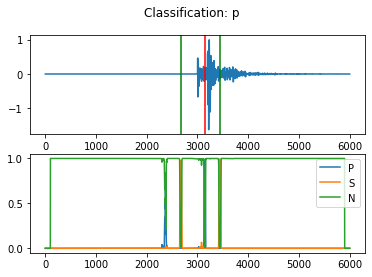

idx: 133
Origin time: 2018-10-19T13:20:48.941106Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

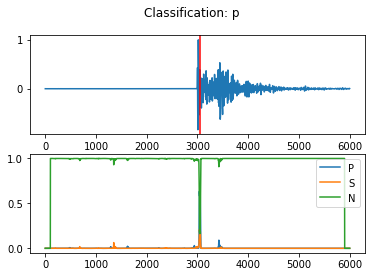

idx: 134
Origin time: 2018-10-25T14:56:28.583150Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

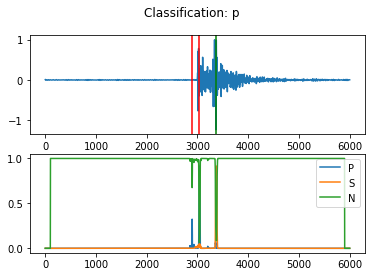

idx: 135
Origin time: 2018-10-26T02:13:02.095291Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

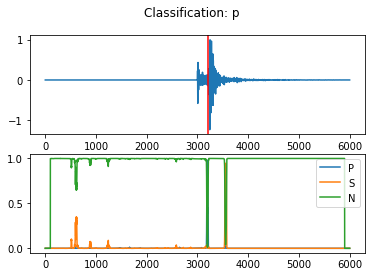

idx: 136
Origin time: 2018-12-10T10:30:58.274963Z
Station: 18.0
21/21 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

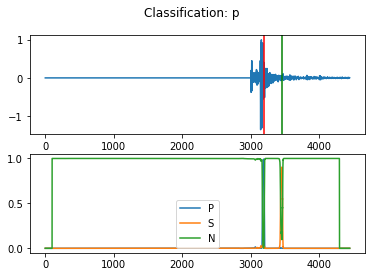

idx: 137
Origin time: 2018-12-11T10:20:27.958469Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

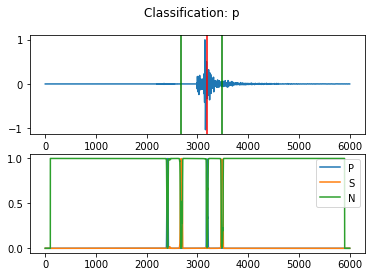

idx: 138
Origin time: 2018-10-27T11:07:17.101670Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

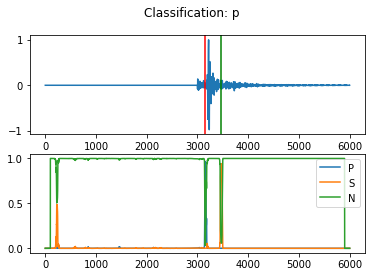

idx: 139
Origin time: 2018-12-14T13:06:37.273000Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

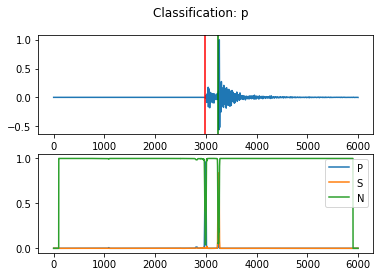

idx: 140
Origin time: 2018-10-26T14:14:04.164392Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

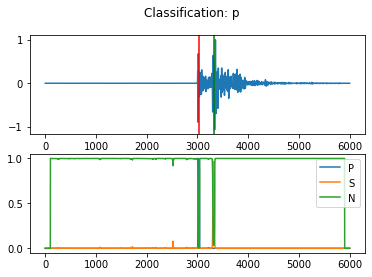

idx: 141
Origin time: 2018-10-26T11:17:03.233776Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

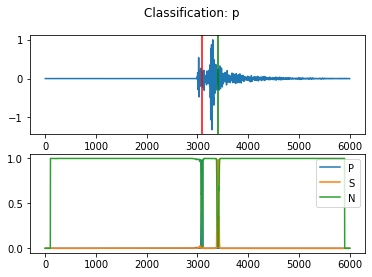

idx: 142
Origin time: 2018-12-14T13:18:30.691496Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

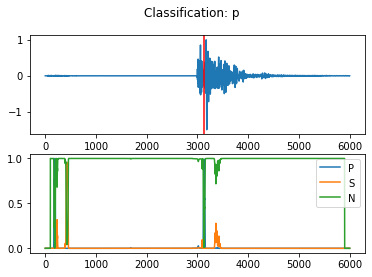

idx: 143
Origin time: 2018-12-11T09:34:03.715759Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

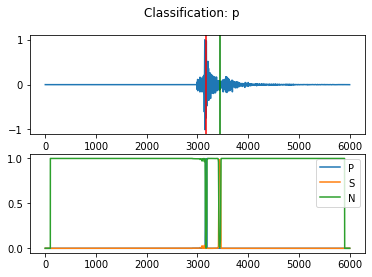

idx: 144
Origin time: 2018-10-25T17:04:13.757001Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

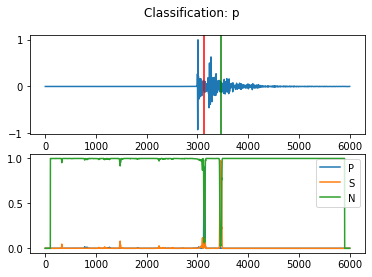

idx: 145
Origin time: 2018-10-24T13:19:00.979000Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

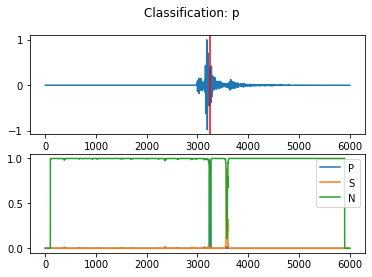

idx: 146
Origin time: 2018-10-29T11:43:29.819477Z
Station: 24.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

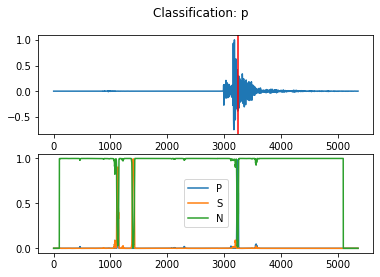

idx: 147
Origin time: 2018-10-25T15:24:29.087999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

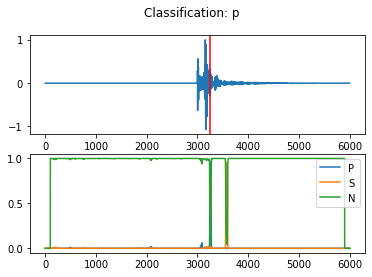

idx: 148
Origin time: 2018-10-24T12:57:14.216501Z
Station: 16.0
16/16 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

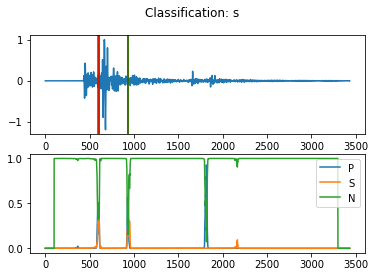

idx: 149
Origin time: 2018-10-25T15:22:59.360499Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

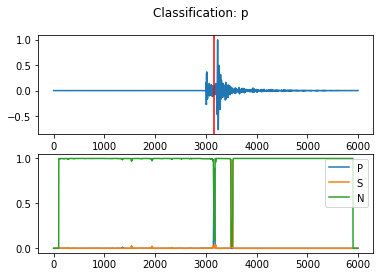

idx: 150
Origin time: 2018-12-15T09:40:07.480999Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

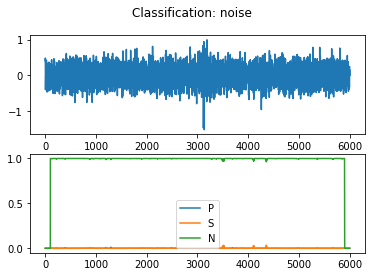

idx: 151
Origin time: 2018-12-14T19:22:45.398000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

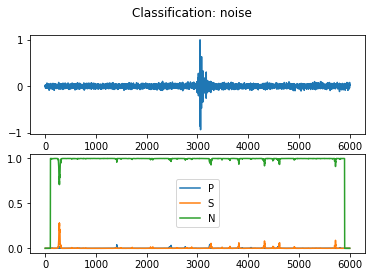

idx: 152
Origin time: 2018-12-15T05:14:05.633001Z
Station: 20.0
17/17 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

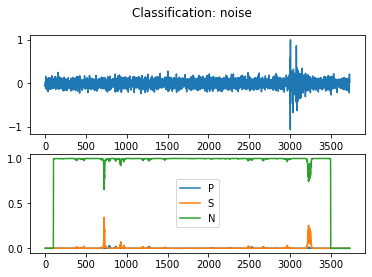

idx: 153
Origin time: 2018-12-14T20:17:15.697500Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

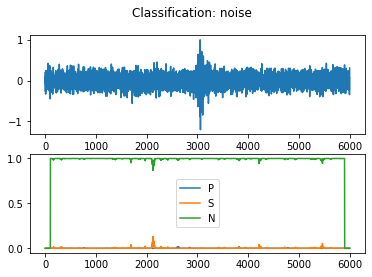

idx: 154
Origin time: 2018-12-18T02:37:07.020323Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

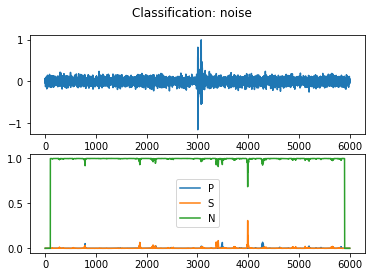

idx: 155
Origin time: 2018-12-18T08:08:33.504378Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

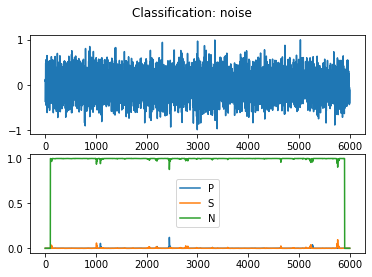

idx: 156
Origin time: 2018-12-14T19:05:19.806270Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

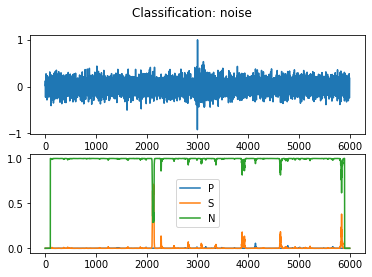

idx: 157
Origin time: 2018-12-17T17:53:15.515503Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

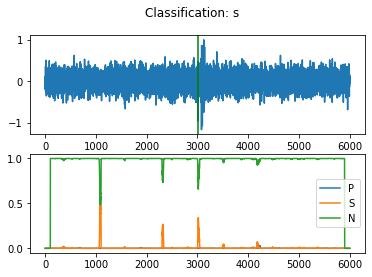

idx: 158
Origin time: 2018-12-18T08:09:11.658826Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

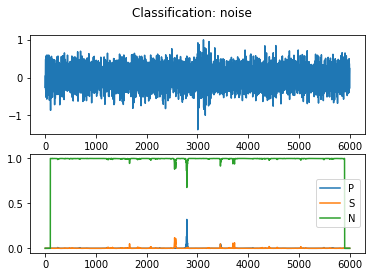

idx: 159
Origin time: 2018-12-18T00:16:31.276860Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

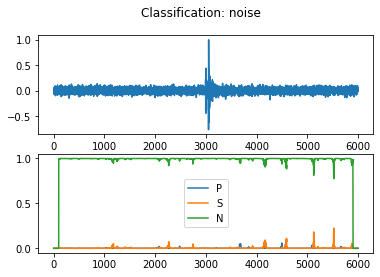

idx: 160
Origin time: 2018-12-15T04:24:17.902999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

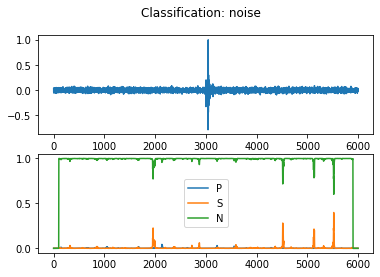

idx: 161
Origin time: 2018-12-17T18:23:08.029902Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

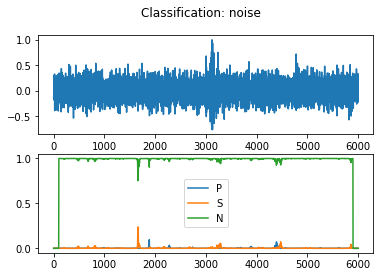

idx: 162
Origin time: 2018-12-17T17:35:41.060749Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

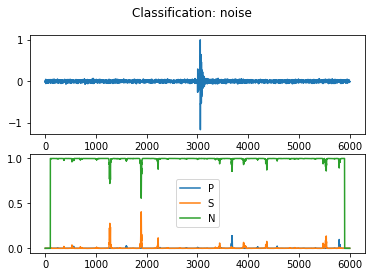

idx: 163
Origin time: 2018-12-14T15:45:00.567000Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

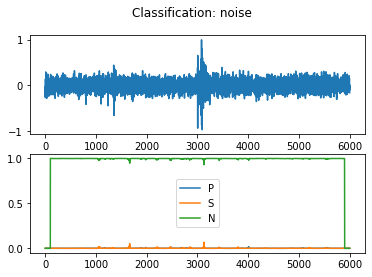

idx: 164
Origin time: 2018-12-17T19:39:35.712497Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

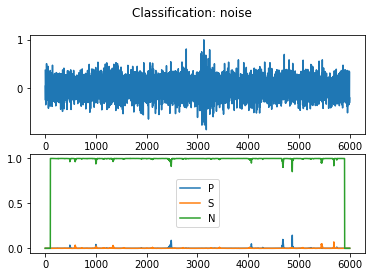

idx: 165
Origin time: 2018-12-18T00:20:43.160939Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

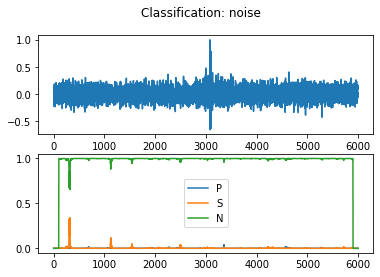

idx: 166
Origin time: 2018-12-18T00:39:03.195666Z
Station: 21.0
25/25 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

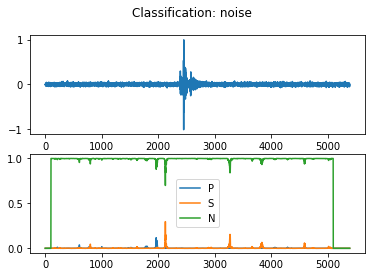

idx: 167
Origin time: 2018-12-15T03:05:17.585441Z
Station: 19.0
18/18 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

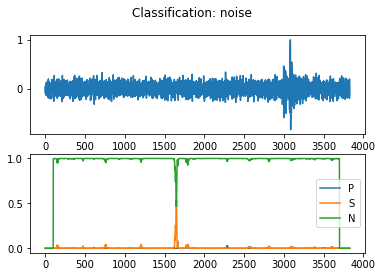

idx: 168
Origin time: 2018-12-18T03:38:55.733431Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

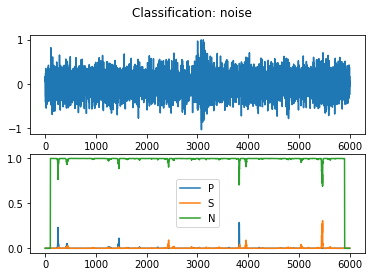

idx: 169
Origin time: 2018-12-18T04:16:03.704612Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

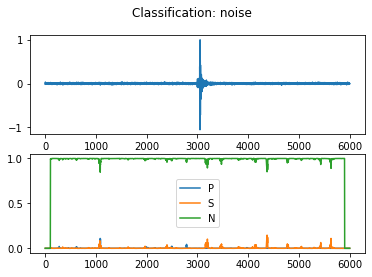

idx: 170
Origin time: 2018-12-18T03:49:23.533724Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

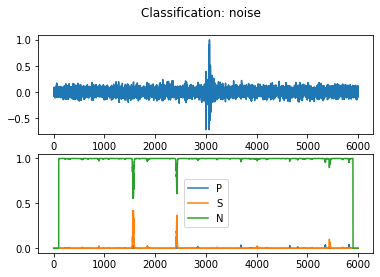

idx: 171
Origin time: 2018-12-14T20:53:07.908002Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

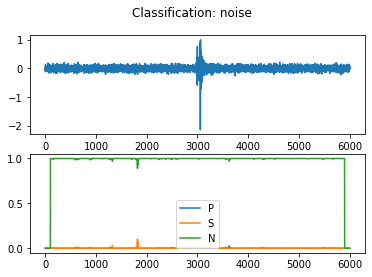

idx: 172
Origin time: 2018-12-17T16:25:31.883592Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

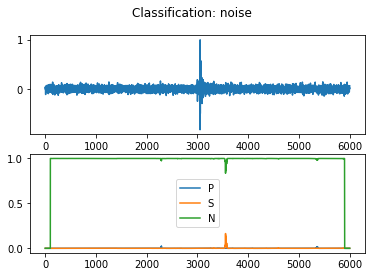

idx: 173
Origin time: 2018-12-14T14:59:46.966501Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

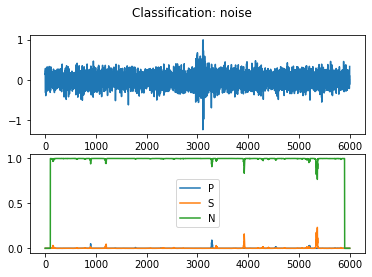

idx: 174
Origin time: 2018-12-17T22:22:55.276300Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

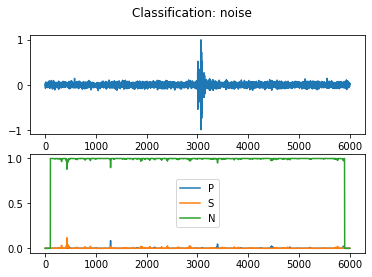

idx: 175
Origin time: 2018-12-17T23:33:57.732907Z
Station: 23.0
16/16 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

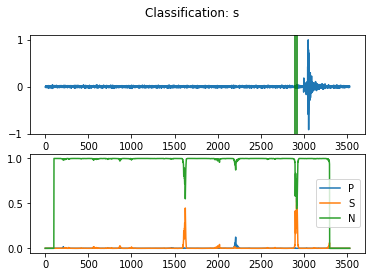

idx: 176
Origin time: 2018-12-18T01:05:38.823657Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

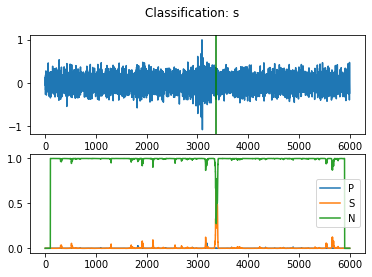

idx: 177
Origin time: 2018-12-17T20:33:53.932724Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

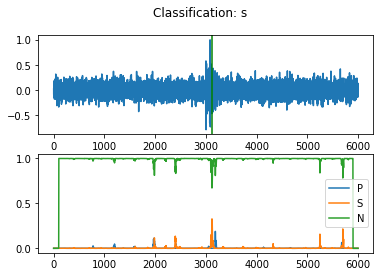

idx: 178
Origin time: 2018-12-14T19:41:43.665502Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

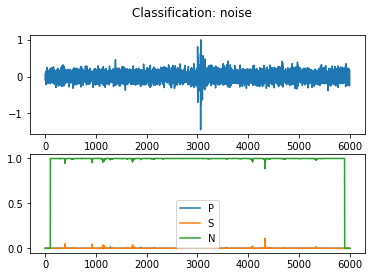

idx: 179
Origin time: 2018-12-18T05:43:59.400138Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

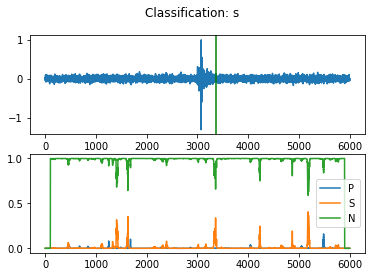

idx: 180
Origin time: 2018-12-14T16:34:59.766000Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

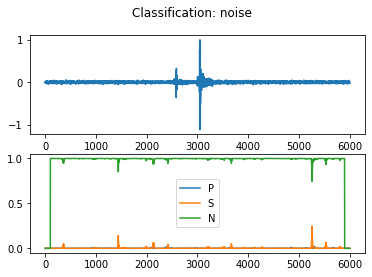

idx: 181
Origin time: 2018-12-18T02:14:27.914875Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

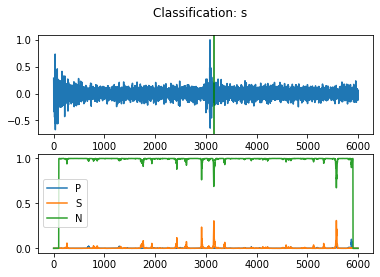

idx: 182
Origin time: 2018-12-17T23:51:17.467954Z
Station: 19.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

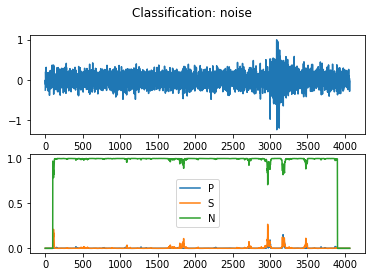

idx: 183
Origin time: 2018-12-18T08:22:58.026358Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

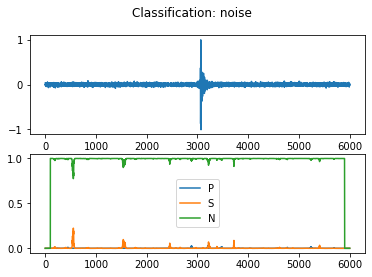

idx: 184
Origin time: 2018-12-14T17:22:42.640499Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

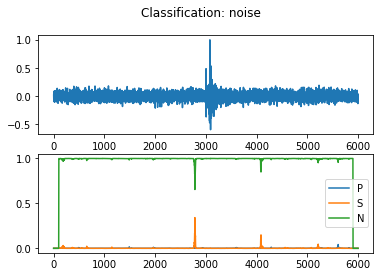

idx: 185
Origin time: 2018-12-15T03:03:12.631500Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

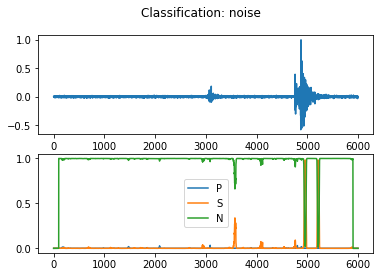

idx: 186
Origin time: 2018-12-17T18:35:58.840838Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

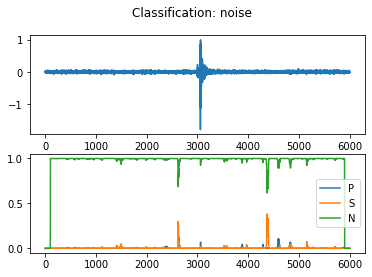

idx: 187
Origin time: 2018-12-15T04:53:41.508500Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

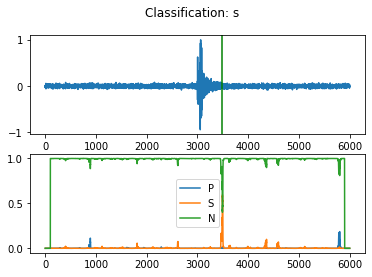

idx: 188
Origin time: 2018-12-17T19:46:31.521621Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

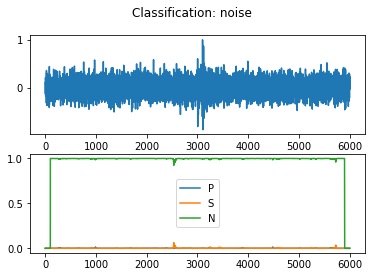

idx: 189
Origin time: 2018-12-18T01:06:05.309945Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

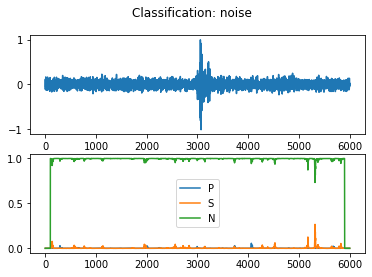

idx: 190
Origin time: 2018-12-14T15:03:35.496500Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

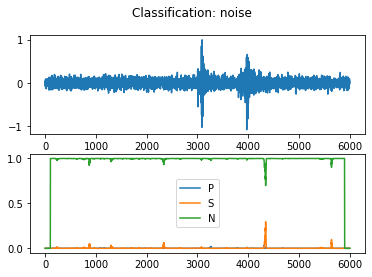

idx: 191
Origin time: 2018-12-18T04:02:55.289356Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

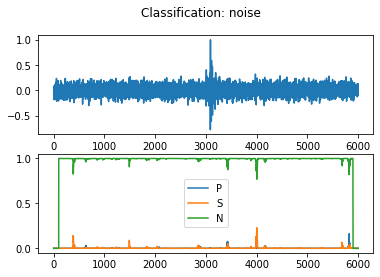

idx: 192
Origin time: 2018-12-14T17:35:11.880328Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

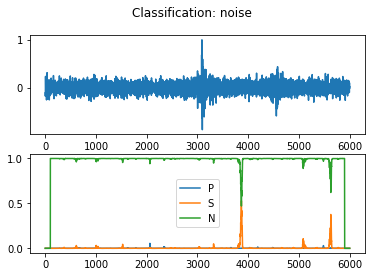

idx: 193
Origin time: 2018-12-17T21:07:05.373411Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

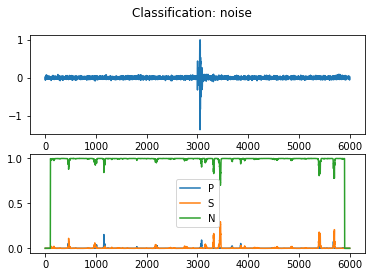

idx: 194
Origin time: 2018-12-14T20:25:16.001501Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

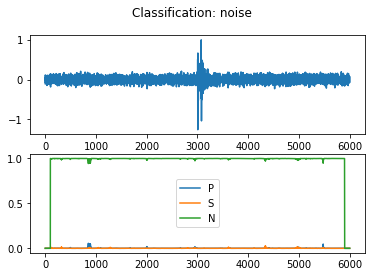

idx: 195
Origin time: 2018-12-18T05:28:27.131603Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

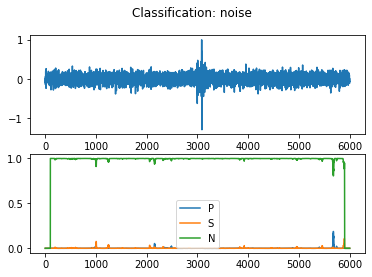

idx: 196
Origin time: 2018-12-15T04:40:32.529846Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

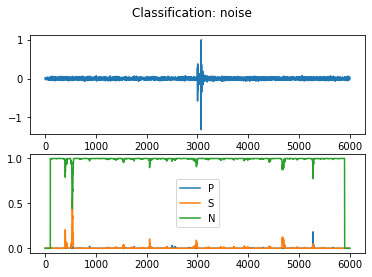

idx: 197
Origin time: 2018-12-14T15:59:47.892001Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

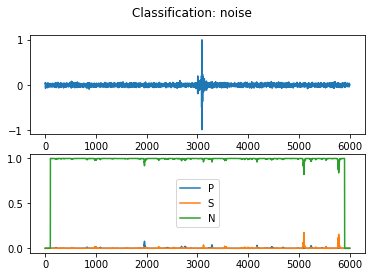

idx: 198
Origin time: 2018-12-17T19:05:27.008105Z
Station: 17.0
24/24 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

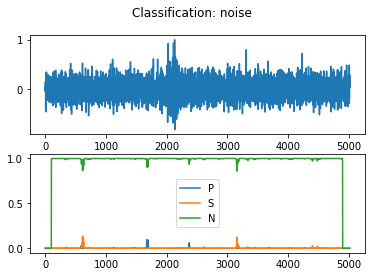

idx: 199
Origin time: 2018-12-15T14:18:26.958000Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

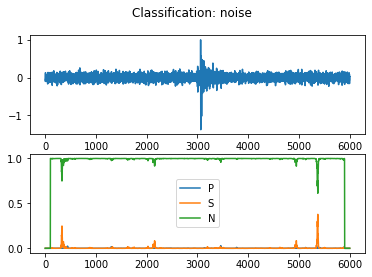

idx: 200
Origin time: 2018-10-16T13:50:02.924497Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

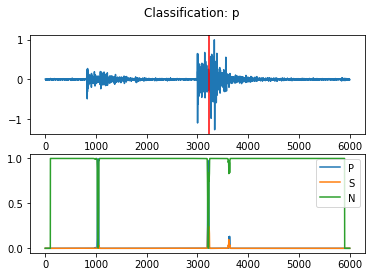

idx: 201
Origin time: 2018-10-18T14:36:56.181577Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

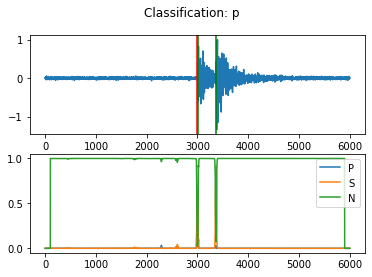

idx: 202
Origin time: 2018-10-18T15:28:10.272497Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

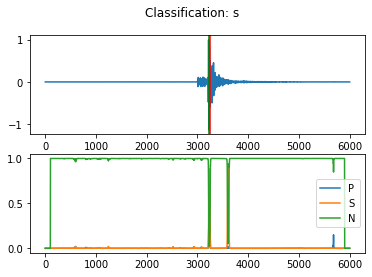

idx: 203
Origin time: 2018-10-22T11:50:58.158499Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

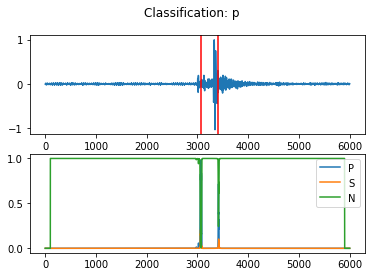

idx: 204
Origin time: 2018-10-24T13:39:32.515000Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

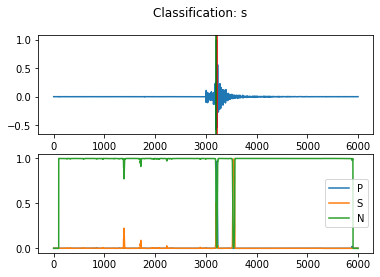

idx: 205
Origin time: 2018-10-24T13:50:30.223500Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

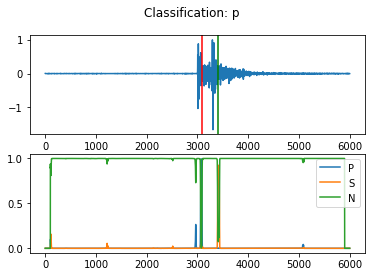

idx: 206
Origin time: 2018-10-25T11:35:08.913999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

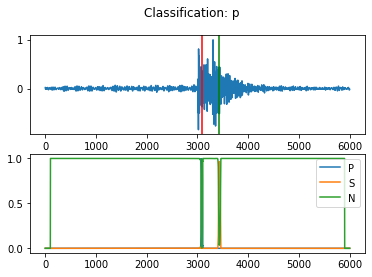

idx: 207
Origin time: 2018-10-25T12:06:05.909500Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

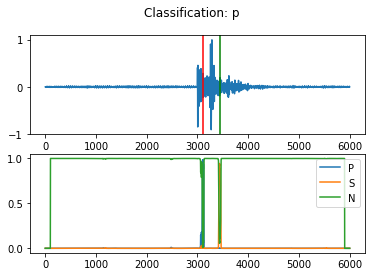

idx: 208
Origin time: 2018-10-25T13:06:04.277500Z
Station: 13.0
26/26 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

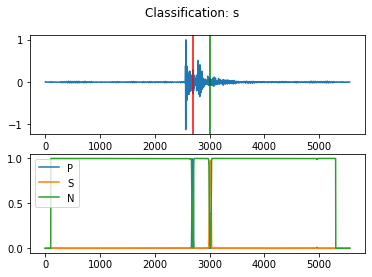

idx: 209
Origin time: 2018-10-25T13:24:57.788499Z
Station: 23.0
26/26 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

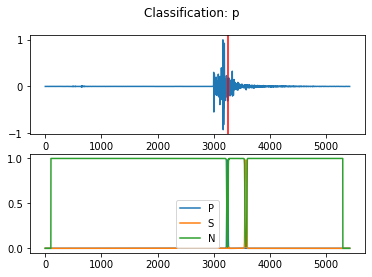

idx: 210
Origin time: 2018-10-25T14:51:08.881501Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

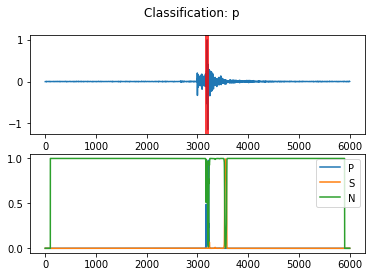

idx: 211
Origin time: 2018-10-25T15:21:02.453500Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

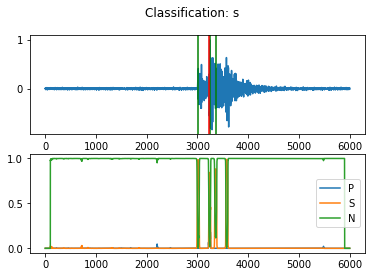

idx: 212
Origin time: 2018-10-25T15:29:13.917499Z
Station: 21.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

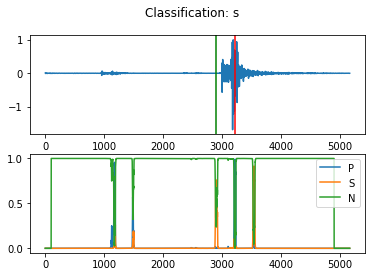

idx: 213
Origin time: 2018-10-26T08:41:33.795720Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

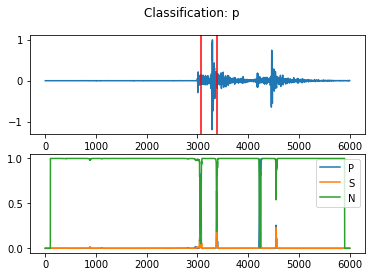

idx: 214
Origin time: 2018-10-26T11:10:38.657499Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

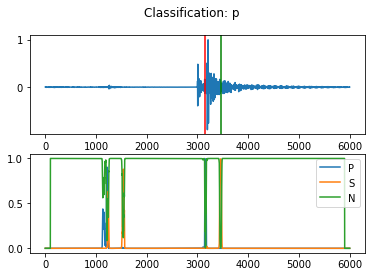

idx: 215
Origin time: 2018-10-27T11:03:25.526501Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

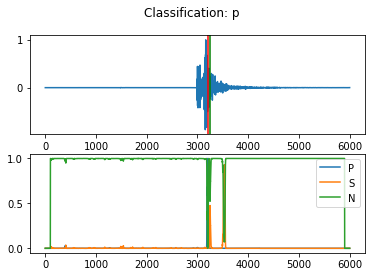

idx: 216
Origin time: 2018-10-27T11:07:27.888499Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

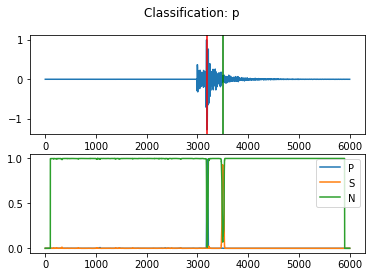

idx: 217
Origin time: 2018-10-30T14:44:13.923515Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

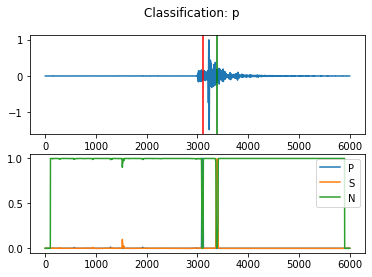

idx: 218
Origin time: 2018-10-31T08:22:53.489743Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

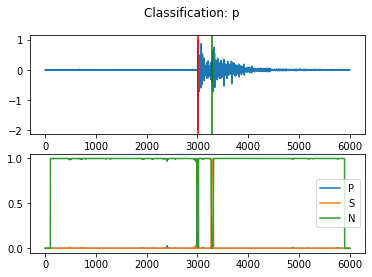

idx: 219
Origin time: 2018-10-31T10:41:20.384942Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

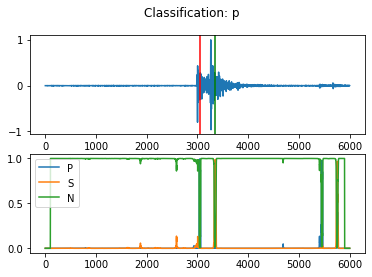

idx: 220
Origin time: 2018-12-09T21:15:05.014503Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

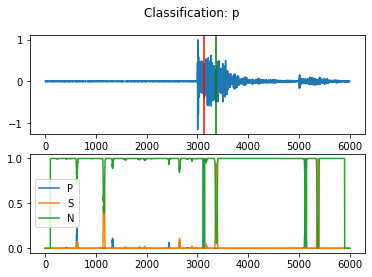

idx: 221
Origin time: 2018-12-10T12:38:47.935501Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

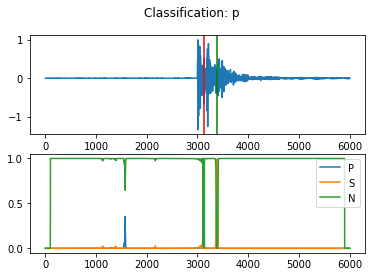

idx: 222
Origin time: 2018-12-11T10:02:18.606499Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

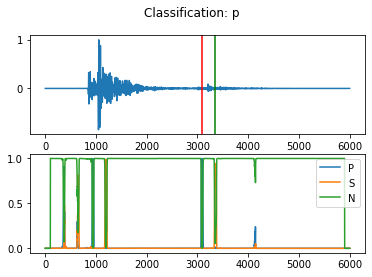

idx: 223
Origin time: 2018-12-14T13:08:09.814999Z
Station: 21.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

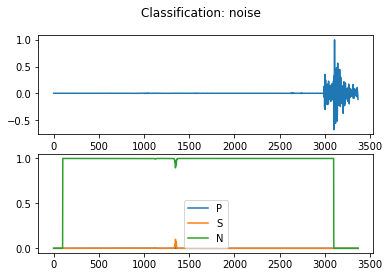

idx: 224
Origin time: 2018-12-14T14:29:28.460495Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

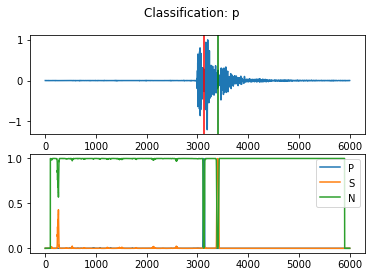

idx: 225
Origin time: 2018-10-16T14:19:06.627500Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

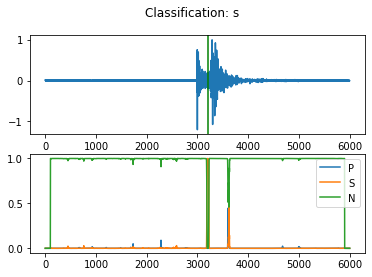

idx: 226
Origin time: 2018-10-16T15:09:03.666004Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

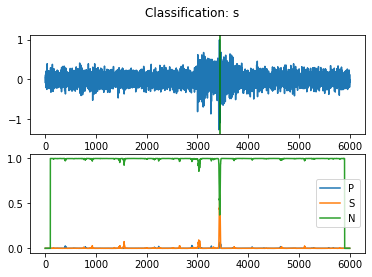

idx: 227
Origin time: 2018-10-17T17:42:02.122497Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

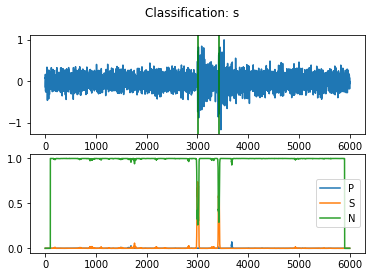

idx: 228
Origin time: 2018-10-17T18:08:09.617003Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

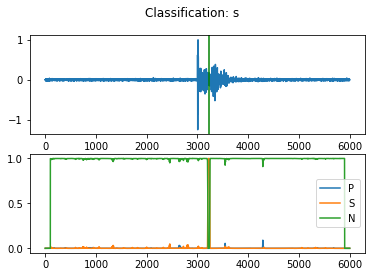

idx: 229
Origin time: 2018-10-18T14:33:02.117499Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

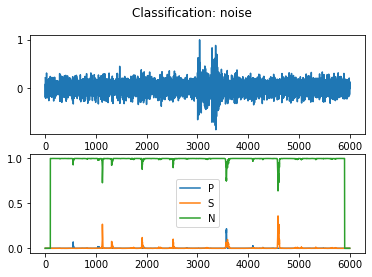

idx: 230
Origin time: 2018-10-18T14:51:27.391075Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

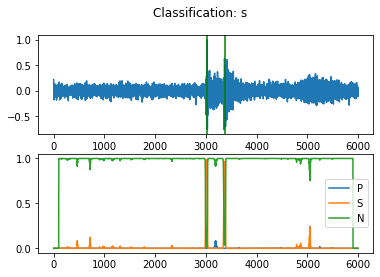

idx: 231
Origin time: 2018-10-19T12:51:45.276329Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

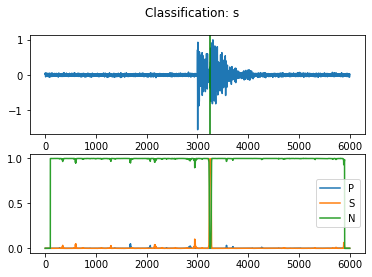

idx: 232
Origin time: 2018-10-22T22:16:28.287965Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

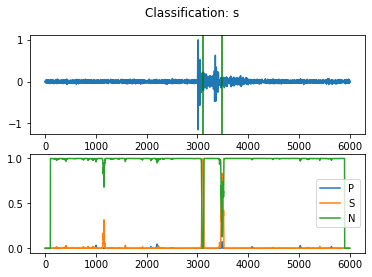

idx: 233
Origin time: 2018-10-25T11:39:17.122878Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

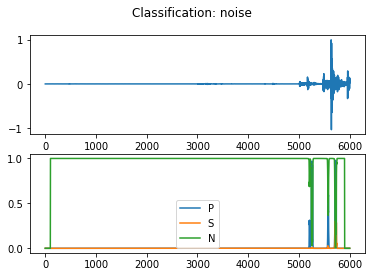

idx: 234
Origin time: 2018-10-25T12:17:17.783881Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

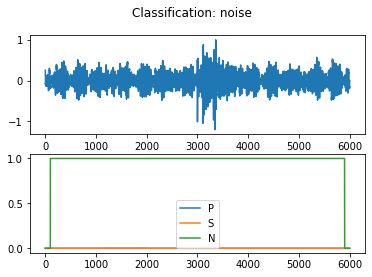

idx: 235
Origin time: 2018-10-25T12:41:31.503562Z
Station: 14.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

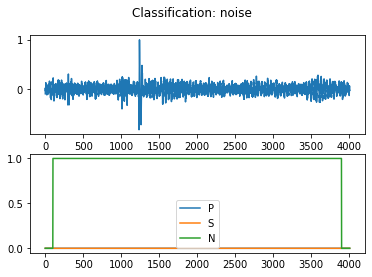

idx: 236
Origin time: 2018-10-25T15:07:15.905209Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

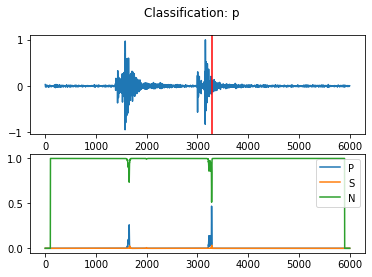

idx: 237
Origin time: 2018-10-25T17:08:35.272500Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

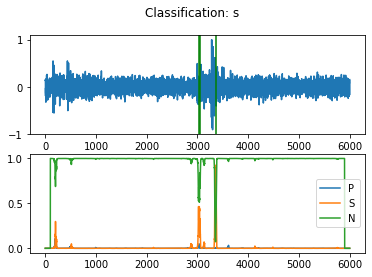

idx: 238
Origin time: 2018-10-26T11:33:25.399501Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

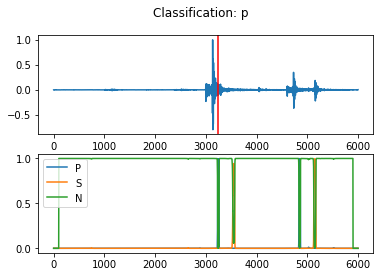

idx: 239
Origin time: 2018-10-27T10:38:21.312500Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

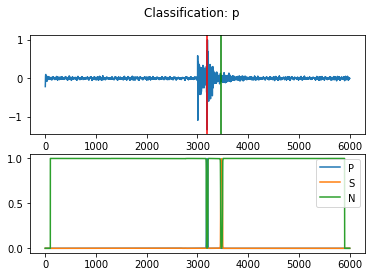

idx: 240
Origin time: 2018-10-27T10:59:00.204500Z
Station: 2.0
26/26 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

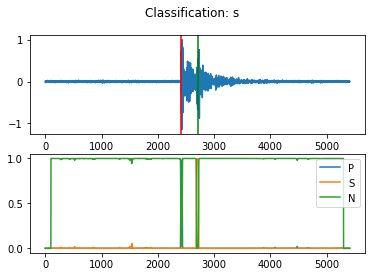

idx: 241
Origin time: 2018-10-27T14:33:33.700499Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

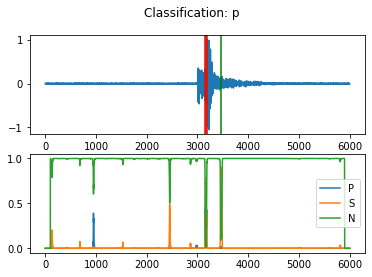

idx: 242
Origin time: 2018-11-02T17:46:01.984999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

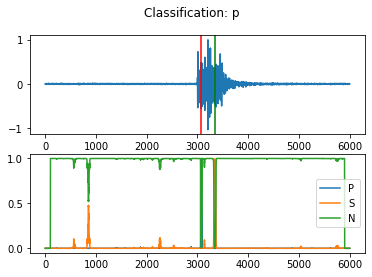

idx: 243
Origin time: 2018-12-11T09:21:27.617003Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

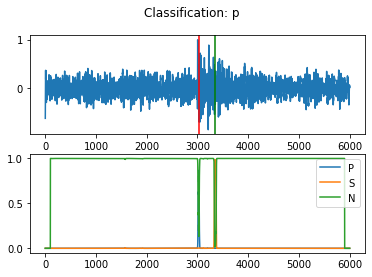

idx: 244
Origin time: 2018-12-11T09:32:04.481499Z
Station: 22.0
28/28 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

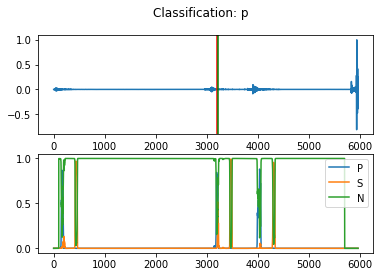

idx: 245
Origin time: 2018-12-11T10:29:19.027503Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

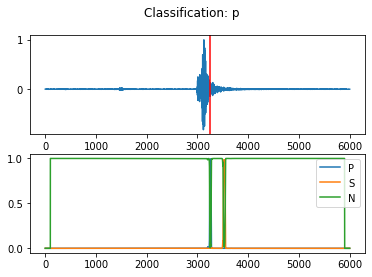

idx: 246
Origin time: 2018-12-13T11:19:20.037003Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

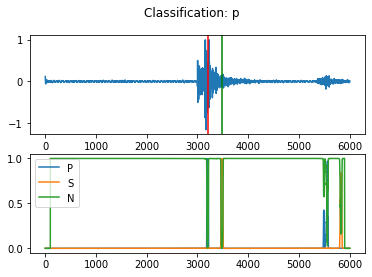

idx: 247
Origin time: 2018-12-14T20:12:31.700999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

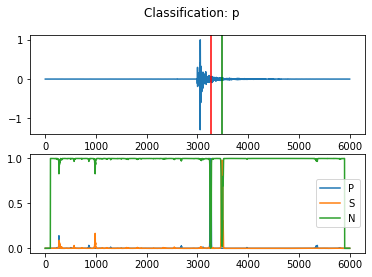

idx: 248
Origin time: 2018-12-17T11:31:06.711688Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

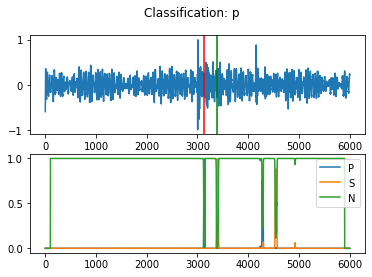

idx: 249
Origin time: 2018-12-17T12:07:50.236187Z
Station: 20.0
16/16 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

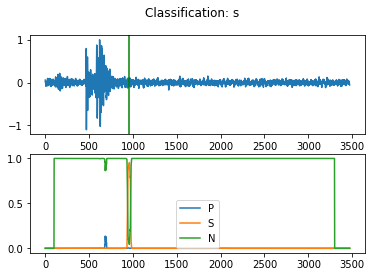

All done with P.


<Figure size 432x288 with 0 Axes>

In [17]:
# for P_df

results_P = pd.DataFrame(index= np.arange(0,len(P_df)),columns=['time', 'sta', 'pha', 'prob'])

for indx in np.arange(0, len(P_df)):
    # Dataframe to store picks from trigger
    df = pd.DataFrame(columns=['time', 'sta', 'pha', 'prob'])
    
    # read the data
    stcut_ENZ = read('./mseed_inputs/P_'+str(indx)+'.mseed',format='mseed')

    ##################################################

    # Expand overlapping windows using sliding_window function
    sliding_E = sliding_window(stcut_ENZ[0].data, 400, stepsize=shift_size) # Slide window across first component
    tr_win = np.zeros((sliding_E.shape[0], 400, 3)) # 3D array (of zeros)
    tr_win[:,:,0] = sliding_E # Add to 3D array
    sliding_E = None # clear some memory

    sliding_N = sliding_window(stcut_ENZ[1].data, 400, stepsize=shift_size) # Slide window across second component
    tr_win[:,:,1] = sliding_N # Add to 3D array
    sliding_N = None # clear some memory

    sliding_Z = sliding_window(stcut_ENZ[2].data, 400, stepsize=shift_size) # Slide window across third component
    tr_win[:,:,2] = sliding_Z # Add to 3D array
    sliding_Z = None # clear some memory

    tr_win = signal.detrend(tr_win, axis=1) # Detrend 
    tr_win = tr_win / np.max(np.abs(tr_win), axis=(1,2))[:,None,None] # Normalize between 0 and 1 (divide by max across 3 components for each window)
        
    # Model prediction step...
    ts = model.predict(tr_win, verbose=True, batch_size=batch_size)
    
    # Merge overlapping predictions:
    n_steps_per_win = 400/shift_size # No. of steps per window (i.e. how many overlapping windows)
    class_trace = np.zeros((len(stcut_ENZ[0].data), int(3))) # Create prediction traces to be same size as input data
    for i in np.arange(0, ts.shape[0]): # For each window
        class_trace[((i * shift_size) + 100):((i * shift_size) + 300), :] += ts[i, 100:300, :] # Keep middle 200 predictions

    # Interpolate predictions so same sample rate as signal:
#     ts_times = np.arange(0, a.shape[1])
    # class_trace = np.zeros((a.shape[1], int(3))) # Create prediction traces to be same size as input data
    # for i in np.arange(0, 3): # For each class
    #     class_trace[:, i] = np.interp(ts_times, np.arange(199, a.shape[1]-200, n_shift), ts[:,i]) # Interpolate prediction values (ts)
    
    # Extract probability trace for each (write to a file for future analysis?)
    prob_P = ts[:,0]
    prob_S = ts[:,1]
    prob_N = ts[:,2]

   # Use obspy trigger to find predictions above threshold (i.e. p_thresh and s_thresh)
    # P-wave picks (trigger):
    trigs = trigger_onset(class_trace[:,0], 0.3, trig_off) # Look for triggers (prediction trace exceeding p_thresh)
    p_picks = []
    p_probs = []
    
    for trig in trigs:
        if trig[1] == trig[0]:
            continue # If trigger on and off times are the same then ignore
        pick = np.argmax(class_trace[trig[0]:trig[1], 0]) + trig[0] # Use argmax between trigger on and off times as pick time
        stamp_pick = stcut_ENZ[0].stats.starttime + (pick * stcut_ENZ[0].stats.delta) # Pick time as UTCDateTime
        p_picks.append(stamp_pick) # Append time to list of P pick times
        p_probs.append(class_trace[pick, 0]) # Append prob to list of P pick probabilities
    
    
    # Add picks to df for this day            
    if len(p_picks) > 0:
        df_add = pd.DataFrame(p_picks, columns=['time'])
        df_add['pha'] = 'p'
        if (int(P_df['sta_str'].iloc[indx])+1) > 9:
            df_add['sta'] = "0" + str(int(P_df['sta_str'].iloc[indx]))
        else:
            df_add['sta'] = "00" + str(int(P_df['sta_str'].iloc[indx]))
        df_add['prob'] = p_probs
        df = pd.concat([df, df_add])
        
    # Repeat above for S-wave picks and s_thresh:
    trigs = trigger_onset(class_trace[:,1], s_thresh, trig_off)
    s_picks = []
    s_probs = []
    for trig in trigs:
        if trig[1] == trig[0]:
            continue
        pick = np.argmax(class_trace[trig[0]:trig[1], 1]) + trig[0]
        stamp_pick = stcut_ENZ[0].stats.starttime + (pick * stcut_ENZ[0].stats.delta)
        s_picks.append(stamp_pick)
        s_probs.append(class_trace[pick, 1])
        
    # Add picks to df for this day
    if len(s_picks) > 0:
        df_add = pd.DataFrame(s_picks, columns=['time'])
        df_add['pha'] = 's'
        if (int(P_df['sta_str'].iloc[indx])+1) > 9:
            df_add['sta'] = "0" + str(int(P_df['sta_str'].iloc[indx]))
        else:
            df_add['sta'] = "00" + str(int(P_df['sta_str'].iloc[indx]))
        df_add['prob'] = s_probs
        df = pd.concat([df, df_add])

    df = df.sort_values(by='prob',ascending=False).reset_index(drop=True)
    
    # get the picks that are +- 0.5 second (200 samples) of the phase time
    df_final = df[df['time'] >= P_df['starttime'].iloc[indx] -0.25]
    df_final = df_final[df_final['time'] <= P_df['starttime'].iloc[indx] +0.25]

#     then get the highest probability for that time window
    df_final = df_final.sort_values(by='prob',ascending=False).reset_index(drop=True)
    
    fig, axs = plt.subplots(2)
    
# if p exists in the window, then it is p    
#     if len(df_final) > 0:
#         p_param = 0
#         for dfi in np.arange(0,len(df_final)):
#             if df['pha'].iloc[dfi] == 'p':
#                 p_param = 1
#             else:
#                 pass
#         if p_param == 1:
#             fig.suptitle('Classification: p')
#         else:
#             fig.suptitle('Classification: s')
#     else:
#         fig.suptitle('Classification: noise')

    # get the one nearest to the middle of the window
    if len(df_final) > 0:
        timediff = []
        for dfii in np.arange(0,len(df_final)):
            timediff1 = abs((stcut_ENZ[0].stats.starttime + 1.5) - df_final['time'].iloc[dfii])
            timediff.append(timediff1)
            
        fig.suptitle('Classification: '+ df_final['pha'].iloc[np.argmin(timediff)])
    else:
        fig.suptitle('Classification: noise')
        
        
    axs[0].plot(stcut_ENZ[(int(P_df['sta_str'].iloc[indx]) - 1)*3 + 2].data/max(stcut_ENZ[(int(P_df['sta_str'].iloc[indx]) - 1)*3 + 2].data))
    if len(df_final) > 0:
        df_final.to_csv('./Model_results/UGPD/P/df_final_'+str(indx)+'.csv')
        for thepicks in np.arange(0,len(df_final)):
            if df_final['pha'].iloc[thepicks] == 'p':
                axs[0].axvline(x=(abs(df_final['time'].iloc[thepicks] - stcut_ENZ[0].stats.starttime) / 0.0005),color='r')
            else:
                axs[0].axvline(x=(abs(df_final['time'].iloc[thepicks] - stcut_ENZ[0].stats.starttime) / 0.0005),color='g')
             
    else:
        pass
    axs[1].plot(class_trace[:,0],'-')
    axs[1].plot(class_trace[:,1],'-')
    axs[1].plot(class_trace[:,2],'-')
    axs[1].legend(['P','S','N'])
    
    plt.show()
    
    if indx < 10:
        fig.savefig('./Model_results/UGPD/P/P_result_00'+str(indx)+'.png')
    elif (indx > 9) and (indx < 100):
        fig.savefig('./Model_results/UGPD/P/P_result_0'+str(indx)+'.png')
    else:
        fig.savefig('./Model_results/UGPD/P/P_result_'+str(indx)+'.png')
        
    plt.close()
    plt.clf()
    #############
    
    # run through all P picks
    if len(df_final)>0:
        results_P['time'].iloc[indx] = df_final['time'].iloc[0]
        results_P['sta'].iloc[indx] = df_final['sta'].iloc[0]
        results_P['pha'].iloc[indx] = df_final['pha'].iloc[np.argmin(timediff)]
        results_P['prob'].iloc[indx] = df_final['prob'].iloc[np.argmin(timediff)]
    else:
        results_P['time'].iloc[indx] = np.nan
        results_P['sta'].iloc[indx] = P_df['sta_str'].iloc[indx]
        results_P['pha'].iloc[indx] = 'n'
        results_P['prob'].iloc[indx] = np.nan
        
results_P.to_csv('./Model_results/UGPD/P/250results_P.csv')
print("All done with P.")

idx: 0
Origin time: 2018-10-16T10:54:18.518596Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


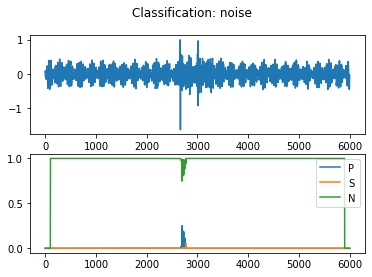

idx: 1
Origin time: 2018-10-17T10:44:06.752483Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

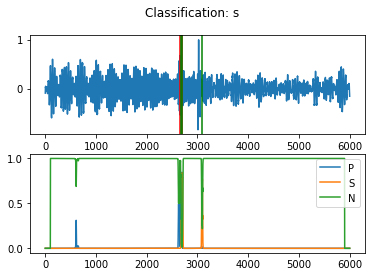

idx: 2
Origin time: 2018-10-17T10:44:19.429796Z
Station: 19.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

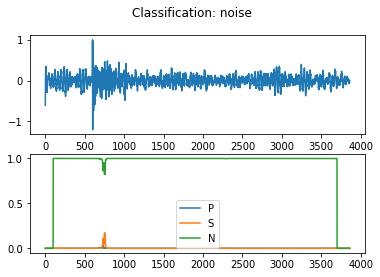

idx: 3
Origin time: 2018-10-17T10:46:22.316227Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

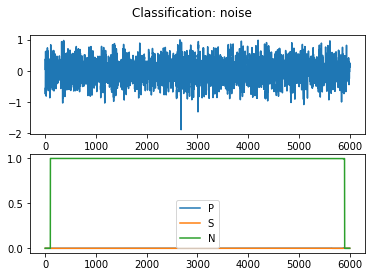

idx: 4
Origin time: 2018-10-17T10:47:01.228957Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

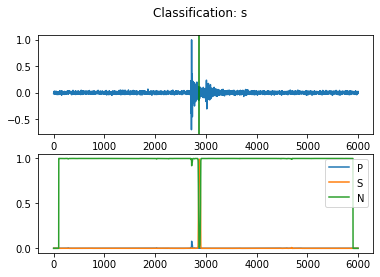

idx: 5
Origin time: 2018-10-17T10:48:49.866153Z
Station: 2.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

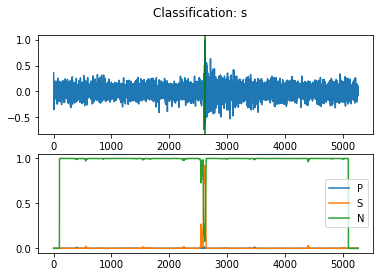

idx: 6
Origin time: 2018-10-17T10:54:21.988852Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

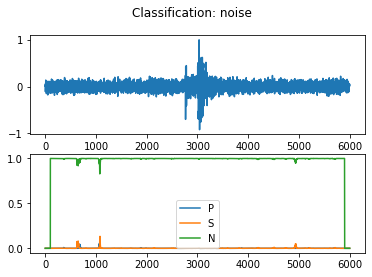

idx: 7
Origin time: 2018-10-23T14:22:12.907697Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

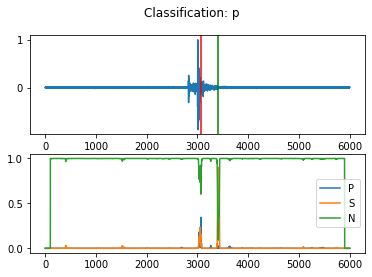

idx: 8
Origin time: 2018-10-23T14:27:16.272296Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

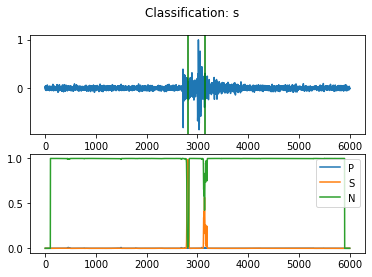

idx: 9
Origin time: 2018-10-23T14:30:57.455669Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

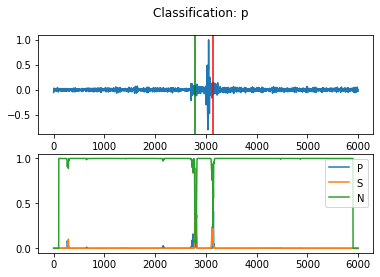

idx: 10
Origin time: 2018-10-23T14:35:44.106102Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

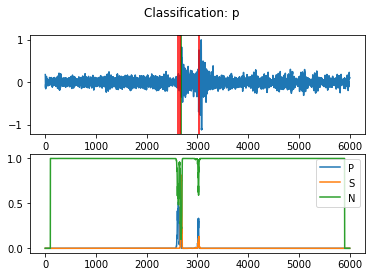

idx: 11
Origin time: 2018-10-23T14:36:15.925023Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

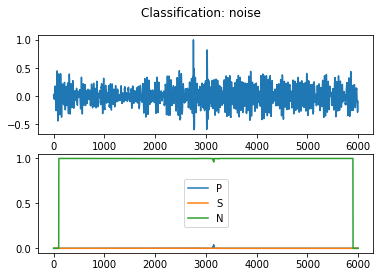

idx: 12
Origin time: 2018-10-23T14:36:50.830293Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

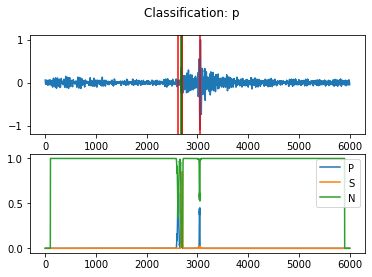

idx: 13
Origin time: 2018-10-23T14:37:29.421876Z
Station: 10.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

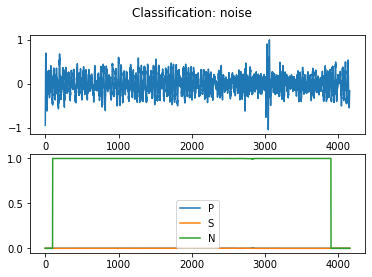

idx: 14
Origin time: 2018-10-23T14:38:07.166302Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

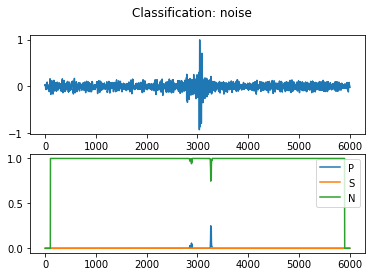

idx: 15
Origin time: 2018-10-23T14:39:14.222327Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

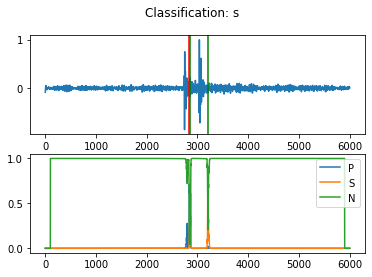

idx: 16
Origin time: 2018-10-23T14:39:20.808372Z
Station: 9.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

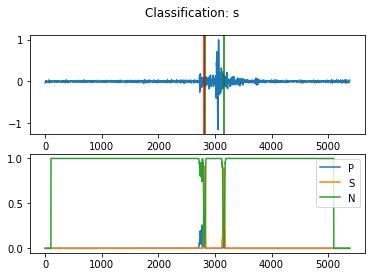

idx: 17
Origin time: 2018-10-23T14:40:34.543000Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

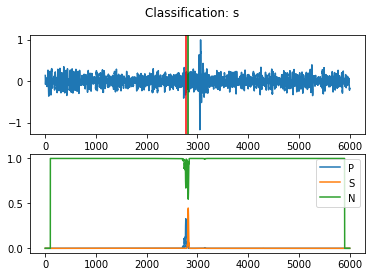

idx: 18
Origin time: 2018-10-23T14:41:41.282625Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

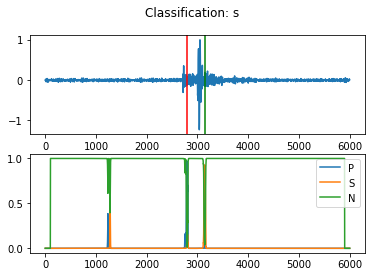

idx: 19
Origin time: 2018-10-23T14:41:50.514001Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

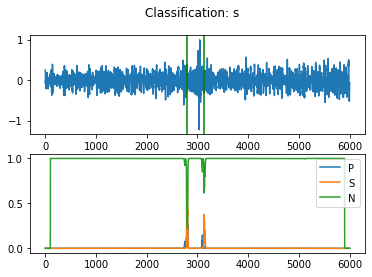

idx: 20
Origin time: 2018-10-23T14:41:53.520754Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

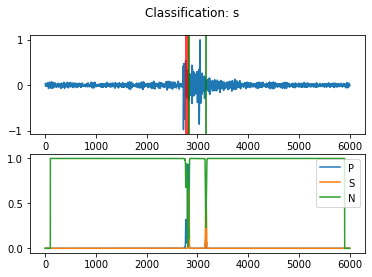

idx: 21
Origin time: 2018-10-23T14:44:25.484501Z
Station: 7.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

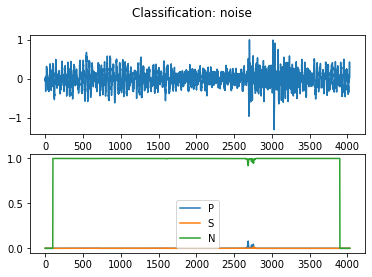

idx: 22
Origin time: 2018-10-23T14:44:29.559719Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

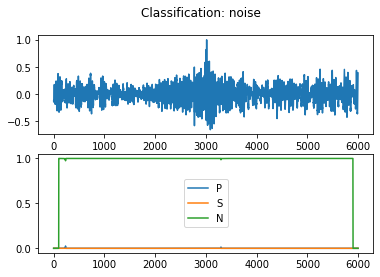

idx: 23
Origin time: 2018-10-23T14:44:35.826000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

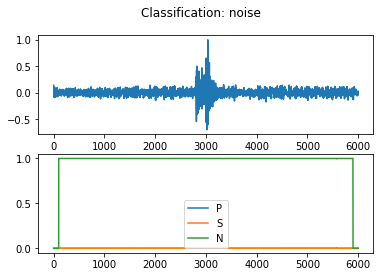

idx: 24
Origin time: 2018-10-23T14:44:37.700141Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

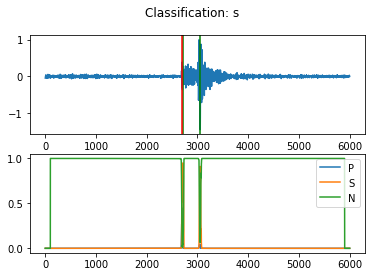

idx: 25
Origin time: 2018-10-23T14:44:44.686276Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

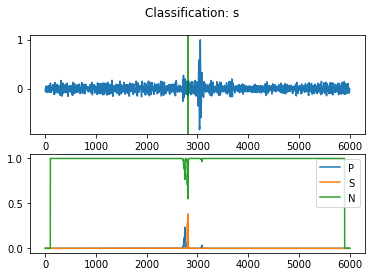

idx: 26
Origin time: 2018-10-23T14:35:00.067670Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

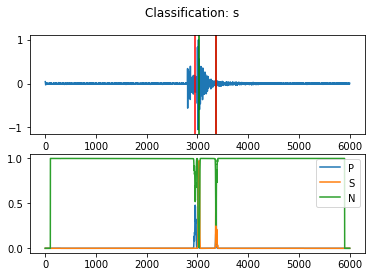

idx: 27
Origin time: 2018-10-23T14:45:32.951670Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

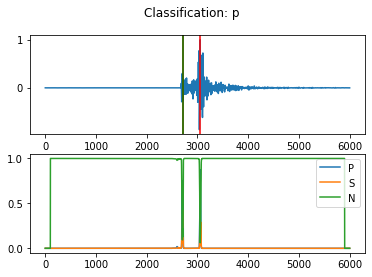

idx: 28
Origin time: 2018-10-23T14:45:40.391110Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

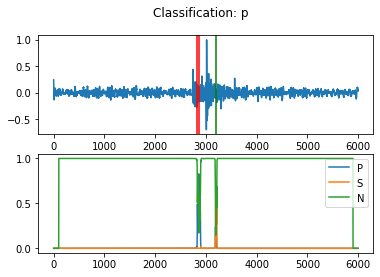

idx: 29
Origin time: 2018-10-23T14:45:44.283500Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

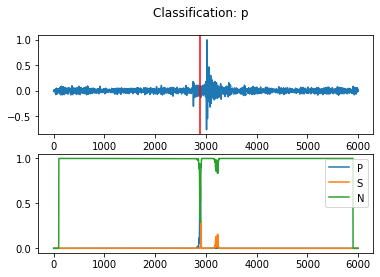

idx: 30
Origin time: 2018-10-23T14:42:01.654500Z
Station: 13.0
17/17 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

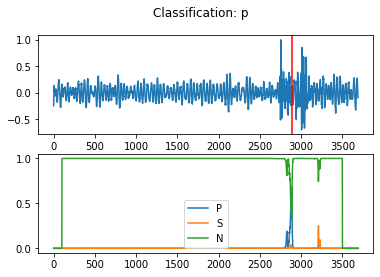

idx: 31
Origin time: 2018-10-23T14:48:46.445333Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

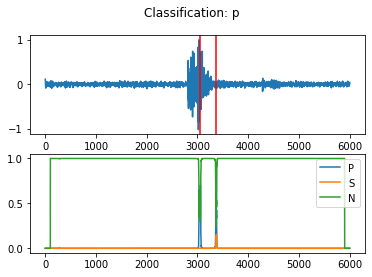

idx: 32
Origin time: 2018-10-23T14:49:00.705501Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

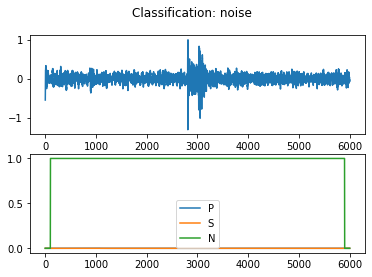

idx: 33
Origin time: 2018-10-23T14:49:49.056822Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

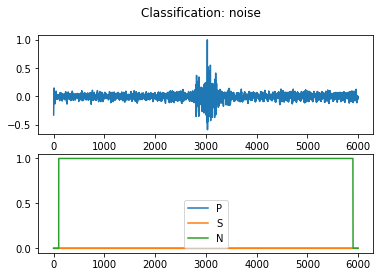

idx: 34
Origin time: 2018-10-23T14:51:51.896492Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

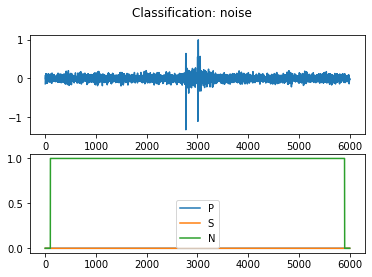

idx: 35
Origin time: 2018-10-23T14:52:02.612999Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

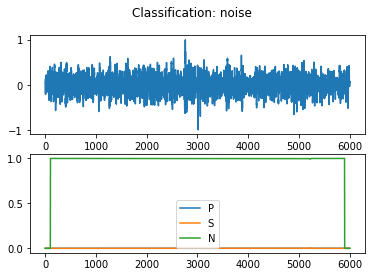

idx: 36
Origin time: 2018-10-23T14:52:36.389500Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

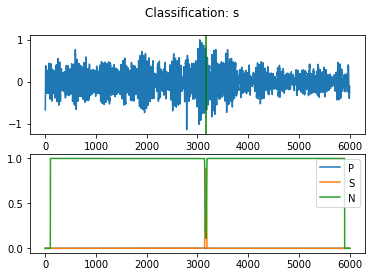

idx: 37
Origin time: 2018-10-23T14:53:38.781001Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

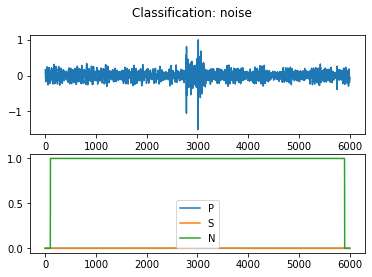

idx: 38
Origin time: 2018-10-23T14:53:42.381478Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

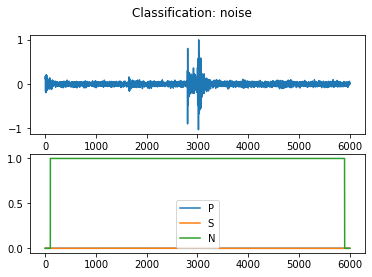

idx: 39
Origin time: 2018-10-23T14:54:25.266013Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

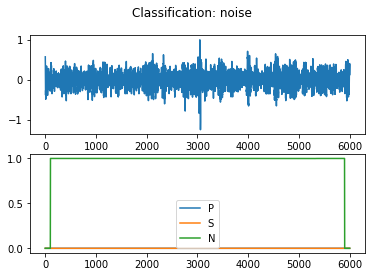

idx: 40
Origin time: 2018-10-23T14:55:58.092472Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

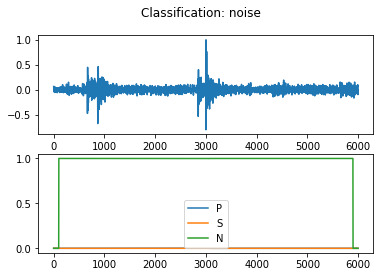

idx: 41
Origin time: 2018-10-23T14:56:27.729500Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

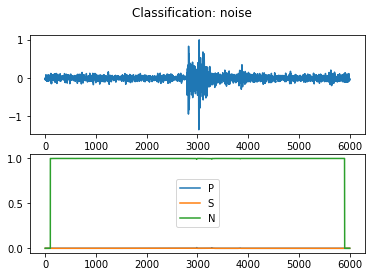

idx: 42
Origin time: 2018-10-23T14:57:04.438996Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

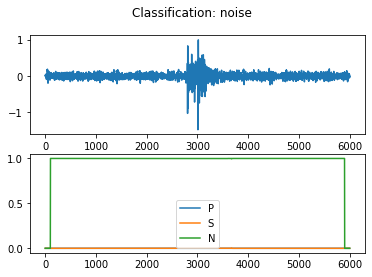

idx: 43
Origin time: 2018-10-23T14:57:33.931999Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

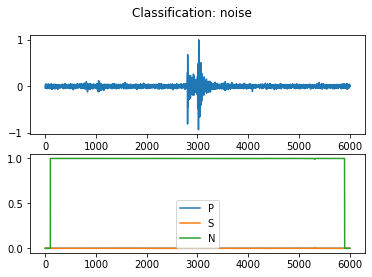

idx: 44
Origin time: 2018-10-23T14:57:41.151501Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

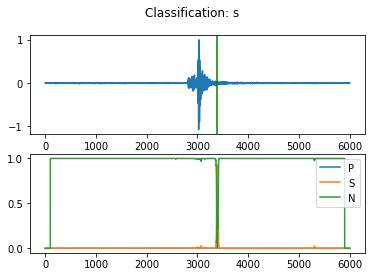

idx: 45
Origin time: 2018-10-23T14:57:49.629999Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

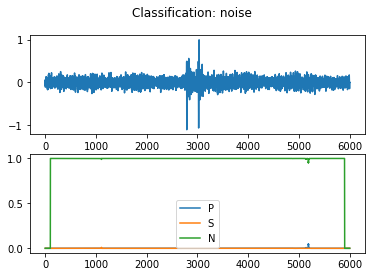

idx: 46
Origin time: 2018-10-23T14:58:02.238001Z
Station: 22.0
16/16 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

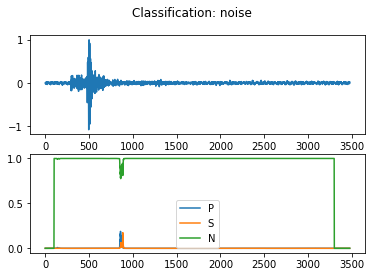

idx: 47
Origin time: 2018-10-23T14:58:06.002501Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

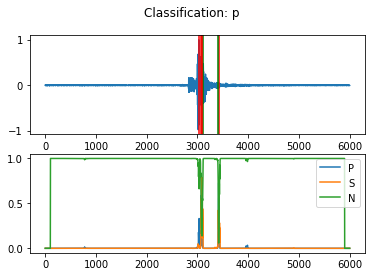

idx: 48
Origin time: 2018-10-23T14:58:39.379893Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

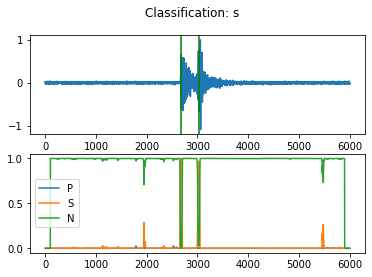

idx: 49
Origin time: 2018-10-23T14:58:48.855501Z
Station: 18.0
25/25 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

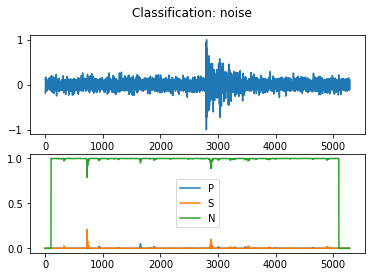

idx: 50
Origin time: 2018-10-23T14:59:02.937000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

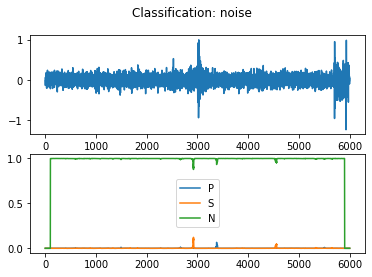

idx: 51
Origin time: 2018-10-23T14:59:16.910999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

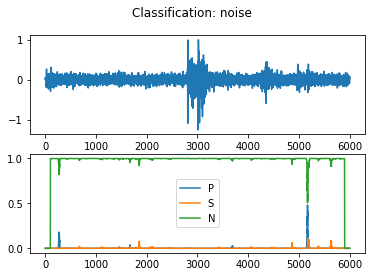

idx: 52
Origin time: 2018-10-23T14:59:19.390999Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

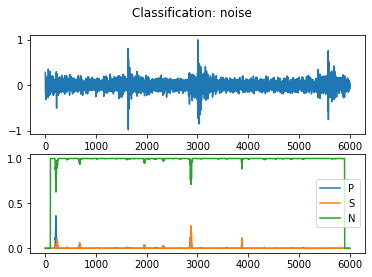

idx: 53
Origin time: 2018-10-23T14:59:24.903624Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

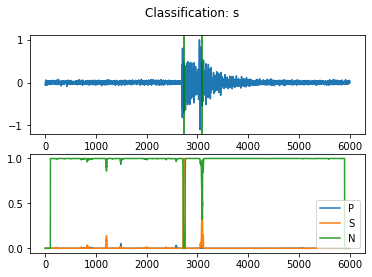

idx: 54
Origin time: 2018-10-23T14:59:29.121514Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

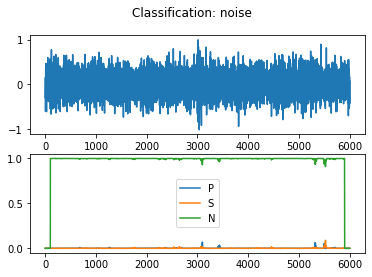

idx: 55
Origin time: 2018-10-23T14:59:37.871000Z
Station: 12.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

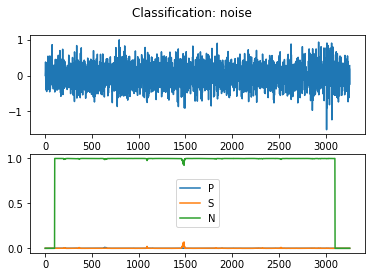

idx: 56
Origin time: 2018-10-23T14:59:38.550500Z
Station: 17.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

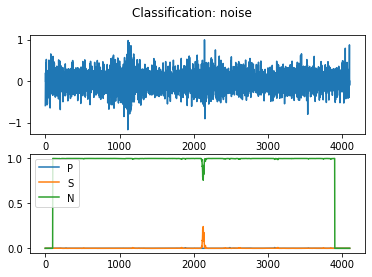

idx: 57
Origin time: 2018-10-29T09:07:44.758459Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

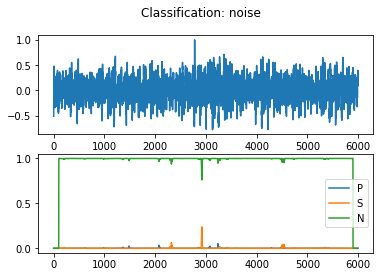

idx: 58
Origin time: 2018-10-29T09:11:10.322020Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

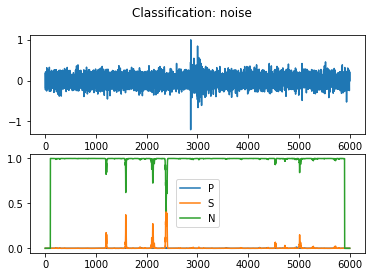

idx: 59
Origin time: 2018-10-29T09:11:28.636414Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

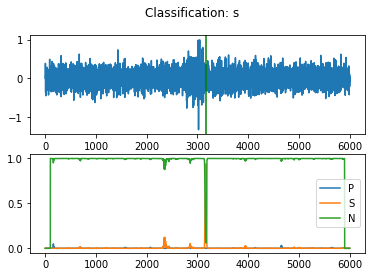

idx: 60
Origin time: 2018-10-29T09:13:16.450352Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

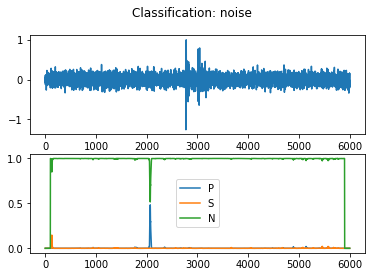

idx: 61
Origin time: 2018-10-29T09:13:27.507081Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

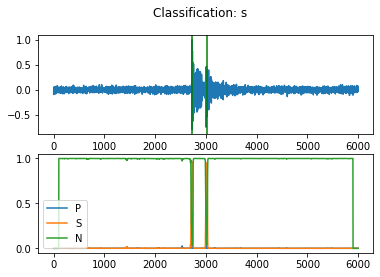

idx: 62
Origin time: 2018-10-29T09:17:59.691887Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

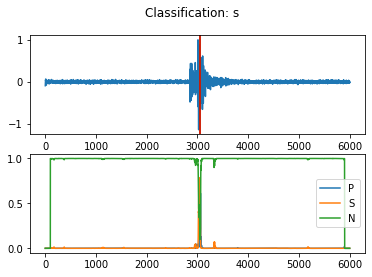

idx: 63
Origin time: 2018-10-29T09:24:15.884174Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

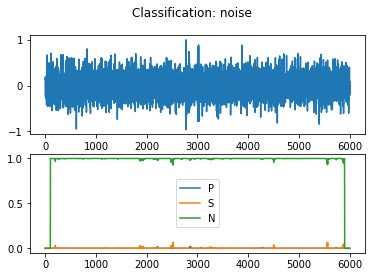

idx: 64
Origin time: 2018-10-29T09:26:06.021933Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

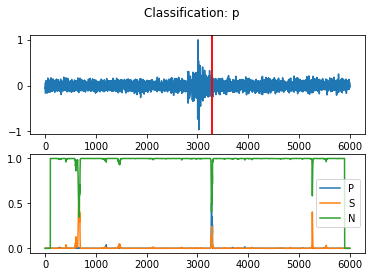

idx: 65
Origin time: 2018-10-29T09:29:51.471275Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

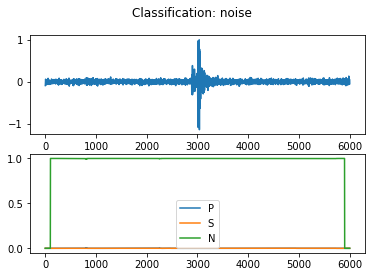

idx: 66
Origin time: 2018-10-29T09:30:20.615192Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

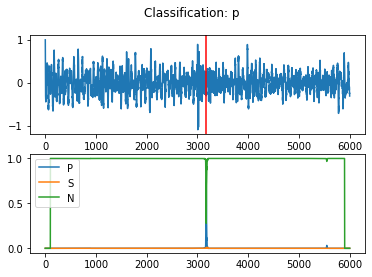

idx: 67
Origin time: 2018-10-29T09:31:18.519956Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

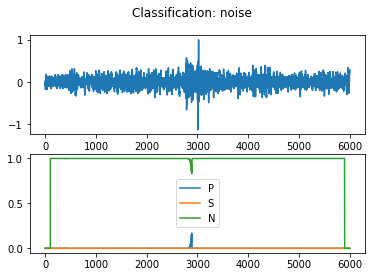

idx: 68
Origin time: 2018-10-29T09:31:41.001847Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

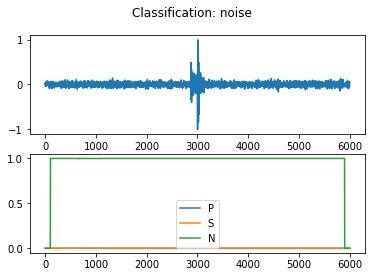

idx: 69
Origin time: 2018-10-29T09:31:48.173910Z
Station: 14.0
25/25 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

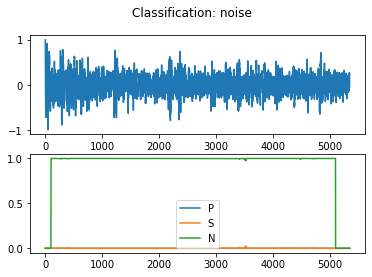

idx: 70
Origin time: 2018-10-29T09:31:50.552337Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

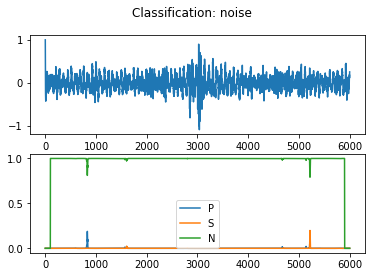

idx: 71
Origin time: 2018-10-29T09:31:59.022528Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

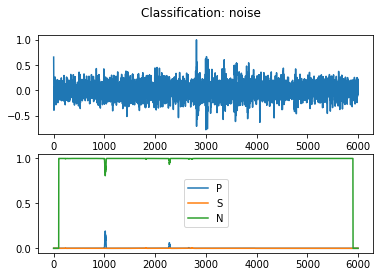

idx: 72
Origin time: 2018-10-29T09:32:40.102250Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

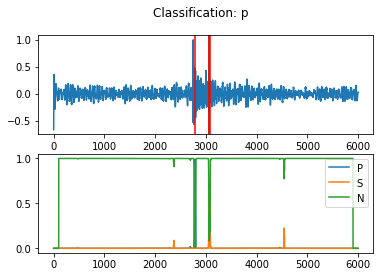

idx: 73
Origin time: 2018-10-29T09:50:49.633060Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

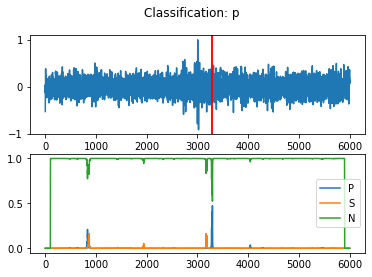

idx: 74
Origin time: 2018-10-29T09:53:28.946347Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

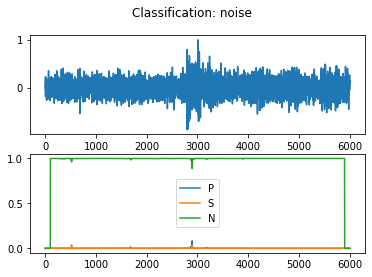

idx: 75
Origin time: 2018-10-29T09:57:34.908267Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

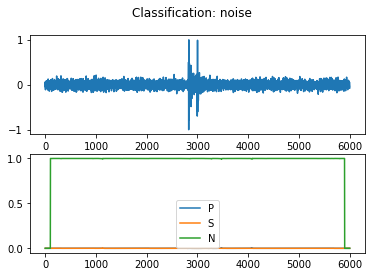

idx: 76
Origin time: 2018-10-29T09:58:53.324098Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

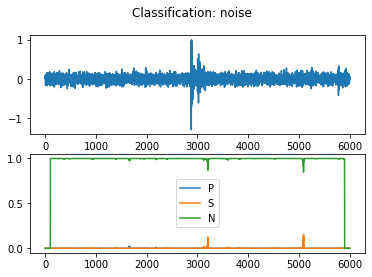

idx: 77
Origin time: 2018-10-29T09:59:25.996310Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

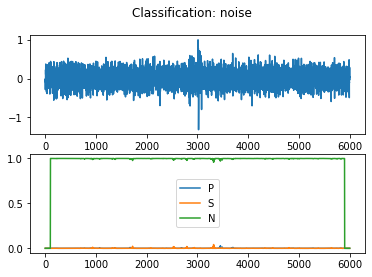

idx: 78
Origin time: 2018-10-29T09:59:31.480156Z
Station: 22.0
18/18 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

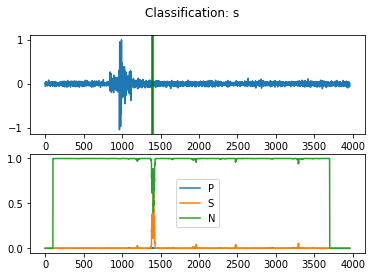

idx: 79
Origin time: 2018-12-11T09:19:19.420001Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

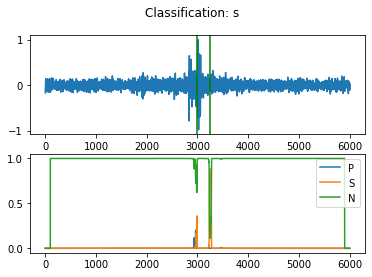

idx: 80
Origin time: 2018-12-11T09:22:29.312658Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

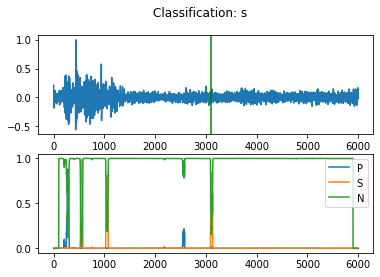

idx: 81
Origin time: 2018-12-11T09:25:21.968001Z
Station: 23.0
24/24 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

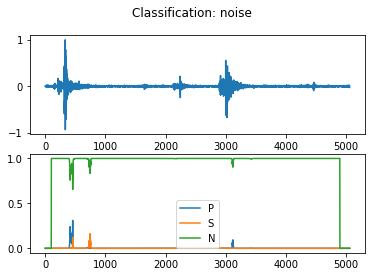

idx: 82
Origin time: 2018-12-11T09:25:56.155501Z
Station: 5.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

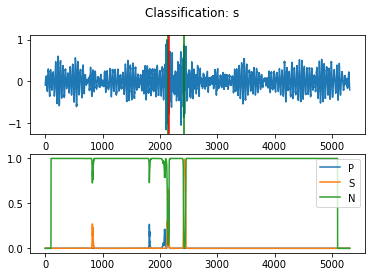

idx: 83
Origin time: 2018-12-11T09:27:07.841999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

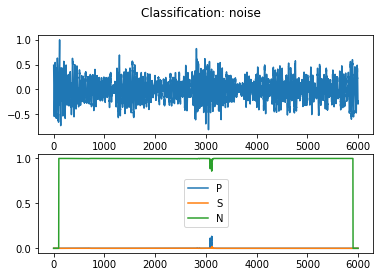

idx: 84
Origin time: 2018-12-11T09:27:26.529002Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

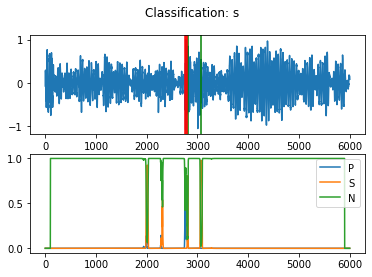

idx: 85
Origin time: 2018-12-11T09:28:28.816000Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

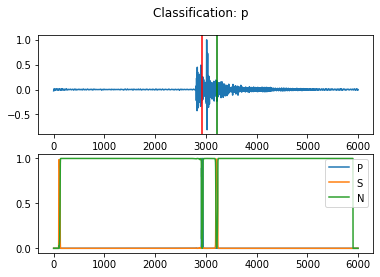

idx: 86
Origin time: 2018-12-11T09:33:03.032002Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

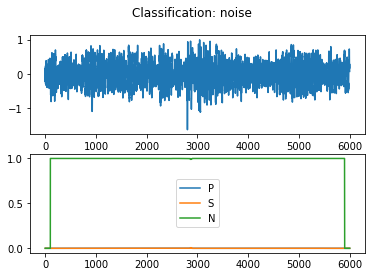

idx: 87
Origin time: 2018-12-11T09:33:41.244497Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

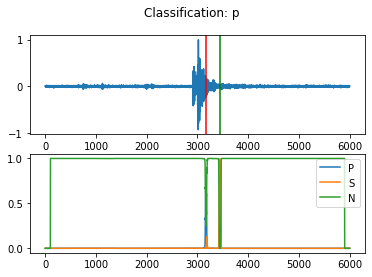

idx: 88
Origin time: 2018-12-11T09:37:46.002116Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

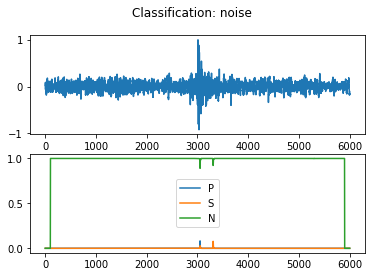

idx: 89
Origin time: 2018-12-11T09:41:22.950110Z
Station: 4.0
14/14 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

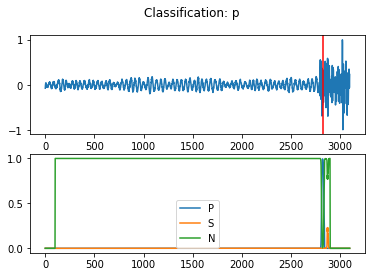

idx: 90
Origin time: 2018-12-11T09:42:20.860003Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

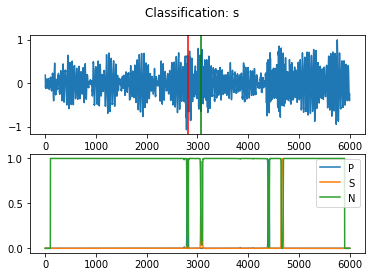

idx: 91
Origin time: 2018-12-11T09:43:38.601276Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

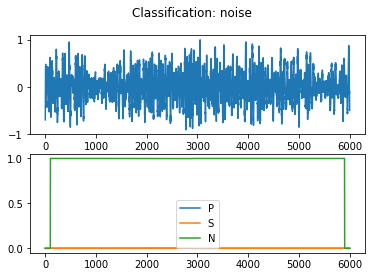

idx: 92
Origin time: 2018-12-11T09:50:33.926501Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

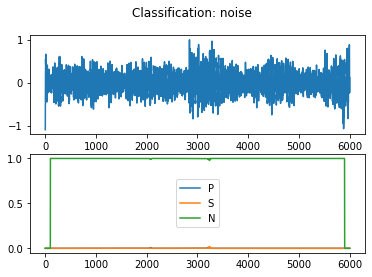

idx: 93
Origin time: 2018-12-11T09:50:50.215503Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

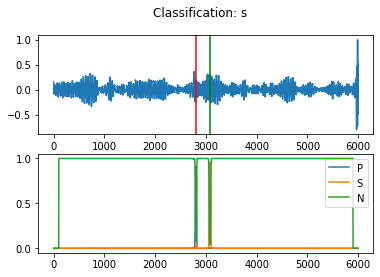

idx: 94
Origin time: 2018-12-11T09:52:46.716497Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

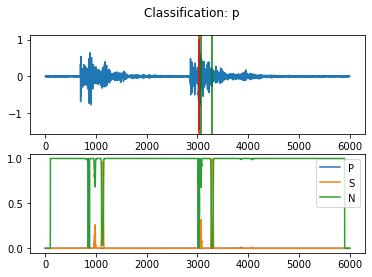

idx: 95
Origin time: 2018-12-11T09:54:57.840501Z
Station: 24.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

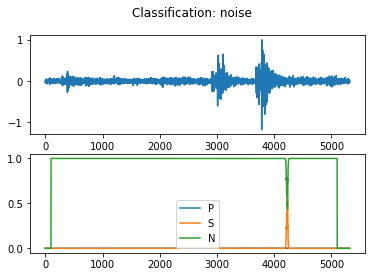

idx: 96
Origin time: 2018-12-11T09:55:23.160502Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

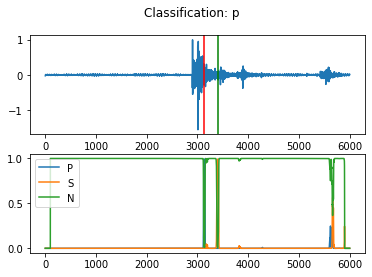

idx: 97
Origin time: 2018-12-11T09:55:58.304001Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

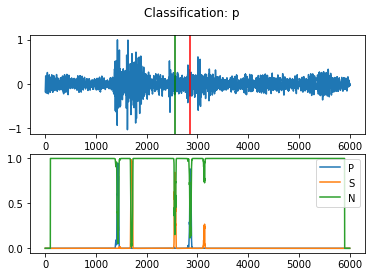

idx: 98
Origin time: 2018-12-11T09:57:28.542947Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

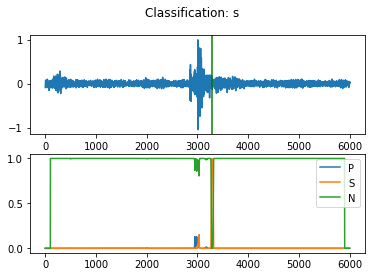

idx: 99
Origin time: 2018-12-11T09:59:12.846001Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

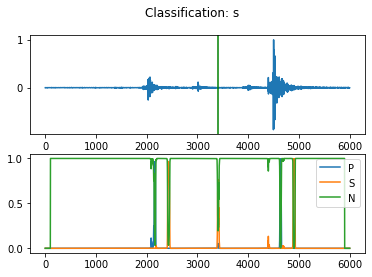

idx: 100
Origin time: 2018-12-11T11:21:15.919824Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

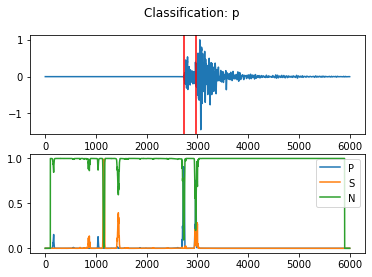

idx: 101
Origin time: 2018-10-29T11:30:39.519076Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

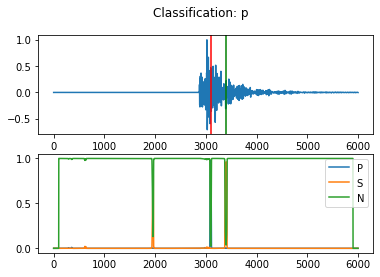

idx: 102
Origin time: 2018-10-29T18:01:12.720937Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

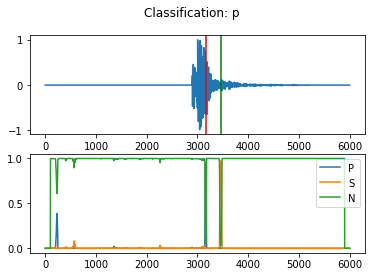

idx: 103
Origin time: 2018-10-26T11:36:59.167398Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

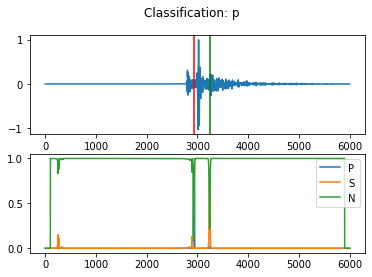

idx: 104
Origin time: 2018-10-27T10:55:25.958788Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

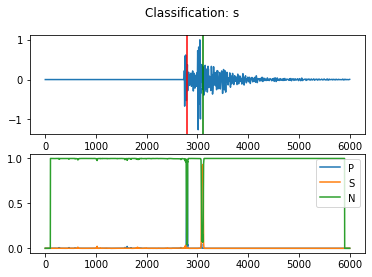

idx: 105
Origin time: 2018-11-04T16:24:06.676114Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

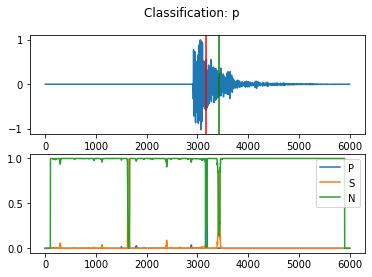

idx: 106
Origin time: 2018-10-24T13:02:29.781215Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

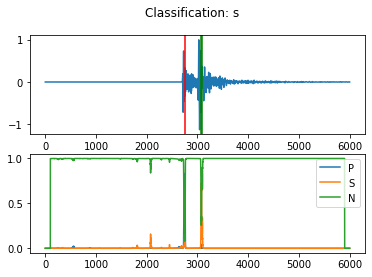

idx: 107
Origin time: 2018-10-25T14:59:27.765128Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

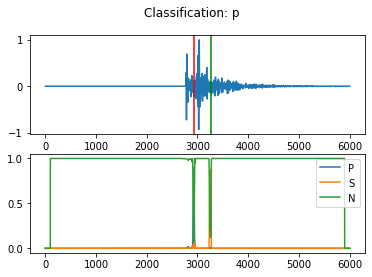

idx: 108
Origin time: 2018-10-23T14:45:32.816670Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

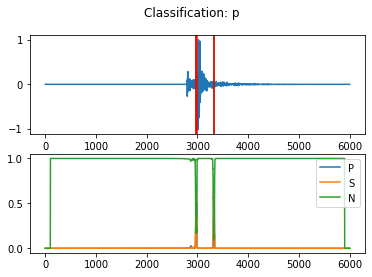

idx: 109
Origin time: 2018-12-14T13:41:06.187303Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

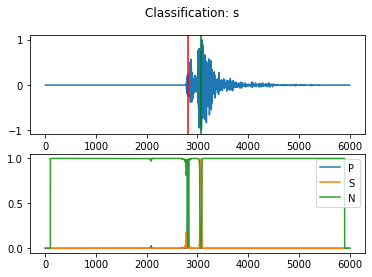

idx: 110
Origin time: 2018-10-25T17:00:34.513072Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

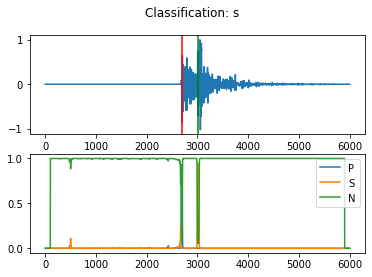

idx: 111
Origin time: 2018-10-26T11:26:45.228376Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

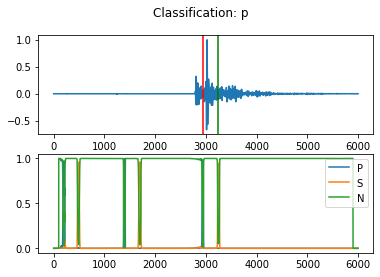

idx: 112
Origin time: 2018-12-11T09:53:31.628274Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

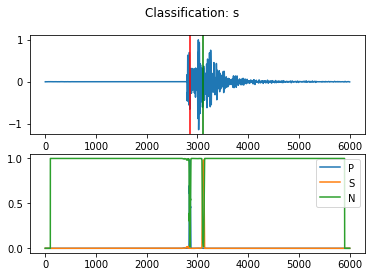

idx: 113
Origin time: 2018-10-29T11:58:35.094222Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

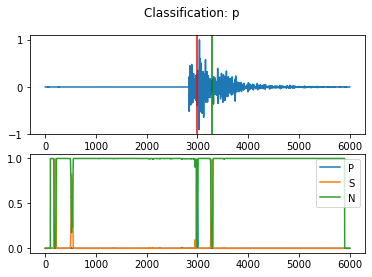

idx: 114
Origin time: 2018-12-11T10:06:45.115583Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

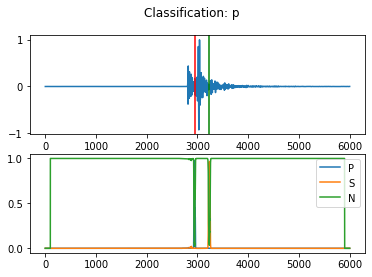

idx: 115
Origin time: 2018-12-14T13:09:52.013000Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

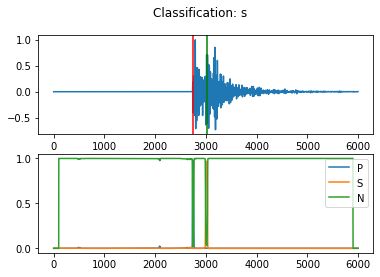

idx: 116
Origin time: 2018-12-11T09:35:01.688777Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

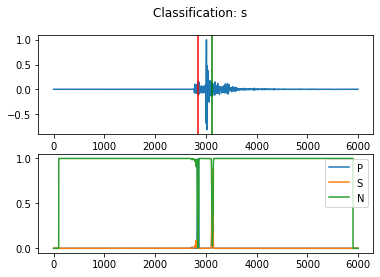

idx: 117
Origin time: 2018-10-26T20:39:23.377610Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

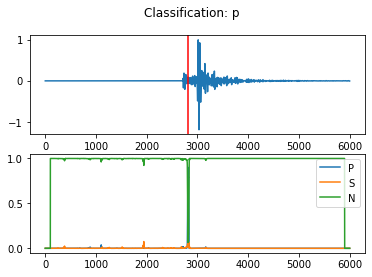

idx: 118
Origin time: 2018-10-24T13:26:26.958736Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

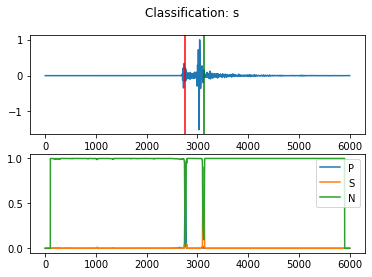

idx: 119
Origin time: 2018-12-14T14:51:57.150504Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

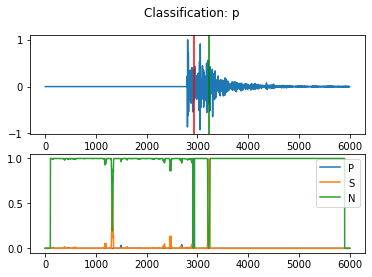

idx: 120
Origin time: 2018-12-13T13:25:17.297558Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

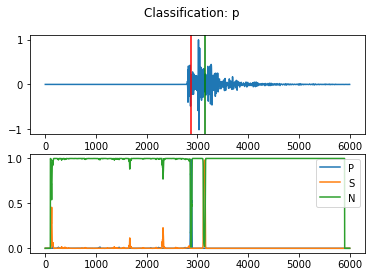

idx: 121
Origin time: 2018-12-08T12:28:22.536485Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

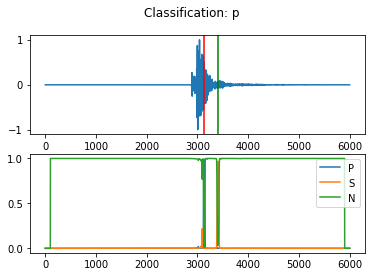

idx: 122
Origin time: 2018-10-25T15:06:05.109139Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

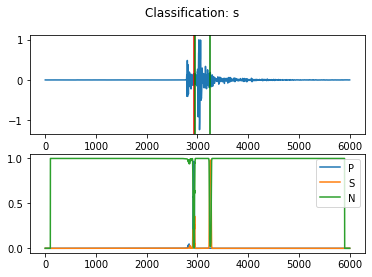

idx: 123
Origin time: 2018-10-24T23:56:13.486137Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

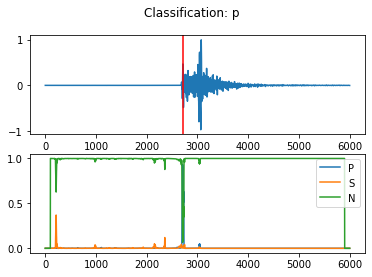

idx: 124
Origin time: 2018-10-25T12:40:57.062937Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

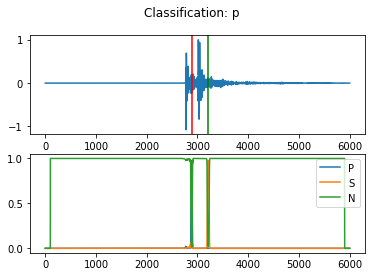

idx: 125
Origin time: 2018-10-18T15:48:53.993427Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

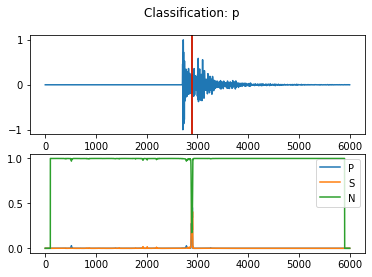

idx: 126
Origin time: 2018-12-11T10:34:35.785646Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

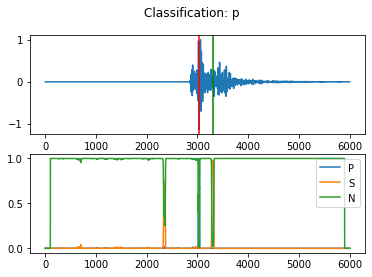

idx: 127
Origin time: 2018-10-29T21:13:59.152642Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

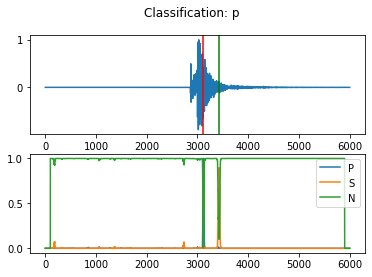

idx: 128
Origin time: 2018-10-30T01:37:38.030873Z
Station: 16.0
23/23 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

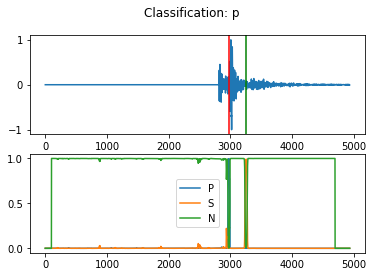

idx: 129
Origin time: 2018-10-27T11:44:31.666597Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

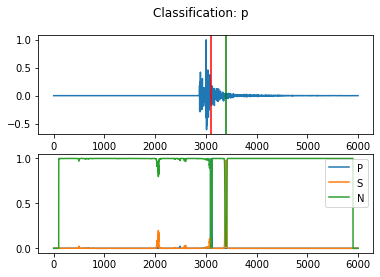

idx: 130
Origin time: 2018-12-11T10:18:47.136932Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

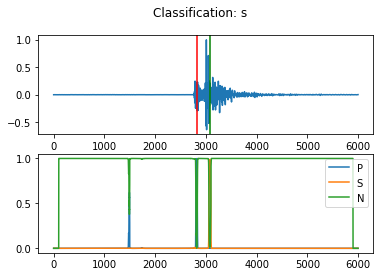

idx: 131
Origin time: 2018-10-20T03:44:01.804986Z
Station: 14.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

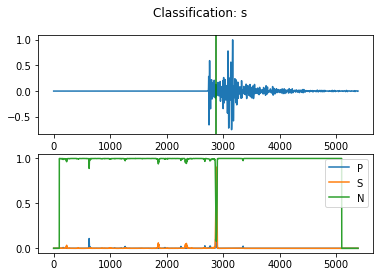

idx: 132
Origin time: 2018-10-29T11:44:42.401886Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

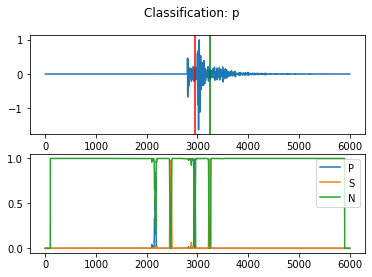

idx: 133
Origin time: 2018-10-19T13:20:49.141106Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

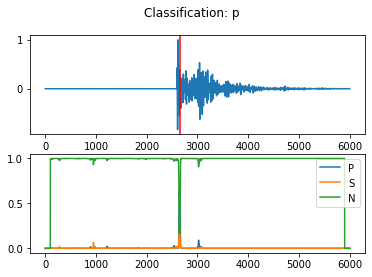

idx: 134
Origin time: 2018-10-25T14:56:28.733150Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

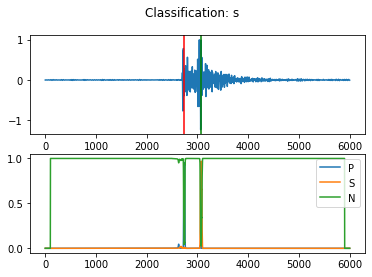

idx: 135
Origin time: 2018-10-26T02:13:02.205291Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

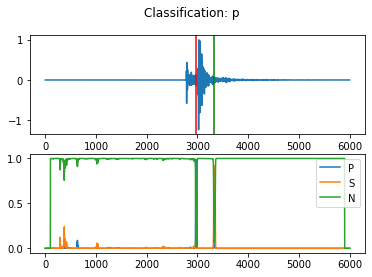

idx: 136
Origin time: 2018-12-10T10:30:58.344963Z
Station: 18.0
20/20 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

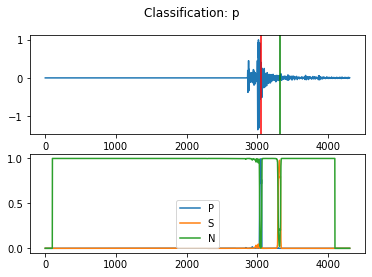

idx: 137
Origin time: 2018-12-11T10:20:28.023469Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

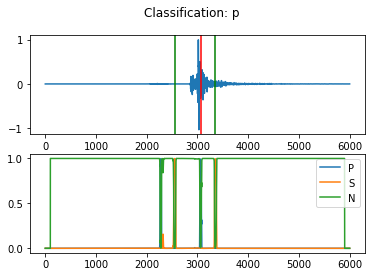

idx: 138
Origin time: 2018-10-27T11:07:17.201670Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

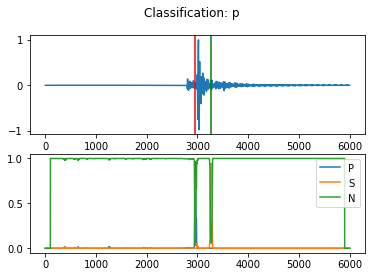

idx: 139
Origin time: 2018-12-14T13:06:37.398000Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

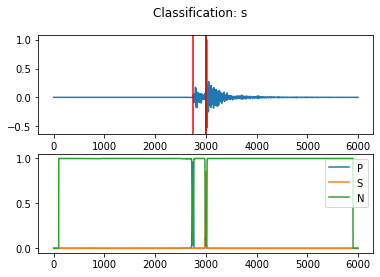

idx: 140
Origin time: 2018-10-26T14:14:04.309392Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

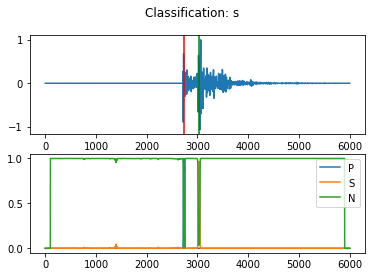

idx: 141
Origin time: 2018-10-26T11:17:03.358776Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

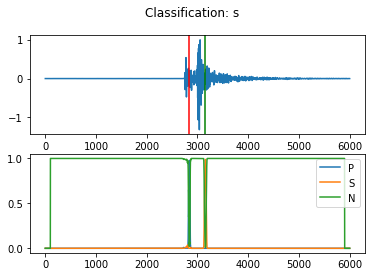

idx: 142
Origin time: 2018-12-14T13:18:30.776496Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

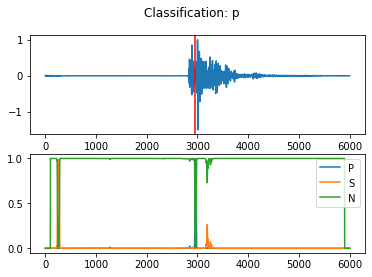

idx: 143
Origin time: 2018-12-11T09:34:03.780759Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

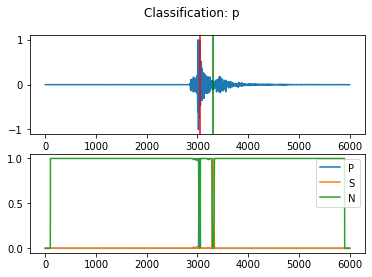

idx: 144
Origin time: 2018-10-25T17:04:13.867001Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

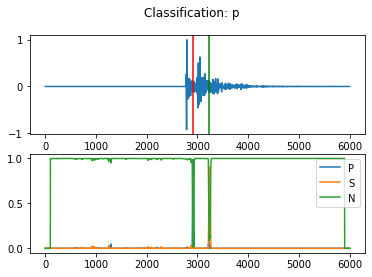

idx: 145
Origin time: 2018-10-24T13:19:01.059000Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

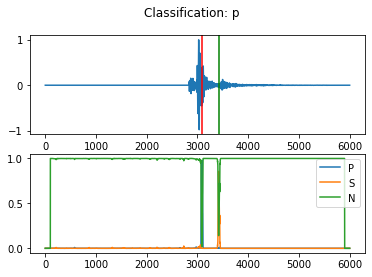

idx: 146
Origin time: 2018-10-29T11:43:29.894477Z
Station: 24.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

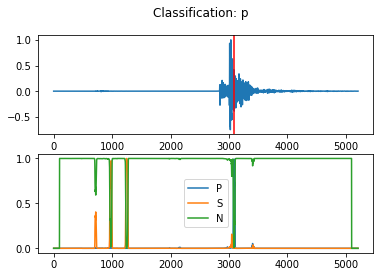

idx: 147
Origin time: 2018-10-25T15:24:29.162999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

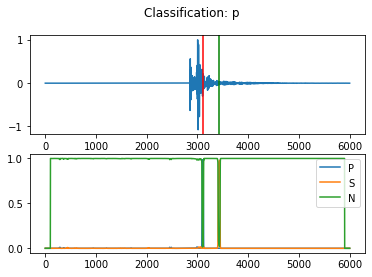

idx: 148
Origin time: 2018-10-24T12:57:14.321501Z
Station: 16.0
17/17 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

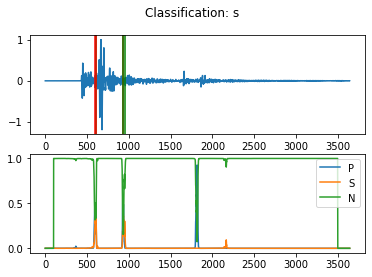

idx: 149
Origin time: 2018-10-25T15:22:59.470499Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

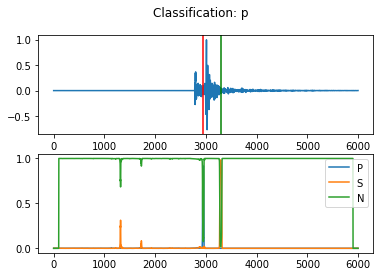

idx: 150
Origin time: 2018-12-15T09:40:07.540999Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

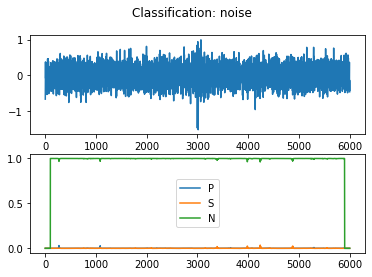

idx: 151
Origin time: 2018-12-14T19:22:45.418000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

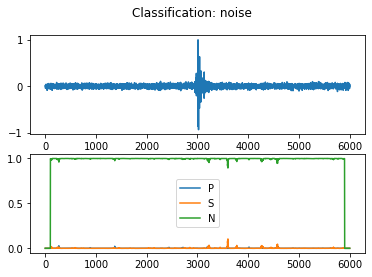

idx: 152
Origin time: 2018-12-15T05:14:05.670001Z
Station: 20.0
17/17 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

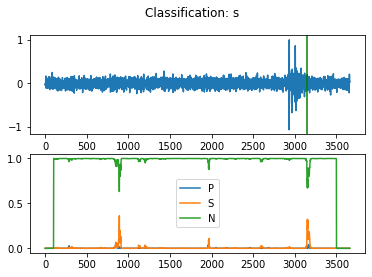

idx: 153
Origin time: 2018-12-14T20:17:15.722500Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

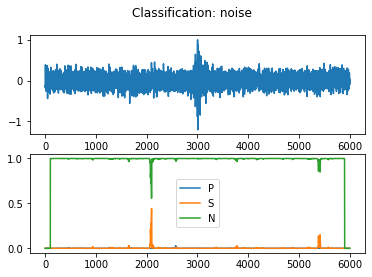

idx: 154
Origin time: 2018-12-18T02:37:07.055323Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

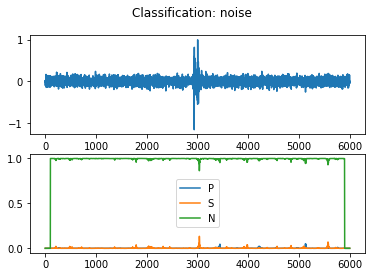

idx: 155
Origin time: 2018-12-18T08:08:33.549378Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

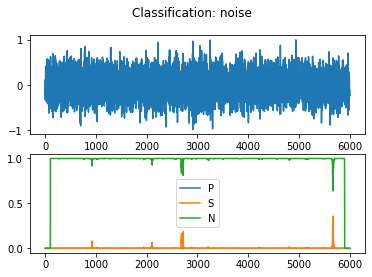

idx: 156
Origin time: 2018-12-14T19:05:19.866270Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

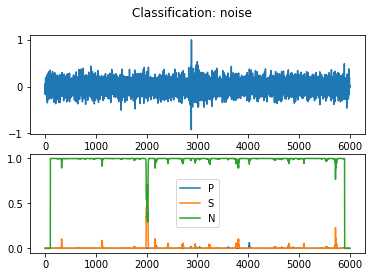

idx: 157
Origin time: 2018-12-17T17:53:15.555503Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

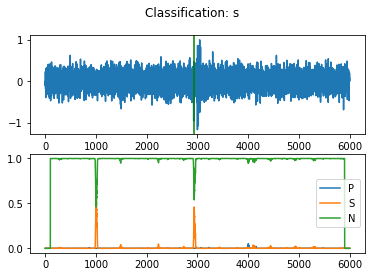

idx: 158
Origin time: 2018-12-18T08:09:11.718826Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

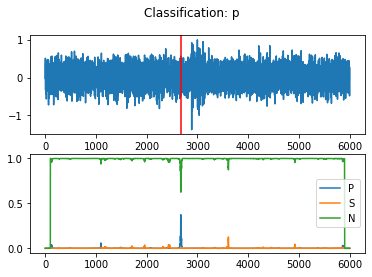

idx: 159
Origin time: 2018-12-18T00:16:31.301860Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

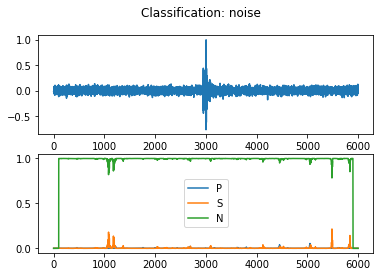

idx: 160
Origin time: 2018-12-15T04:24:17.922999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

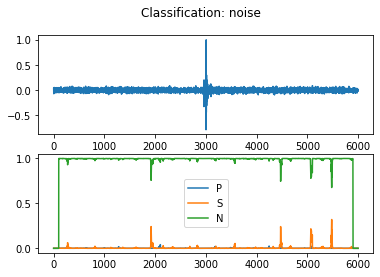

idx: 161
Origin time: 2018-12-17T18:23:08.079902Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

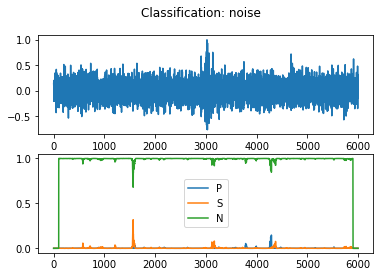

idx: 162
Origin time: 2018-12-17T17:35:41.090749Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

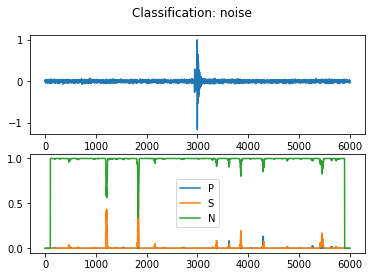

idx: 163
Origin time: 2018-12-14T15:45:00.607000Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

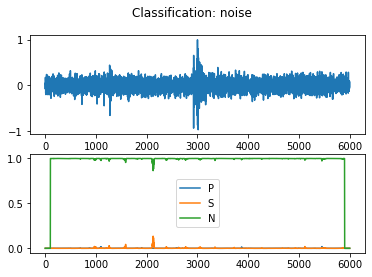

idx: 164
Origin time: 2018-12-17T19:39:35.757497Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

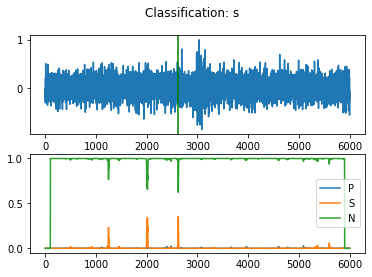

idx: 165
Origin time: 2018-12-18T00:20:43.195939Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

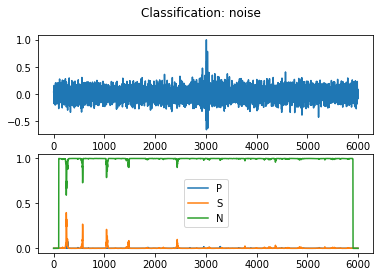

idx: 166
Origin time: 2018-12-18T00:39:03.223666Z
Station: 21.0
26/26 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

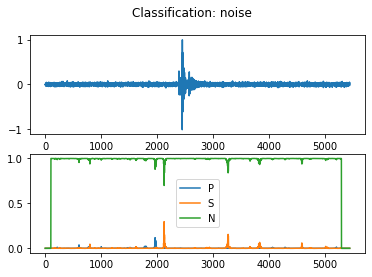

idx: 167
Origin time: 2018-12-15T03:05:17.620441Z
Station: 19.0
17/17 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

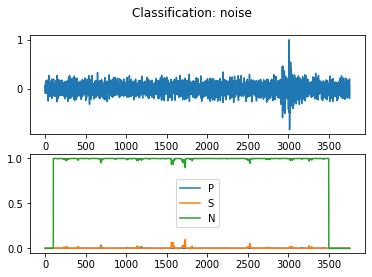

idx: 168
Origin time: 2018-12-18T03:38:55.770431Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

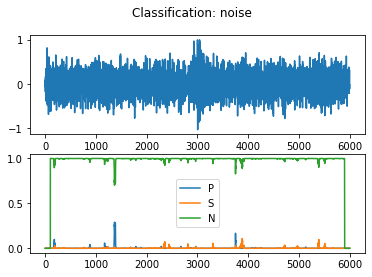

idx: 169
Origin time: 2018-12-18T04:16:03.727612Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

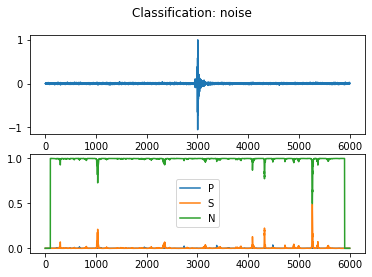

idx: 170
Origin time: 2018-12-18T03:49:23.567724Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

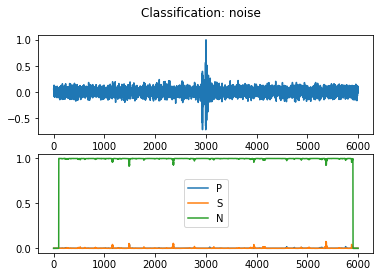

idx: 171
Origin time: 2018-12-14T20:53:07.933002Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

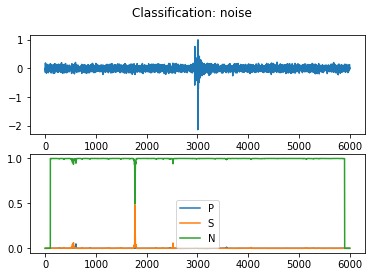

idx: 172
Origin time: 2018-12-17T16:25:31.908592Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

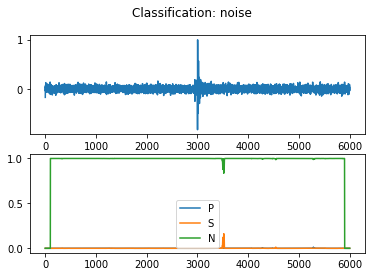

idx: 173
Origin time: 2018-12-14T14:59:47.016501Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

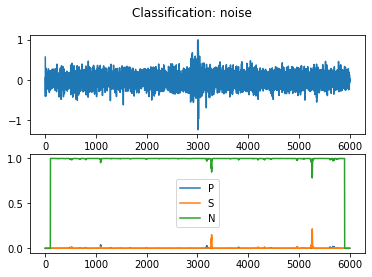

idx: 174
Origin time: 2018-12-17T22:22:55.306300Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

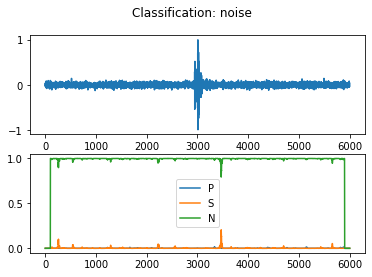

idx: 175
Origin time: 2018-12-17T23:33:57.752907Z
Station: 23.0
16/16 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

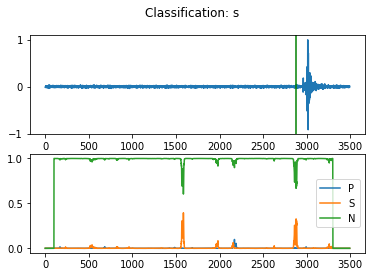

idx: 176
Origin time: 2018-12-18T01:05:38.853657Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

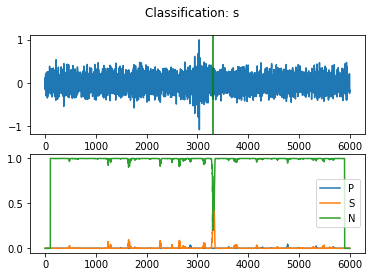

idx: 177
Origin time: 2018-12-17T20:33:53.967724Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

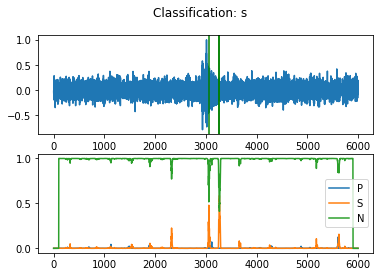

idx: 178
Origin time: 2018-12-14T19:41:43.690502Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

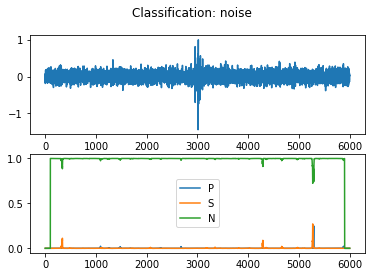

idx: 179
Origin time: 2018-12-18T05:43:59.435138Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

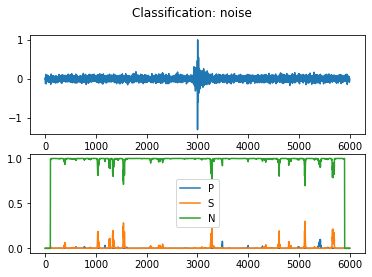

idx: 180
Origin time: 2018-12-14T16:34:59.789000Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

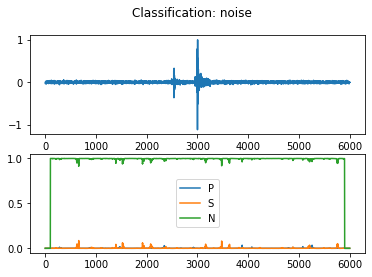

idx: 181
Origin time: 2018-12-18T02:14:27.949875Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

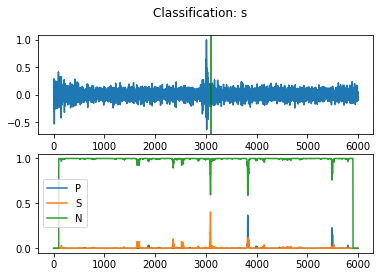

idx: 182
Origin time: 2018-12-17T23:51:17.507954Z
Station: 19.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

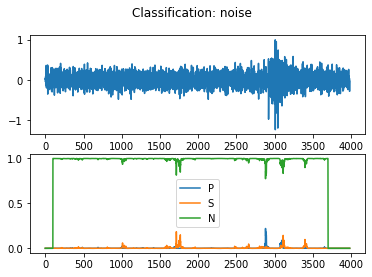

idx: 183
Origin time: 2018-12-18T08:22:58.056358Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

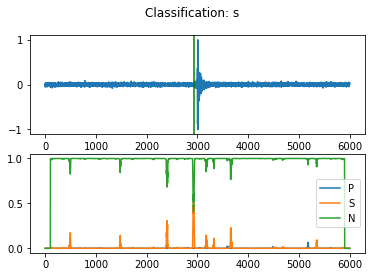

idx: 184
Origin time: 2018-12-14T17:22:42.675499Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

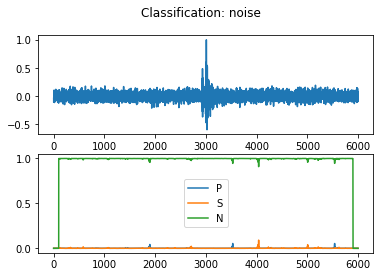

idx: 185
Origin time: 2018-12-15T03:03:12.658500Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

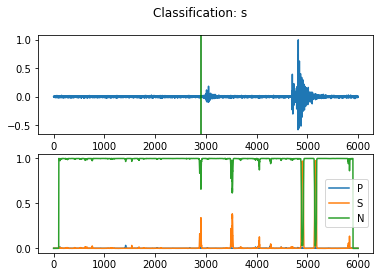

idx: 186
Origin time: 2018-12-17T18:35:58.865838Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

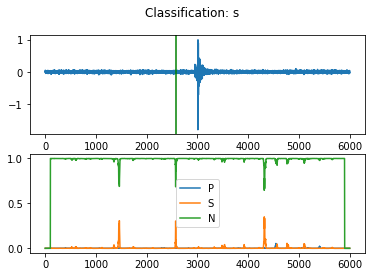

idx: 187
Origin time: 2018-12-15T04:53:41.535500Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

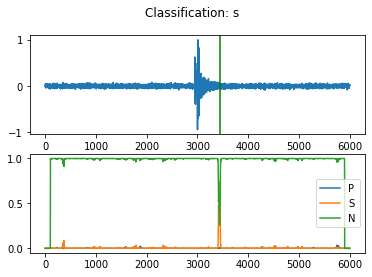

idx: 188
Origin time: 2018-12-17T19:46:31.569621Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

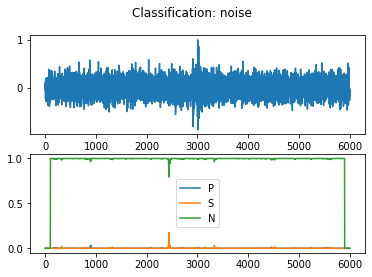

idx: 189
Origin time: 2018-12-18T01:06:05.327945Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

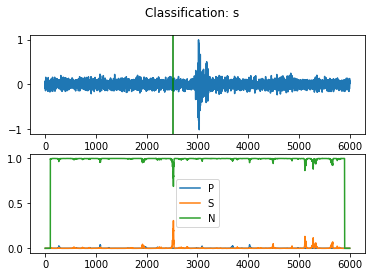

idx: 190
Origin time: 2018-12-14T15:03:35.531500Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

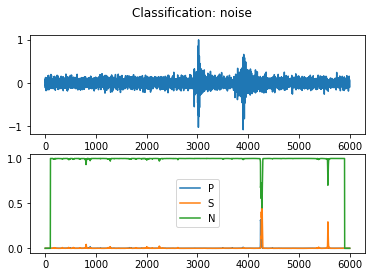

idx: 191
Origin time: 2018-12-18T04:02:55.329356Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

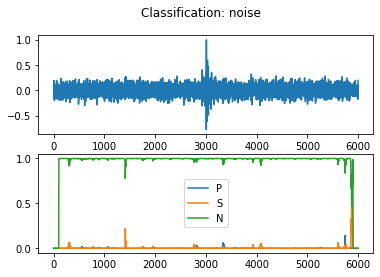

idx: 192
Origin time: 2018-12-14T17:35:11.920328Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

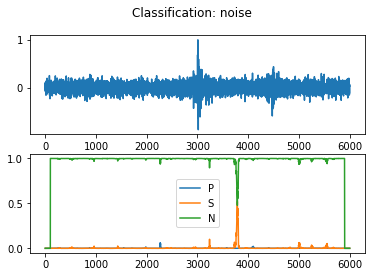

idx: 193
Origin time: 2018-12-17T21:07:05.393411Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

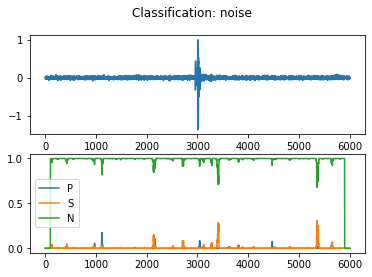

idx: 194
Origin time: 2018-12-14T20:25:16.036501Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

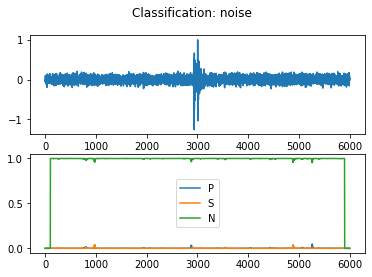

idx: 195
Origin time: 2018-12-18T05:28:27.166603Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

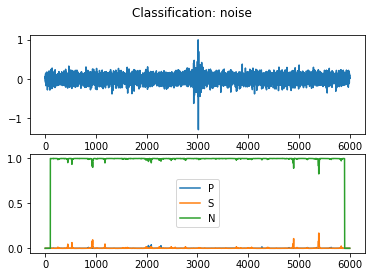

idx: 196
Origin time: 2018-12-15T04:40:32.564846Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

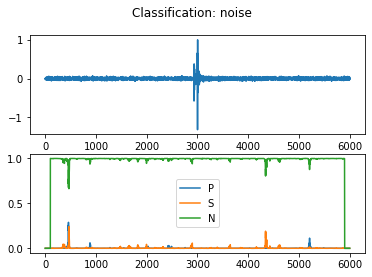

idx: 197
Origin time: 2018-12-14T15:59:47.932001Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

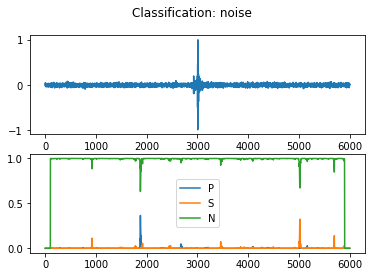

idx: 198
Origin time: 2018-12-17T19:05:27.053105Z
Station: 17.0
24/24 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

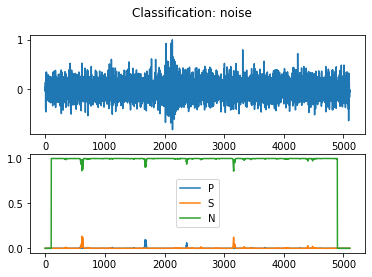

idx: 199
Origin time: 2018-12-15T14:18:26.986000Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

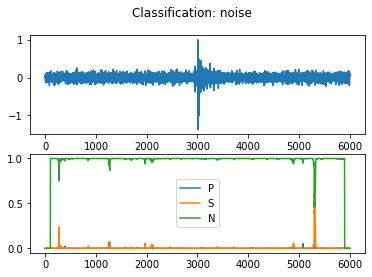

idx: 200
Origin time: 2018-10-16T13:50:03.054497Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

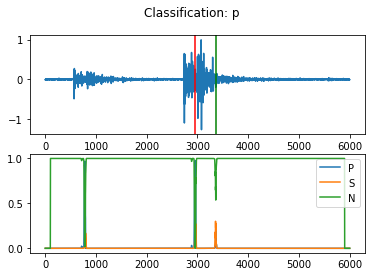

idx: 201
Origin time: 2018-10-18T14:36:56.365577Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

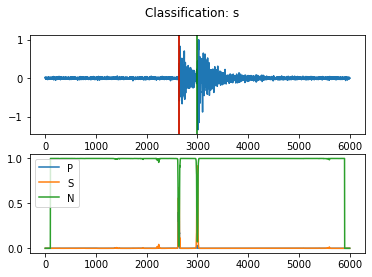

idx: 202
Origin time: 2018-10-18T15:28:10.374497Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

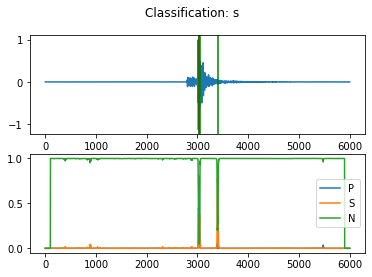

idx: 203
Origin time: 2018-10-22T11:50:58.318499Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

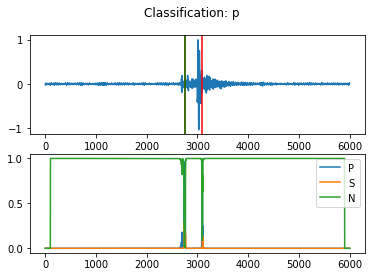

idx: 204
Origin time: 2018-10-24T13:39:32.605000Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

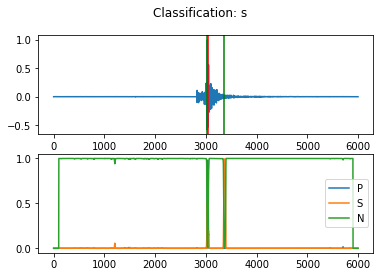

idx: 205
Origin time: 2018-10-24T13:50:30.363500Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

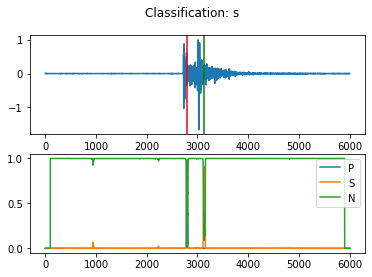

idx: 206
Origin time: 2018-10-25T11:35:09.063999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

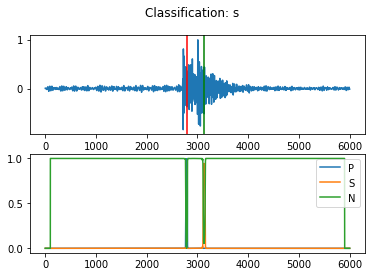

idx: 207
Origin time: 2018-10-25T12:06:06.030500Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

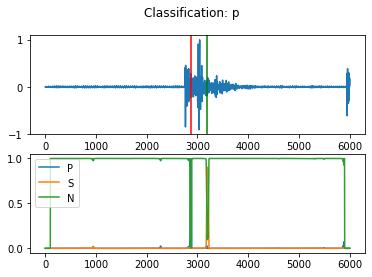

idx: 208
Origin time: 2018-10-25T13:06:04.392500Z
Station: 13.0
27/27 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

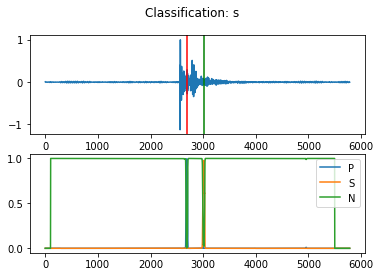

idx: 209
Origin time: 2018-10-25T13:24:57.868499Z
Station: 23.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

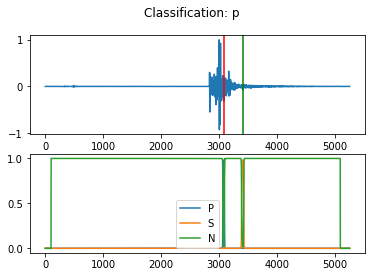

idx: 210
Origin time: 2018-10-25T14:51:08.971501Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

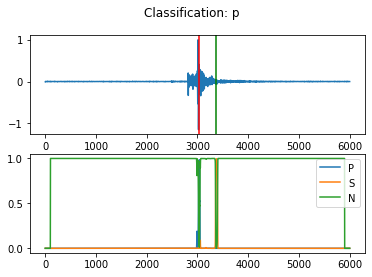

idx: 211
Origin time: 2018-10-25T15:21:02.568500Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

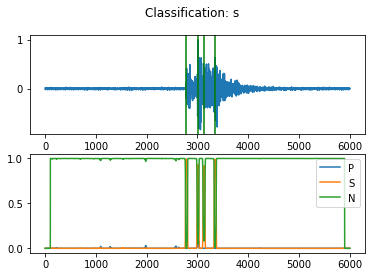

idx: 212
Origin time: 2018-10-25T15:29:13.992499Z
Station: 21.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

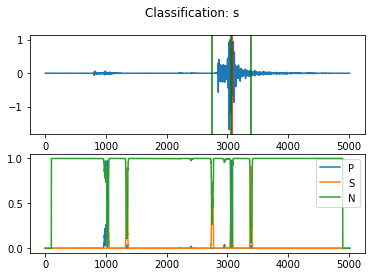

idx: 213
Origin time: 2018-10-26T08:41:33.930720Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

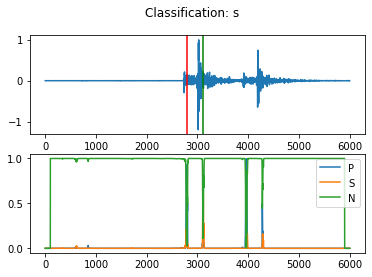

idx: 214
Origin time: 2018-10-26T11:10:38.751499Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

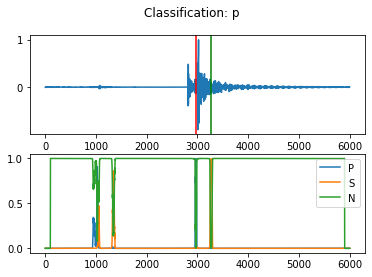

idx: 215
Origin time: 2018-10-27T11:03:25.592501Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

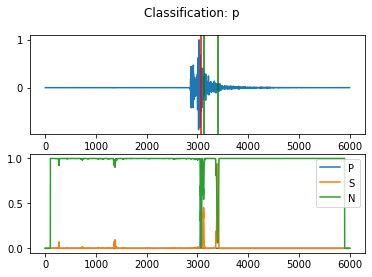

idx: 216
Origin time: 2018-10-27T11:07:27.968499Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

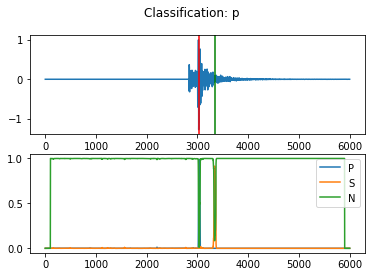

idx: 217
Origin time: 2018-10-30T14:44:14.028515Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

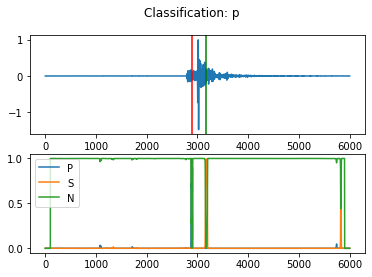

idx: 218
Origin time: 2018-10-31T08:22:53.634743Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

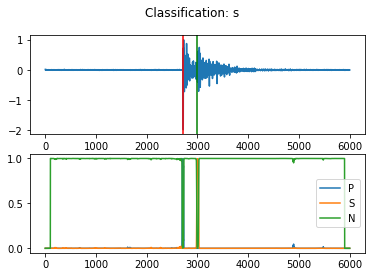

idx: 219
Origin time: 2018-10-31T10:41:20.509942Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

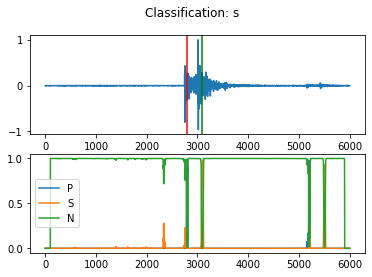

idx: 220
Origin time: 2018-12-09T21:15:05.094503Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

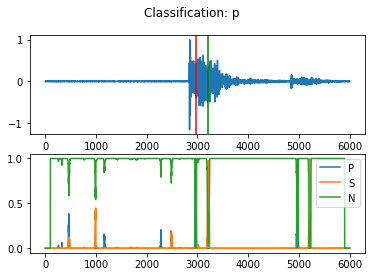

idx: 221
Origin time: 2018-12-10T12:38:48.028501Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

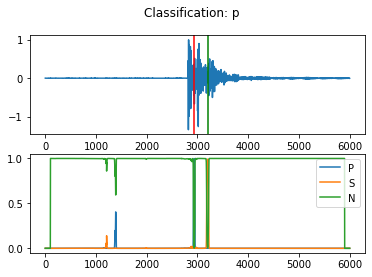

idx: 222
Origin time: 2018-12-11T10:02:18.704499Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

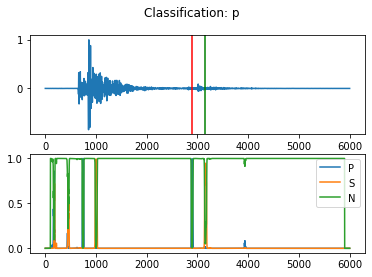

idx: 223
Origin time: 2018-12-14T13:08:09.864999Z
Station: 21.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

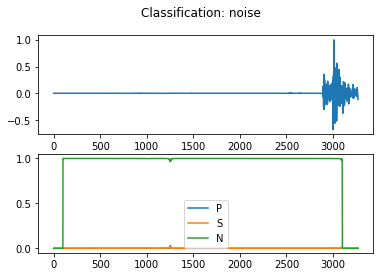

idx: 224
Origin time: 2018-12-14T14:29:28.540495Z
Station: 13.0
28/28 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

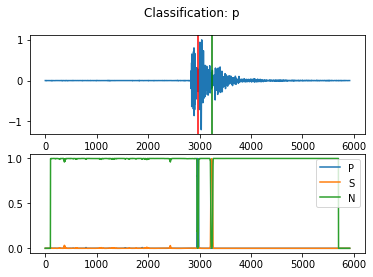

idx: 225
Origin time: 2018-10-16T14:19:06.757500Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

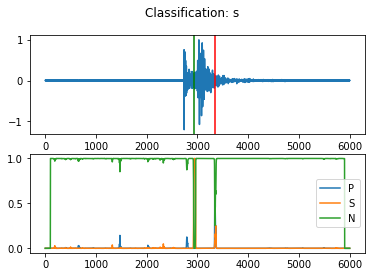

idx: 226
Origin time: 2018-10-16T15:09:03.861004Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

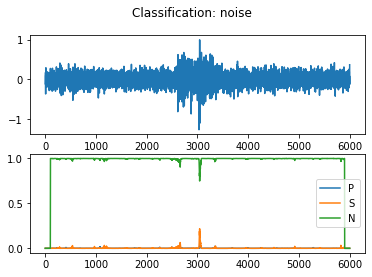

idx: 227
Origin time: 2018-10-17T17:42:02.327497Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

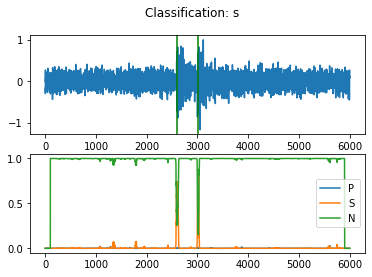

idx: 228
Origin time: 2018-10-17T18:08:09.744003Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

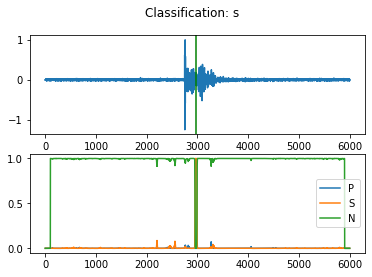

idx: 229
Origin time: 2018-10-18T14:33:02.257499Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

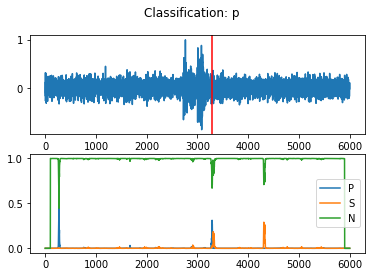

idx: 230
Origin time: 2018-10-18T14:51:27.571075Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

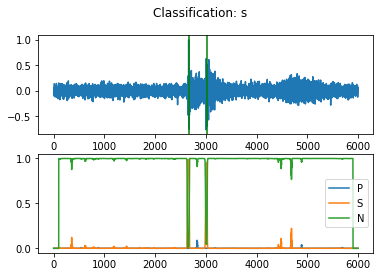

idx: 231
Origin time: 2018-10-19T12:51:45.401329Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

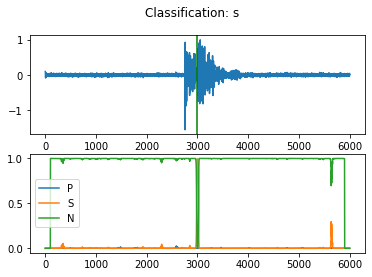

idx: 232
Origin time: 2018-10-22T22:16:28.447965Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

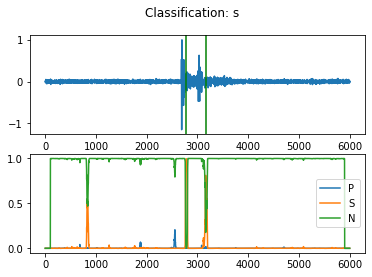

idx: 233
Origin time: 2018-10-25T11:39:17.202878Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

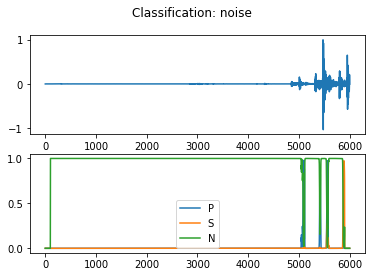

idx: 234
Origin time: 2018-10-25T12:17:17.935881Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

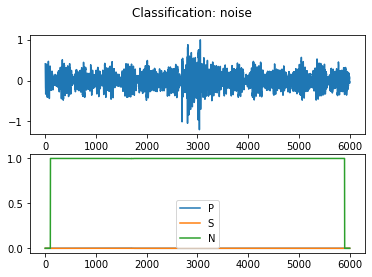

idx: 235
Origin time: 2018-10-25T12:41:31.613562Z
Station: 14.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

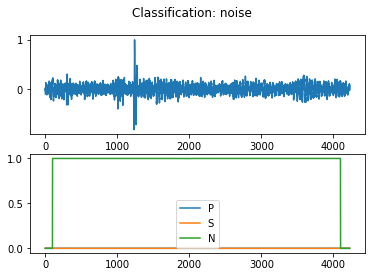

idx: 236
Origin time: 2018-10-25T15:07:15.980209Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

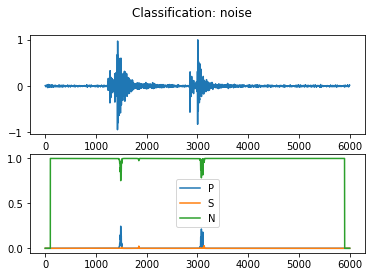

idx: 237
Origin time: 2018-10-25T17:08:35.407500Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

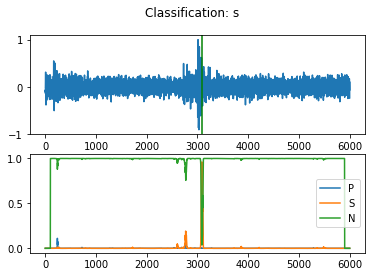

idx: 238
Origin time: 2018-10-26T11:33:25.464501Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

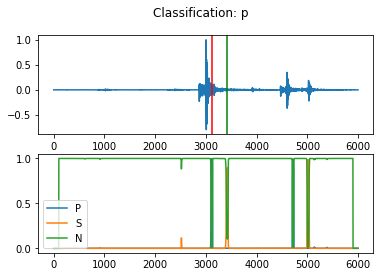

idx: 239
Origin time: 2018-10-27T10:38:21.402500Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

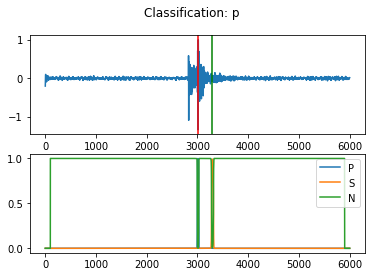

idx: 240
Origin time: 2018-10-27T10:59:00.343500Z
Station: 2.0
27/27 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

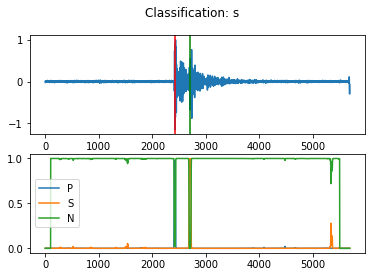

idx: 241
Origin time: 2018-10-27T14:33:33.790499Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

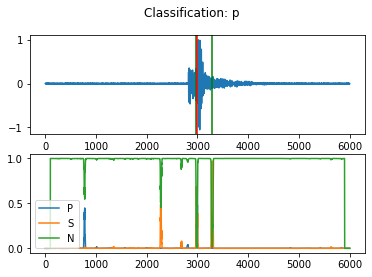

idx: 242
Origin time: 2018-11-02T17:46:02.084999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

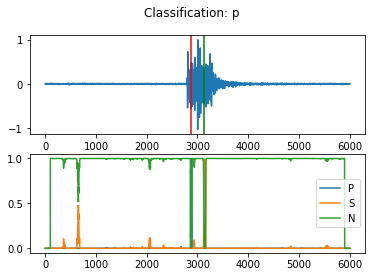

idx: 243
Origin time: 2018-12-11T09:21:27.727003Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

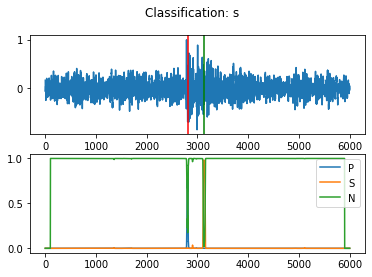

idx: 244
Origin time: 2018-12-11T09:32:04.531499Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

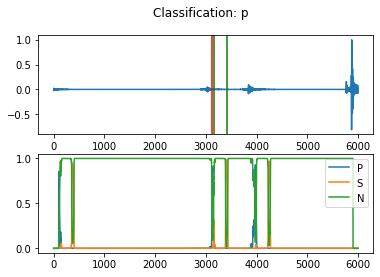

idx: 245
Origin time: 2018-12-11T10:29:19.072503Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

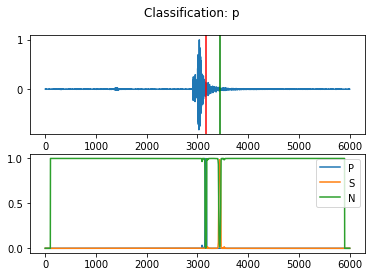

idx: 246
Origin time: 2018-12-13T11:19:20.107003Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

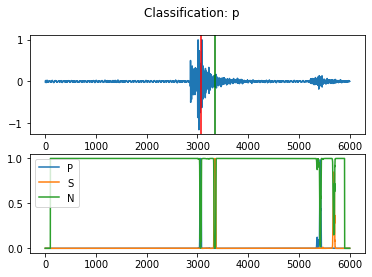

idx: 247
Origin time: 2018-12-14T20:12:31.725999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

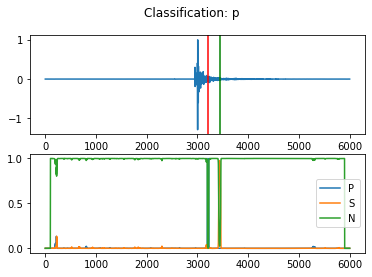

idx: 248
Origin time: 2018-12-17T11:31:06.791688Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

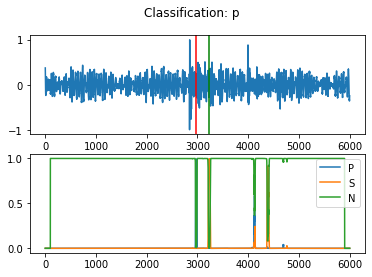

idx: 249
Origin time: 2018-12-17T12:07:50.291187Z
Station: 20.0
16/16 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

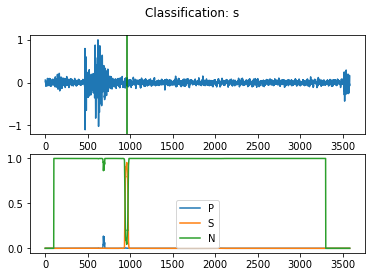

All done with S.


<Figure size 432x288 with 0 Axes>

In [18]:
# for S_df

results_S = pd.DataFrame(index= np.arange(0,len(S_df)),columns=['time', 'sta', 'pha', 'prob'])

for indx in np.arange(0, len(S_df)):
    # Dataframe to store picks from trigger
    df = pd.DataFrame(columns=['time', 'sta', 'pha', 'prob'])
    
    # read the data
    stcut_ENZ = read('./mseed_inputs/S_'+str(indx)+'.mseed',format='mseed')

    ##################################################

    # Expand overlapping windows using sliding_window function
    sliding_E = sliding_window(stcut_ENZ[0].data, 400, stepsize=shift_size) # Slide window across first component
    tr_win = np.zeros((sliding_E.shape[0], 400, 3)) # 3D array (of zeros)
    tr_win[:,:,0] = sliding_E # Add to 3D array
    sliding_E = None # clear some memory

    sliding_N = sliding_window(stcut_ENZ[1].data, 400, stepsize=shift_size) # Slide window across second component
    tr_win[:,:,1] = sliding_N # Add to 3D array
    sliding_N = None # clear some memory

    sliding_Z = sliding_window(stcut_ENZ[2].data, 400, stepsize=shift_size) # Slide window across third component
    tr_win[:,:,2] = sliding_Z # Add to 3D array
    sliding_Z = None # clear some memory

    tr_win = signal.detrend(tr_win, axis=1) # Detrend 
    tr_win = tr_win / np.max(np.abs(tr_win), axis=(1,2))[:,None,None] # Normalize between 0 and 1 (divide by max across 3 components for each window)
        
    # Model prediction step...
    ts = model.predict(tr_win, verbose=True, batch_size=batch_size)
    
    # Merge overlapping predictions:
    n_steps_per_win = 400/shift_size # No. of steps per window (i.e. how many overlapping windows)
    class_trace = np.zeros((len(stcut_ENZ[0].data), int(3))) # Create prediction traces to be same size as input data
    for i in np.arange(0, ts.shape[0]): # For each window
        class_trace[((i * shift_size) + 100):((i * shift_size) + 300), :] += ts[i, 100:300, :] # Keep middle 200 predictions

    # Extract probability trace for each (write to a file for future analysis?)
    prob_P = ts[:,0]
    prob_S = ts[:,1]
    prob_N = ts[:,2]

   # Use obspy trigger to find predictions above threshold (i.e. p_thresh and s_thresh)
    # P-wave picks (trigger):
    trigs = trigger_onset(class_trace[:,0], 0.3, trig_off) # Look for triggers (prediction trace exceeding p_thresh)
    p_picks = []
    p_probs = []
    
    for trig in trigs:
        if trig[1] == trig[0]:
            continue # If trigger on and off times are the same then ignore
        pick = np.argmax(class_trace[trig[0]:trig[1], 0]) + trig[0] # Use argmax between trigger on and off times as pick time
        stamp_pick = stcut_ENZ[0].stats.starttime + (pick * stcut_ENZ[0].stats.delta) # Pick time as UTCDateTime
        p_picks.append(stamp_pick) # Append time to list of P pick times
        p_probs.append(class_trace[pick, 0]) # Append prob to list of P pick probabilities
    
    
    # Add picks to df for this day            
    if len(p_picks) > 0:
        df_add = pd.DataFrame(p_picks, columns=['time'])
        df_add['pha'] = 'p'
        if (int(S_df['sta_str'].iloc[indx])+1) > 9:
            df_add['sta'] = "0" + str(int(S_df['sta_str'].iloc[indx]))
        else:
            df_add['sta'] = "00" + str(int(S_df['sta_str'].iloc[indx]))
        df_add['prob'] = p_probs
        df = pd.concat([df, df_add])
        
    # Repeat above for S-wave picks and s_thresh:
    trigs = trigger_onset(class_trace[:,1], s_thresh, trig_off)
    s_picks = []
    s_probs = []
    for trig in trigs:
        if trig[1] == trig[0]:
            continue
        pick = np.argmax(class_trace[trig[0]:trig[1], 1]) + trig[0]
        stamp_pick = stcut_ENZ[0].stats.starttime + (pick * stcut_ENZ[0].stats.delta)
        s_picks.append(stamp_pick)
        s_probs.append(class_trace[pick, 1])
        
    # Add picks to df for this day
    if len(s_picks) > 0:
        df_add = pd.DataFrame(s_picks, columns=['time'])
        df_add['pha'] = 's'
        if (int(S_df['sta_str'].iloc[indx])+1) > 9:
            df_add['sta'] = "0" + str(int(S_df['sta_str'].iloc[indx]))
        else:
            df_add['sta'] = "00" + str(int(S_df['sta_str'].iloc[indx]))
        df_add['prob'] = s_probs
        df = pd.concat([df, df_add])

    df = df.sort_values(by='prob',ascending=False).reset_index(drop=True)
    
    # get the picks that are +- 0.5 second (200 samples) of the phase time
    df_final = df[df['time'] >= S_df['starttime'].iloc[indx] -0.25]
    df_final = df_final[df_final['time'] <= S_df['starttime'].iloc[indx] +0.25]

#     then get the highest probability for that time window
    df_final = df_final.sort_values(by='prob',ascending=False).reset_index(drop=True)
    
    fig, axs = plt.subplots(2)


    # get the one nearest to the middle of the window
    if len(df_final) > 0:
        timediff = []
        for dfii in np.arange(0,len(df_final)):
            timediff1 = abs((stcut_ENZ[0].stats.starttime + 1.5) - df_final['time'].iloc[dfii])
            timediff.append(timediff1)
            
        fig.suptitle('Classification: '+ df_final['pha'].iloc[np.argmin(timediff)])
    else:
        fig.suptitle('Classification: noise')
        
        
    axs[0].plot(stcut_ENZ[(int(S_df['sta_str'].iloc[indx]) - 1)*3 + 2].data/max(stcut_ENZ[(int(S_df['sta_str'].iloc[indx]) - 1)*3 + 2].data))
    if len(df_final) > 0:
        df_final.to_csv('./Model_results/UGPD/S/df_final_'+str(indx)+'.csv')
        for thepicks in np.arange(0,len(df_final)):
            if df_final['pha'].iloc[thepicks] == 'p':
                axs[0].axvline(x=(abs(df_final['time'].iloc[thepicks] - stcut_ENZ[0].stats.starttime) / 0.0005),color='r')
            else:
                axs[0].axvline(x=(abs(df_final['time'].iloc[thepicks] - stcut_ENZ[0].stats.starttime) / 0.0005),color='g')
             
    else:
        pass
    axs[1].plot(class_trace[:,0],'-')
    axs[1].plot(class_trace[:,1],'-')
    axs[1].plot(class_trace[:,2],'-')
    axs[1].legend(['P','S','N'])
    
    plt.show()
    
    if indx < 10:
        fig.savefig('./Model_results/UGPD/S/S_result_00'+str(indx)+'.png')
    elif (indx > 9) and (indx < 100):
        fig.savefig('./Model_results/UGPD/S/S_result_0'+str(indx)+'.png')
    else:
        fig.savefig('./Model_results/UGPD/S/S_result_'+str(indx)+'.png')
        
    plt.close()
    plt.clf()
    #############
    
    # run through all P picks
    if len(df_final)>0:
        results_S['time'].iloc[indx] = df_final['time'].iloc[0]
        results_S['sta'].iloc[indx] = df_final['sta'].iloc[0]
        results_S['pha'].iloc[indx] = df_final['pha'].iloc[np.argmin(timediff)]
        results_S['prob'].iloc[indx] = df_final['prob'].iloc[np.argmin(timediff)]
    else:
        results_S['time'].iloc[indx] = np.nan
        results_S['sta'].iloc[indx] = S_df['sta_str'].iloc[indx]
        results_S['pha'].iloc[indx] = 'n'
        results_S['prob'].iloc[indx] = np.nan
        
results_S.to_csv('./Model_results/UGPD/S/250results_S.csv')
print("All done with S.")



idx: 0
Origin time: 2018-10-16T10:54:16.248596Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


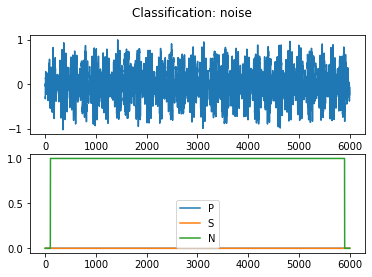

idx: 1
Origin time: 2018-10-17T10:44:04.472483Z
Station: 6.0
28/28 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

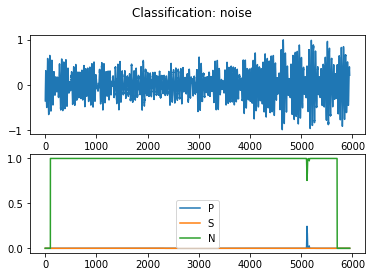

idx: 2
Origin time: 2018-10-17T10:44:17.199796Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

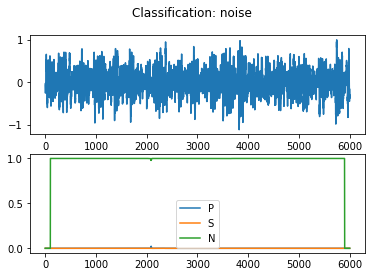

idx: 3
Origin time: 2018-10-17T10:46:20.051227Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

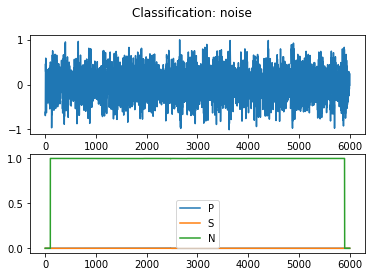

idx: 4
Origin time: 2018-10-17T10:46:58.983957Z
Station: 16.0
14/14 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

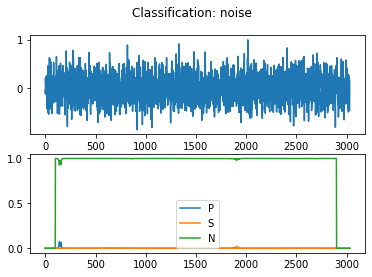

idx: 5
Origin time: 2018-10-17T10:48:47.566153Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

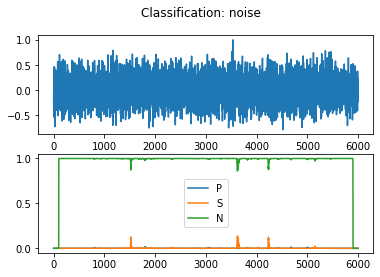

idx: 6
Origin time: 2018-10-17T10:54:19.768852Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

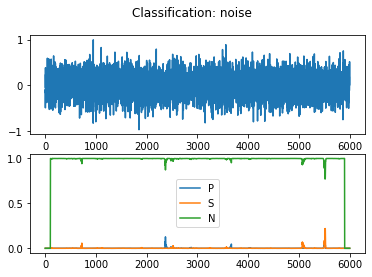

idx: 7
Origin time: 2018-10-23T14:22:10.717697Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

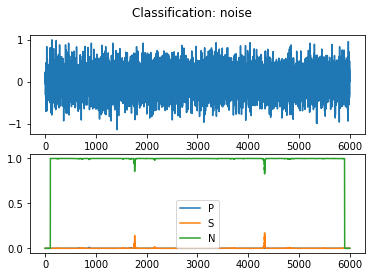

idx: 8
Origin time: 2018-10-23T14:27:14.027296Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

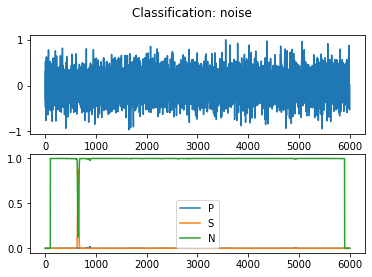

idx: 9
Origin time: 2018-10-23T14:30:55.205669Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

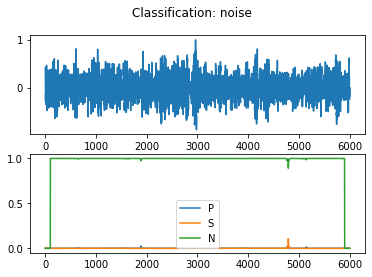

idx: 10
Origin time: 2018-10-23T14:35:41.846102Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

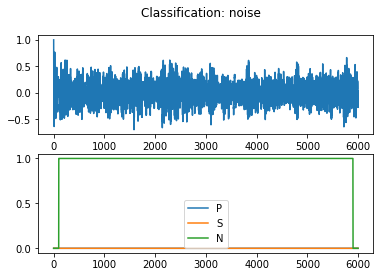

idx: 11
Origin time: 2018-10-23T14:36:13.695023Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

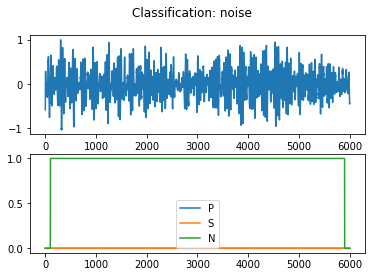

idx: 12
Origin time: 2018-10-23T14:36:48.565293Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

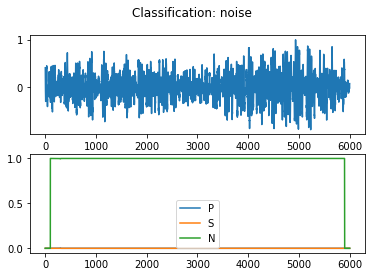

idx: 13
Origin time: 2018-10-23T14:37:27.176876Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

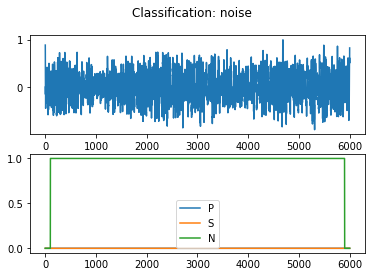

idx: 14
Origin time: 2018-10-23T14:38:04.956302Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

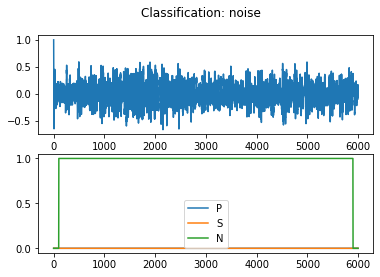

idx: 15
Origin time: 2018-10-23T14:39:11.987327Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

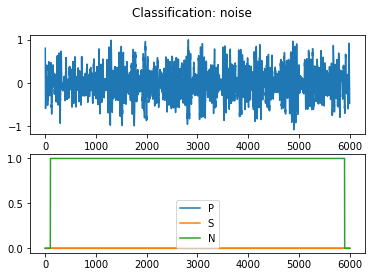

idx: 16
Origin time: 2018-10-23T14:39:18.568372Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

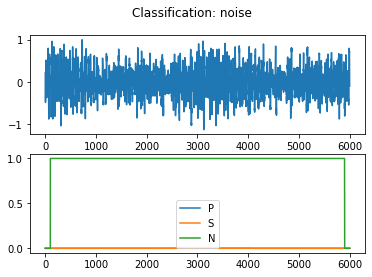

idx: 17
Origin time: 2018-10-23T14:40:32.303000Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

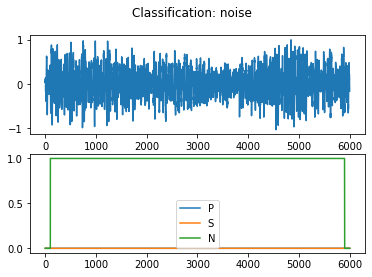

idx: 18
Origin time: 2018-10-23T14:41:39.037625Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

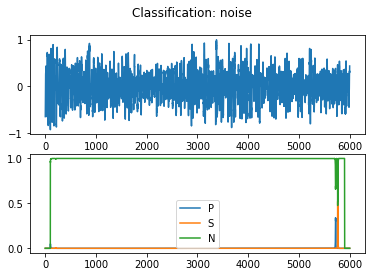

idx: 19
Origin time: 2018-10-23T14:41:48.264001Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

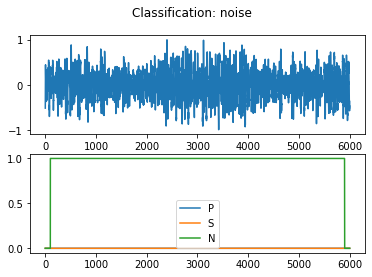

idx: 20
Origin time: 2018-10-23T14:41:51.280754Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

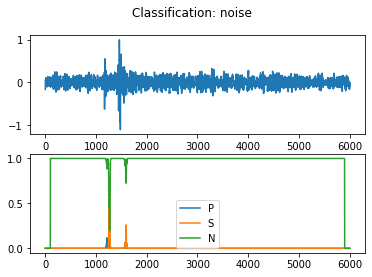

idx: 21
Origin time: 2018-10-23T14:44:23.224501Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

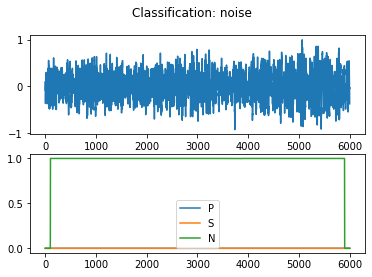

idx: 22
Origin time: 2018-10-23T14:44:27.344719Z
Station: 17.0
27/27 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

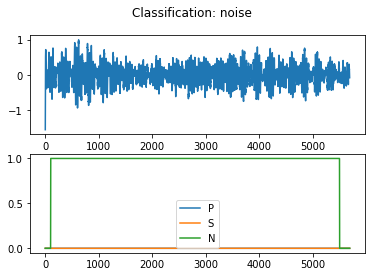

idx: 23
Origin time: 2018-10-23T14:44:32.631000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

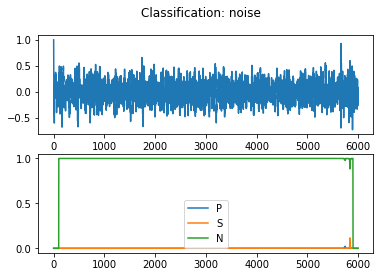

idx: 24
Origin time: 2018-10-23T14:44:35.440141Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

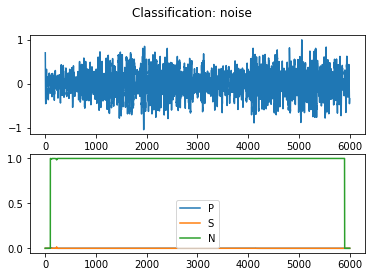

idx: 25
Origin time: 2018-10-23T14:44:42.436276Z
Station: 9.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

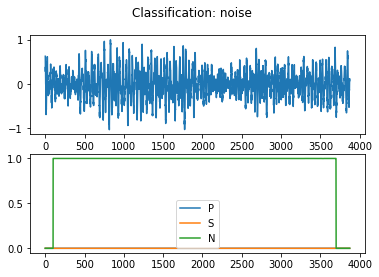

idx: 26
Origin time: 2018-10-23T14:34:57.867670Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

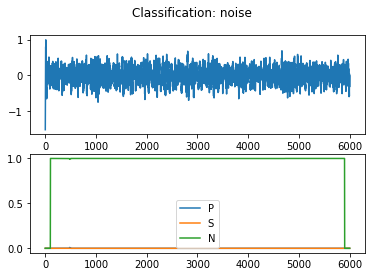

idx: 27
Origin time: 2018-10-23T14:45:30.691670Z
Station: 4.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

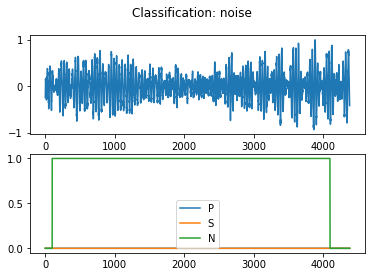

idx: 28
Origin time: 2018-10-23T14:45:38.166110Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

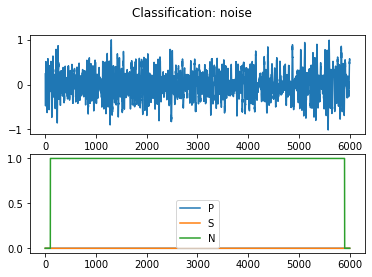

idx: 29
Origin time: 2018-10-23T14:45:42.057500Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

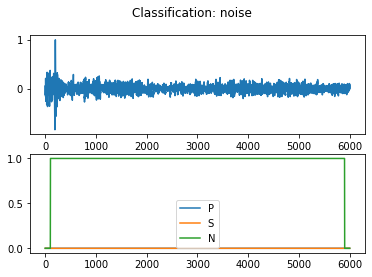

idx: 30
Origin time: 2018-10-23T14:41:59.429500Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

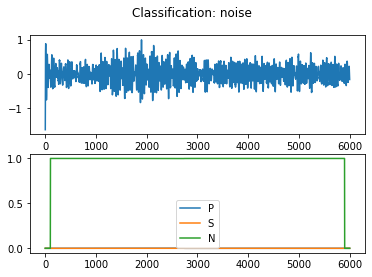

idx: 31
Origin time: 2018-10-23T14:48:44.251333Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

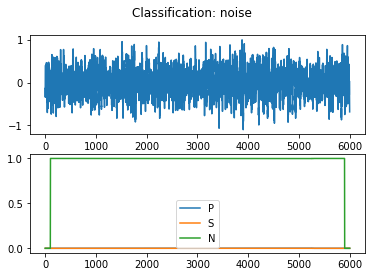

idx: 32
Origin time: 2018-10-23T14:48:58.505501Z
Station: 21.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

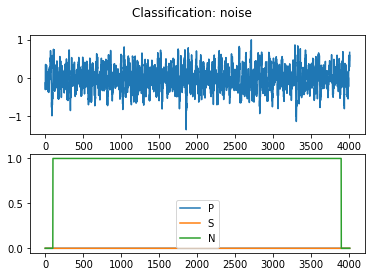

idx: 33
Origin time: 2018-10-23T14:49:46.866822Z
Station: 22.0
22/22 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

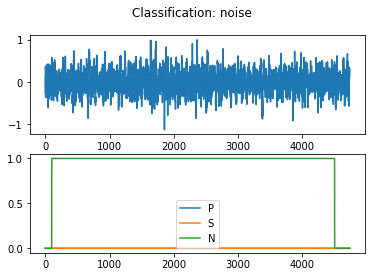

idx: 34
Origin time: 2018-10-23T14:51:49.680492Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

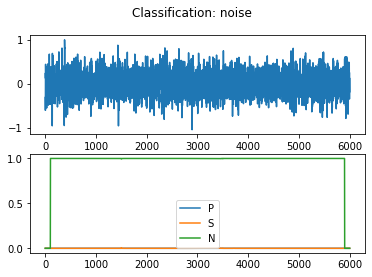

idx: 35
Origin time: 2018-10-23T14:52:00.384999Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

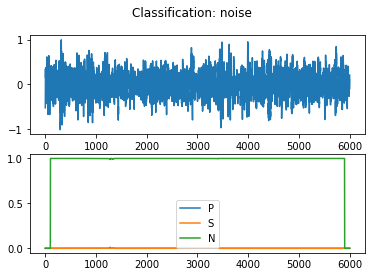

idx: 36
Origin time: 2018-10-23T14:52:34.182500Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

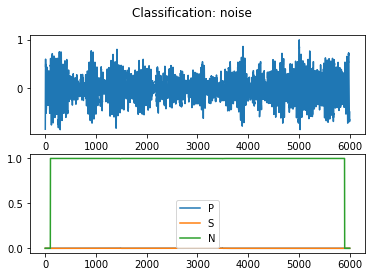

idx: 37
Origin time: 2018-10-23T14:53:35.571001Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

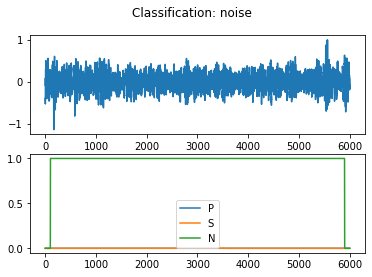

idx: 38
Origin time: 2018-10-23T14:53:32.181478Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

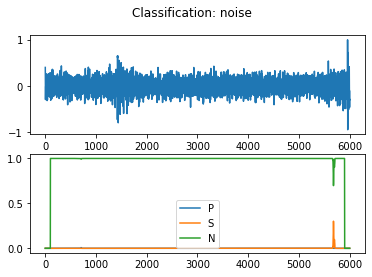

idx: 39
Origin time: 2018-10-23T14:54:23.041013Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

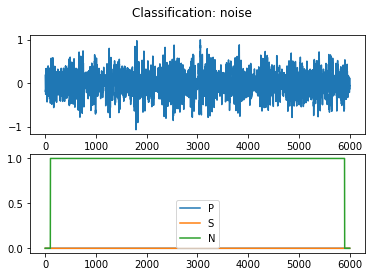

idx: 40
Origin time: 2018-10-23T14:55:55.916572Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

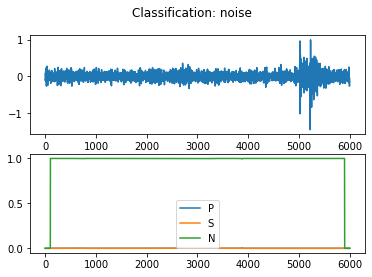

idx: 41
Origin time: 2018-10-23T14:56:25.526500Z
Station: 24.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

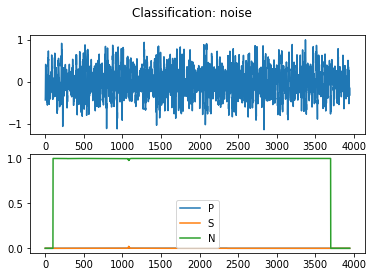

idx: 42
Origin time: 2018-10-23T14:57:02.238996Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

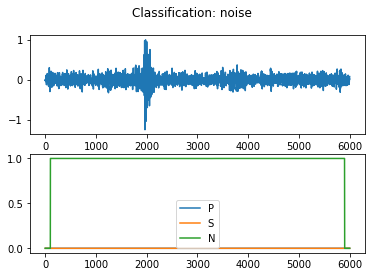

idx: 43
Origin time: 2018-10-23T14:57:31.732999Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

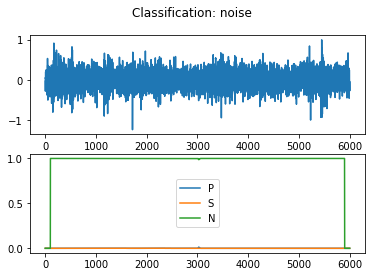

idx: 44
Origin time: 2018-10-23T14:57:41.961501Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

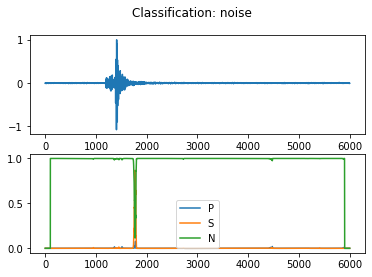

idx: 45
Origin time: 2018-10-23T14:57:47.420499Z
Station: 20.0
28/28 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

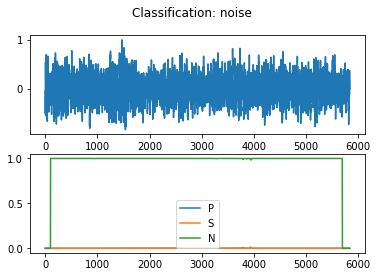

idx: 46
Origin time: 2018-10-23T14:58:00.046001Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

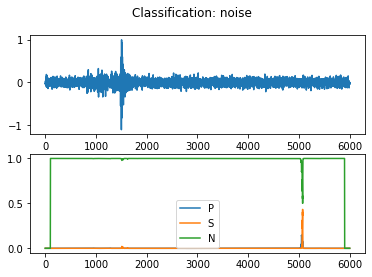

idx: 47
Origin time: 2018-10-23T14:58:06.818501Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

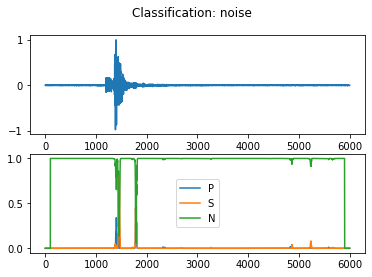

idx: 48
Origin time: 2018-10-23T14:58:37.114893Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

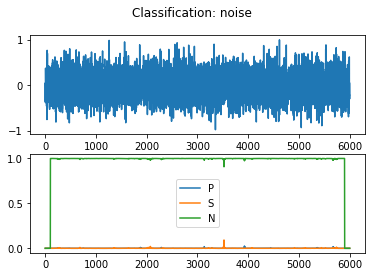

idx: 49
Origin time: 2018-10-23T14:58:46.647501Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

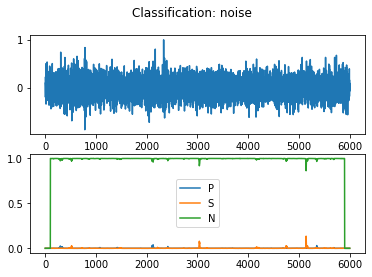

idx: 50
Origin time: 2018-10-23T14:58:59.740000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

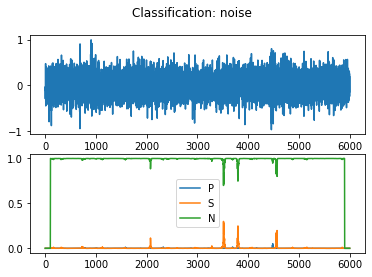

idx: 51
Origin time: 2018-10-23T14:59:14.711999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

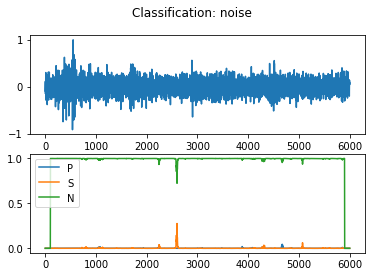

idx: 52
Origin time: 2018-10-23T14:59:16.205999Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

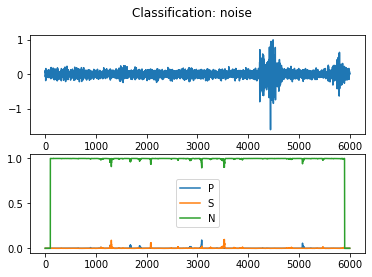

idx: 53
Origin time: 2018-10-23T14:59:22.648624Z
Station: 5.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

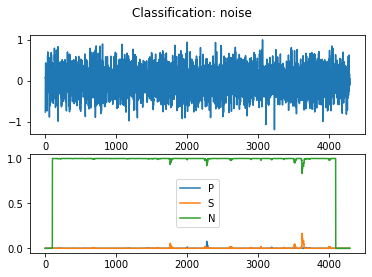

idx: 54
Origin time: 2018-10-23T14:59:26.986514Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

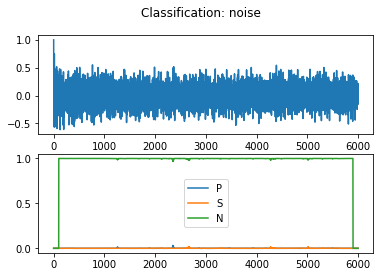

idx: 55
Origin time: 2018-10-23T14:59:35.694000Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

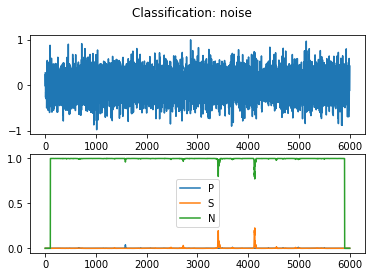

idx: 56
Origin time: 2018-10-23T14:59:36.325500Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

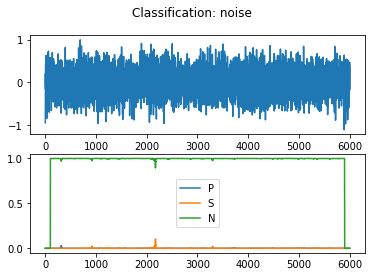

idx: 57
Origin time: 2018-10-29T09:07:42.543459Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

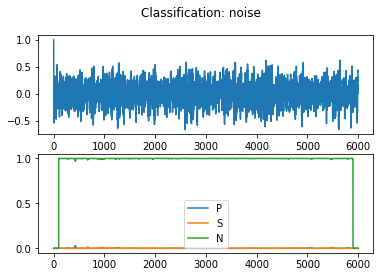

idx: 58
Origin time: 2018-10-29T09:11:08.154020Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

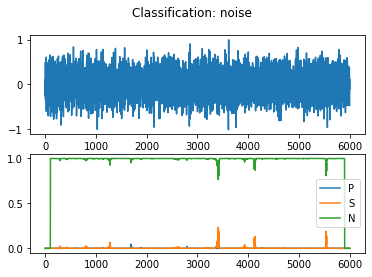

idx: 59
Origin time: 2018-10-29T09:11:26.426414Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

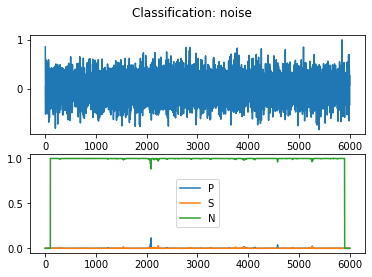

idx: 60
Origin time: 2018-10-29T09:13:14.237352Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

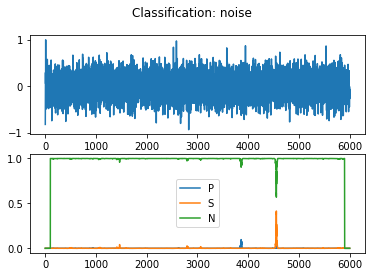

idx: 61
Origin time: 2018-10-29T09:13:25.269081Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

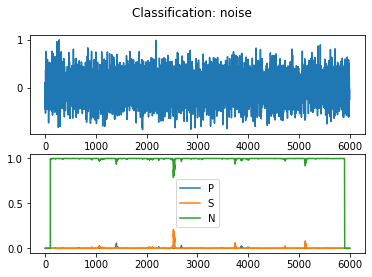

idx: 62
Origin time: 2018-10-29T09:17:57.515387Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

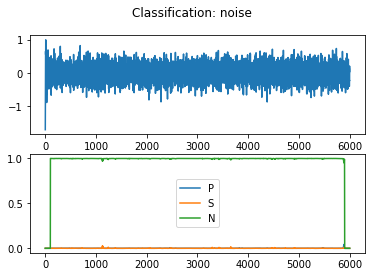

idx: 63
Origin time: 2018-10-29T09:24:13.784174Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

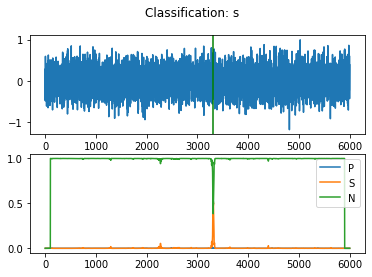

idx: 64
Origin time: 2018-10-29T09:26:03.826933Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

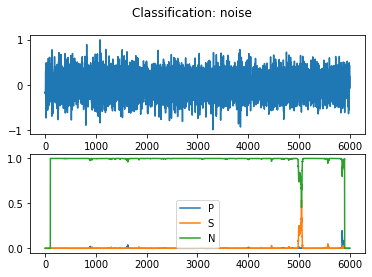

idx: 65
Origin time: 2018-10-29T09:29:49.316275Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

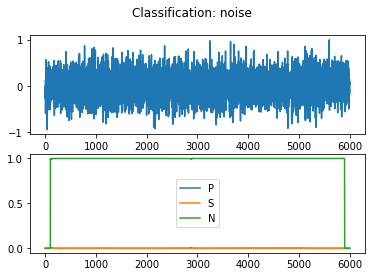

idx: 66
Origin time: 2018-10-29T09:30:18.400192Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

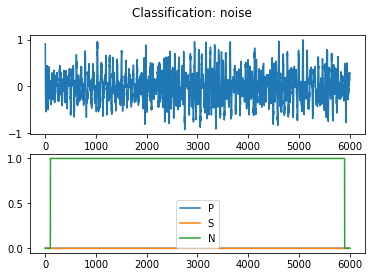

idx: 67
Origin time: 2018-10-29T09:31:16.304956Z
Station: 10.0
27/27 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

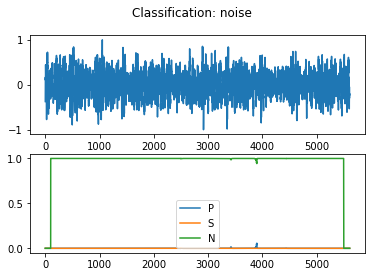

idx: 68
Origin time: 2018-10-29T09:31:38.836847Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

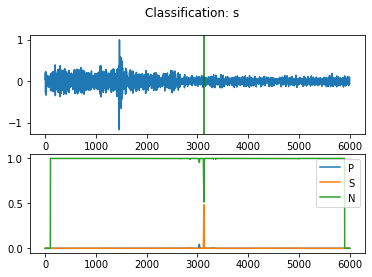

idx: 69
Origin time: 2018-10-29T09:31:45.983910Z
Station: 14.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

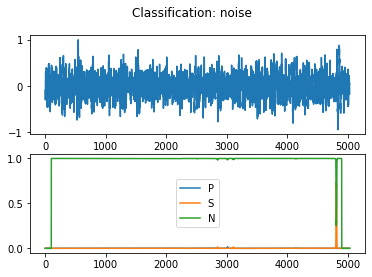

idx: 70
Origin time: 2018-10-29T09:31:51.377337Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

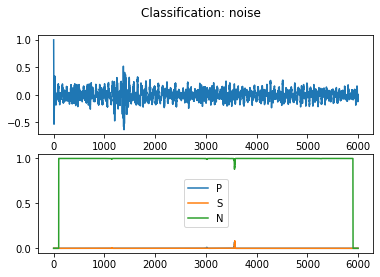

idx: 71
Origin time: 2018-10-29T09:31:56.829528Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

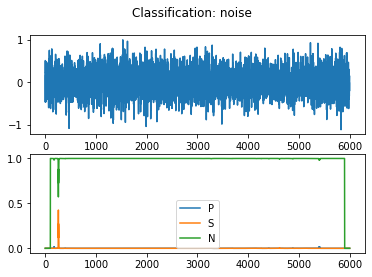

idx: 72
Origin time: 2018-10-29T09:32:37.878250Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

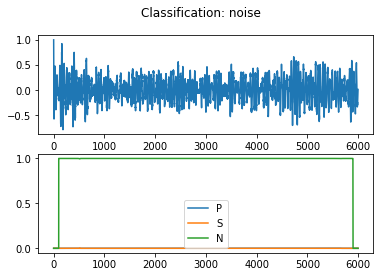

idx: 73
Origin time: 2018-10-29T09:50:47.413060Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

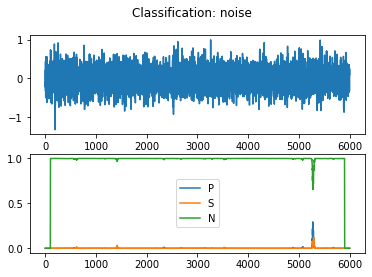

idx: 74
Origin time: 2018-10-29T09:53:26.741347Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

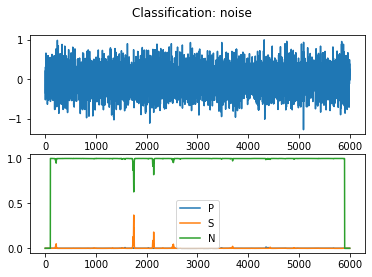

idx: 75
Origin time: 2018-10-29T09:57:32.718267Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

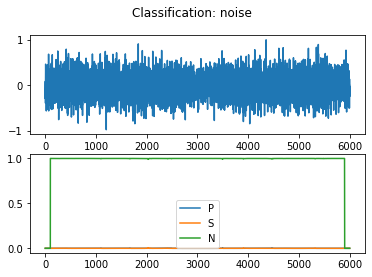

idx: 76
Origin time: 2018-10-29T09:58:51.163098Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

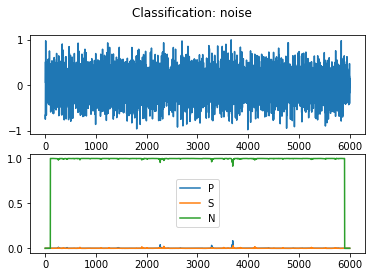

idx: 77
Origin time: 2018-10-29T09:59:23.815310Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

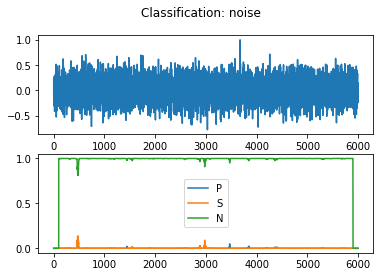

idx: 78
Origin time: 2018-10-29T09:59:29.322156Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

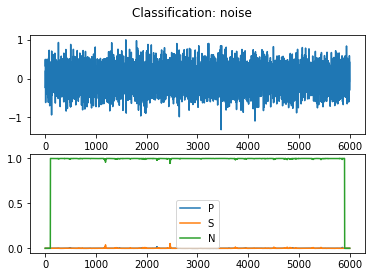

idx: 79
Origin time: 2018-12-11T09:19:09.230001Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

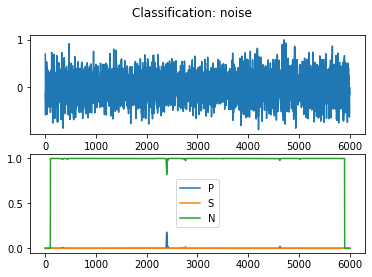

idx: 80
Origin time: 2018-12-11T09:22:26.017658Z
Station: 7.0
23/23 [==============================] - 0s 2ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

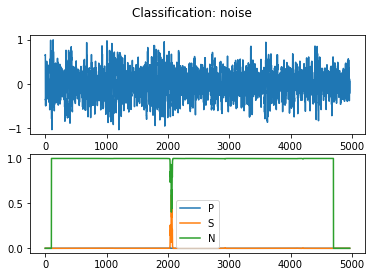

idx: 81
Origin time: 2018-12-11T09:24:06.815001Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

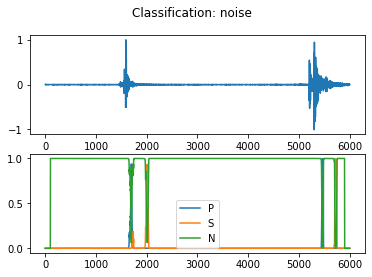

idx: 82
Origin time: 2018-12-11T09:25:53.910501Z
Station: 5.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

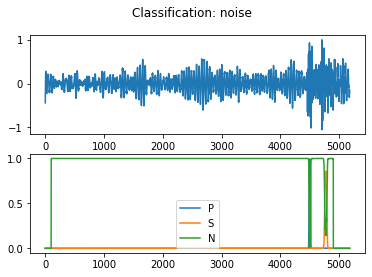

idx: 83
Origin time: 2018-12-11T09:27:05.631999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

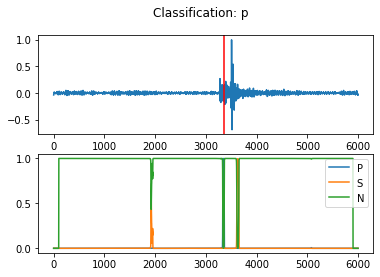

idx: 84
Origin time: 2018-12-11T09:27:24.309002Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

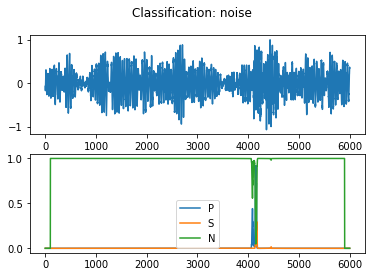

idx: 85
Origin time: 2018-12-11T09:28:26.621000Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

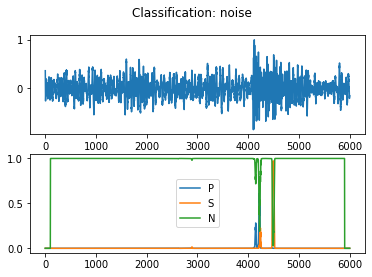

idx: 86
Origin time: 2018-12-11T09:32:59.832002Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

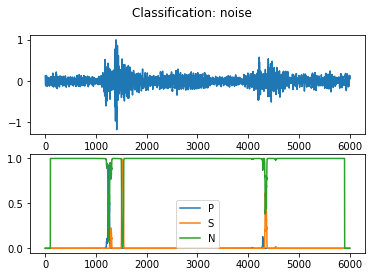

idx: 87
Origin time: 2018-12-11T09:33:39.099497Z
Station: 24.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

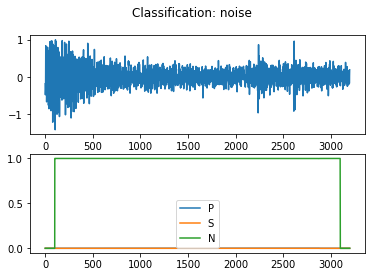

idx: 88
Origin time: 2018-12-11T09:37:46.832116Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

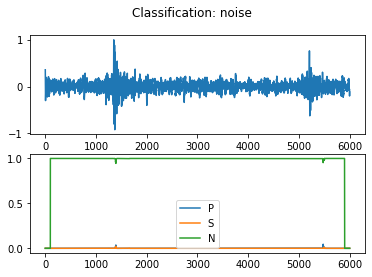

idx: 89
Origin time: 2018-12-11T09:41:20.745110Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

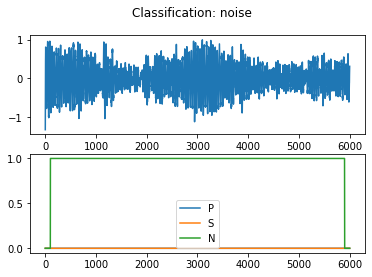

idx: 90
Origin time: 2018-12-11T09:42:18.640003Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

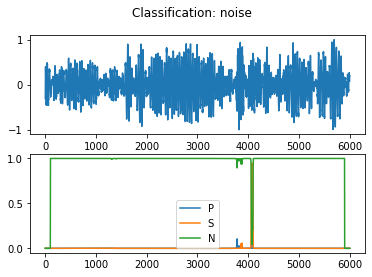

idx: 91
Origin time: 2018-12-11T09:43:36.406276Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

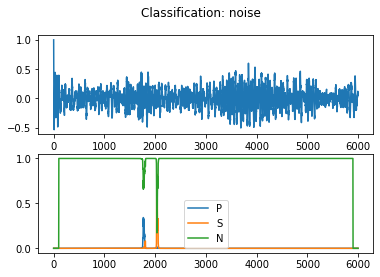

idx: 92
Origin time: 2018-12-11T09:50:30.746501Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

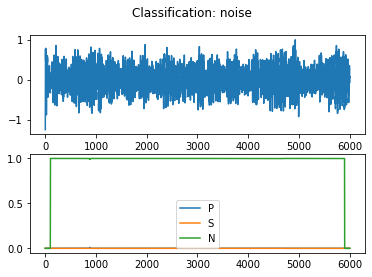

idx: 93
Origin time: 2018-12-11T09:50:50.995503Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

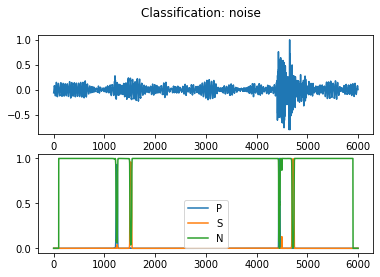

idx: 94
Origin time: 2018-12-11T09:52:36.546497Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

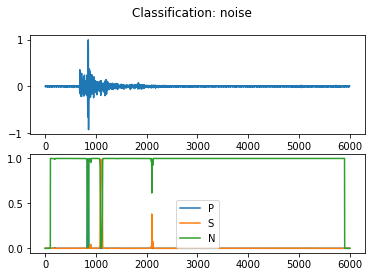

idx: 95
Origin time: 2018-12-11T09:53:42.695501Z
Station: 24.0
29/29 [==============================] - 0s 2ms/step


<Figure size 432x288 with 0 Axes>

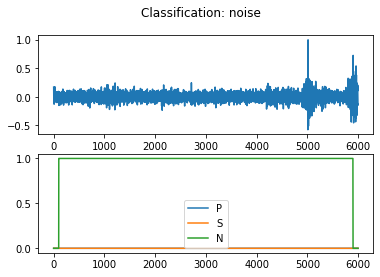

idx: 96
Origin time: 2018-12-11T09:55:20.010502Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

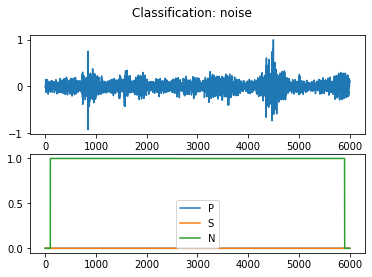

idx: 97
Origin time: 2018-12-11T09:55:56.104001Z
Station: 7.0
29/29 [==============================] - 0s 2ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

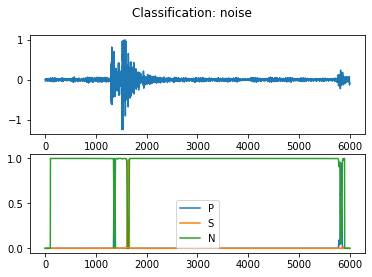

idx: 98
Origin time: 2018-12-11T09:55:44.867947Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

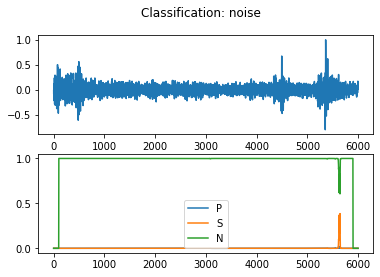

idx: 99
Origin time: 2018-12-11T09:57:07.696001Z
Station: 22.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

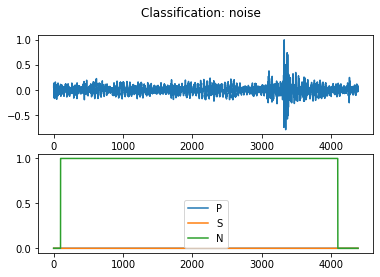

idx: 100
Origin time: 2018-12-11T11:21:13.689824Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

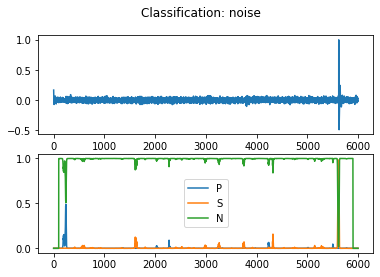

idx: 101
Origin time: 2018-10-29T11:30:37.354076Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

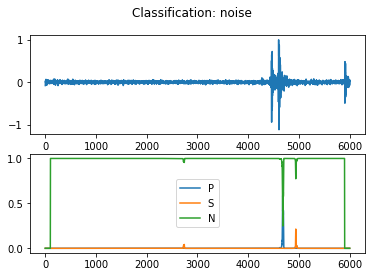

idx: 102
Origin time: 2018-10-29T18:01:09.570937Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

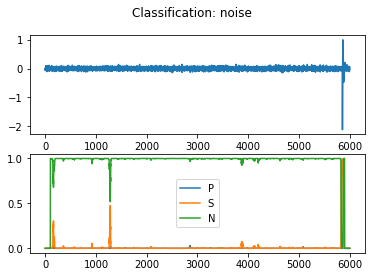

idx: 103
Origin time: 2018-10-26T11:35:43.957398Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

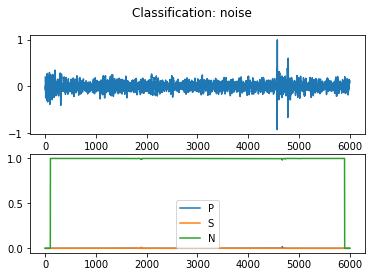

idx: 104
Origin time: 2018-10-27T10:55:23.728788Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

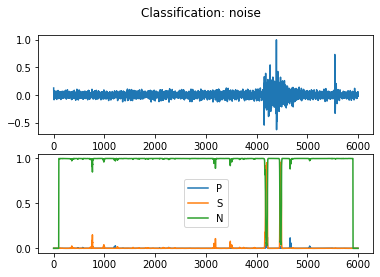

idx: 105
Origin time: 2018-11-04T16:24:04.536114Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

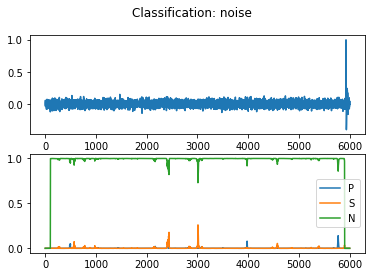

idx: 106
Origin time: 2018-10-24T13:02:27.536215Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

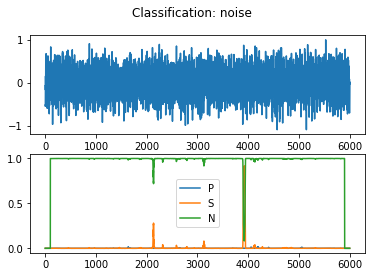

idx: 107
Origin time: 2018-10-25T14:59:24.550128Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

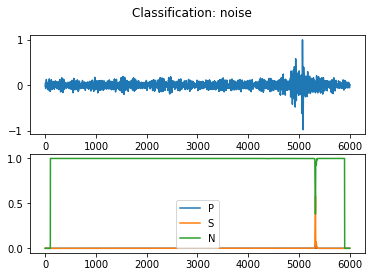

idx: 108
Origin time: 2018-10-23T14:45:30.611670Z
Station: 18.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

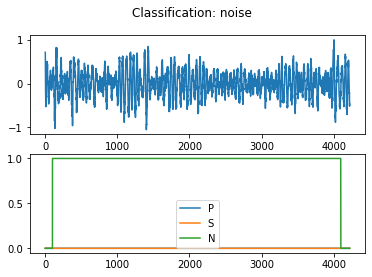

idx: 109
Origin time: 2018-12-14T13:41:02.977303Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

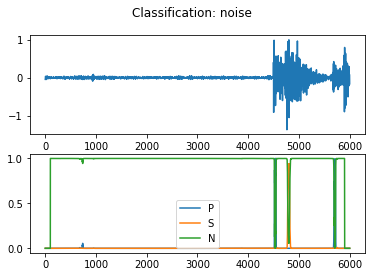

idx: 110
Origin time: 2018-10-25T17:00:32.253072Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

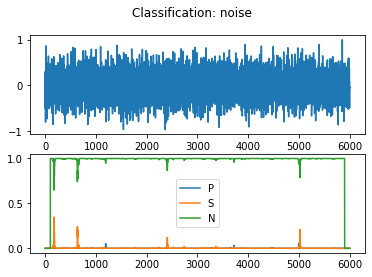

idx: 111
Origin time: 2018-10-26T11:26:05.025376Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

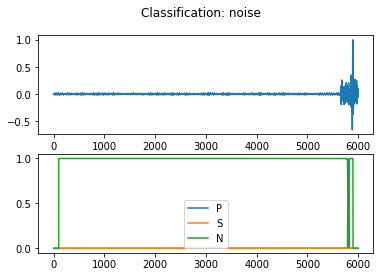

idx: 112
Origin time: 2018-12-11T09:53:29.423274Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

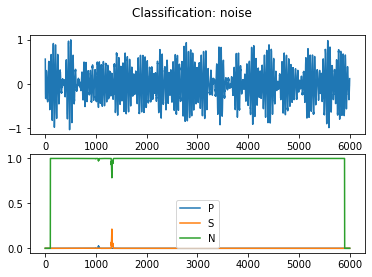

idx: 113
Origin time: 2018-10-29T11:58:32.907222Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

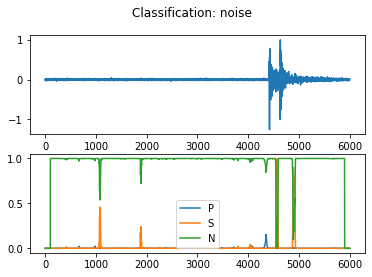

idx: 114
Origin time: 2018-12-11T10:06:42.920583Z
Station: 13.0
14/14 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

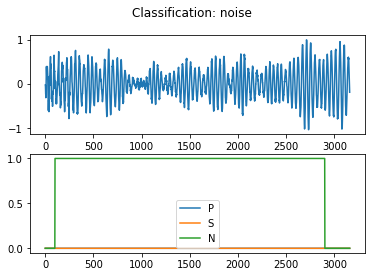

idx: 115
Origin time: 2018-12-14T13:09:49.783000Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

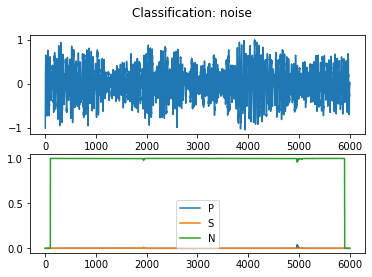

idx: 116
Origin time: 2018-12-11T09:34:59.473777Z
Station: 8.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

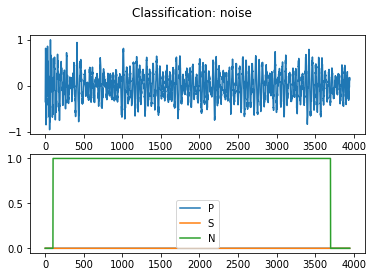

idx: 117
Origin time: 2018-10-26T20:39:21.134610Z
Station: 11.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

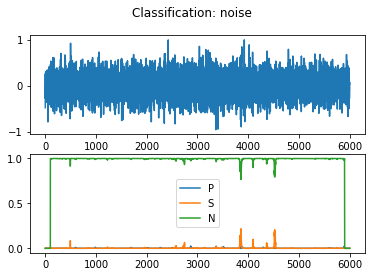

idx: 118
Origin time: 2018-10-24T13:26:24.708736Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

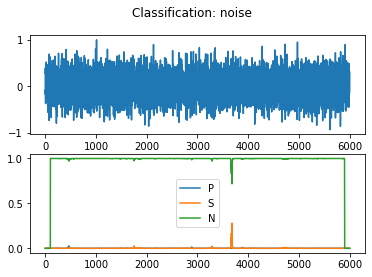

idx: 119
Origin time: 2018-12-14T14:51:54.948504Z
Station: 12.0
23/23 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

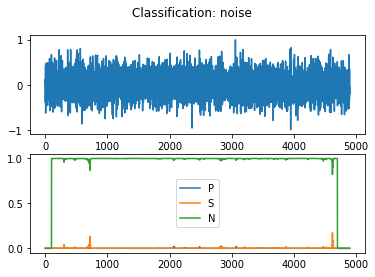

idx: 120
Origin time: 2018-12-13T13:25:15.097558Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

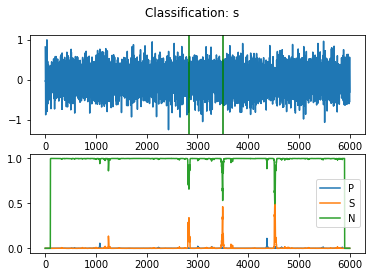

idx: 121
Origin time: 2018-12-08T12:27:42.381485Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

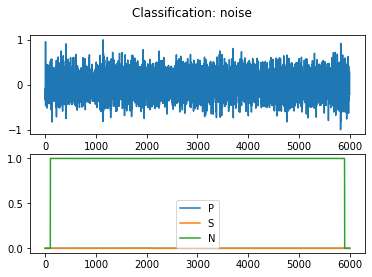

idx: 122
Origin time: 2018-10-25T15:06:02.902139Z
Station: 14.0
14/14 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

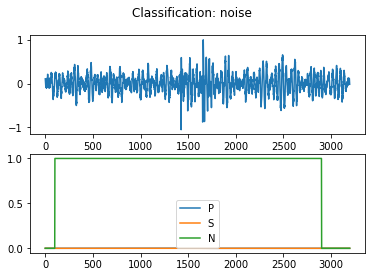

idx: 123
Origin time: 2018-10-24T23:56:11.226137Z
Station: 4.0
26/26 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

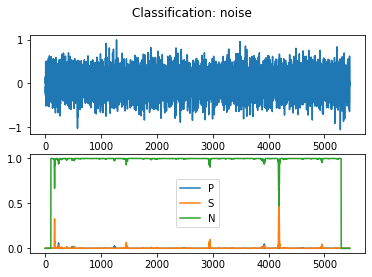

idx: 124
Origin time: 2018-10-25T12:40:57.846937Z
Station: 12.0
25/25 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

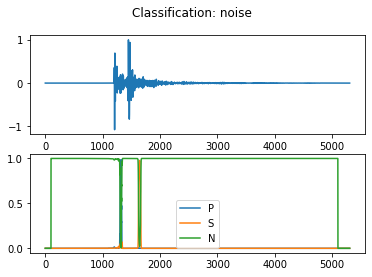

idx: 125
Origin time: 2018-10-18T15:48:51.743427Z
Station: 18.0
21/21 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

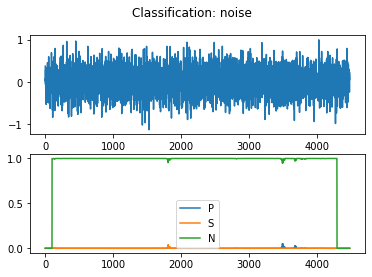

idx: 126
Origin time: 2018-12-11T10:34:33.615646Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

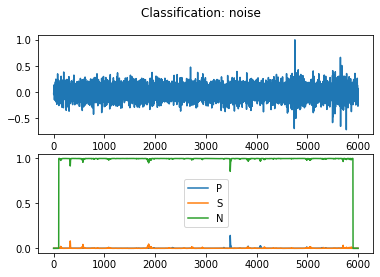

idx: 127
Origin time: 2018-10-29T21:13:56.987642Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

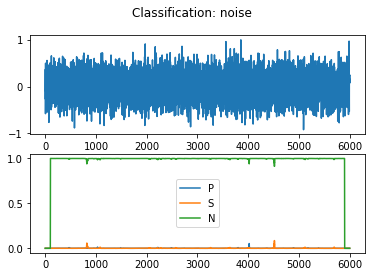

idx: 128
Origin time: 2018-10-30T01:37:35.840873Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

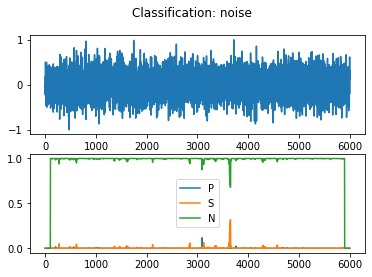

idx: 129
Origin time: 2018-10-27T11:44:29.501597Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

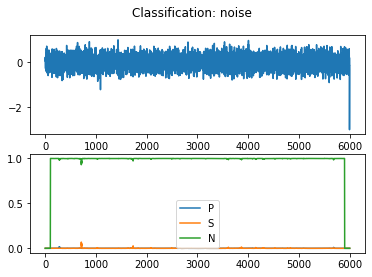

idx: 130
Origin time: 2018-12-11T10:18:44.921932Z
Station: 5.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

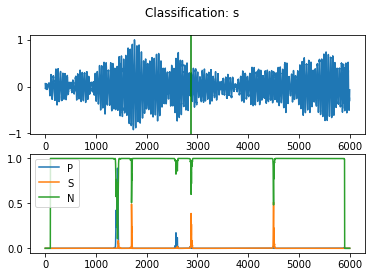

idx: 131
Origin time: 2018-10-20T03:43:59.574986Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

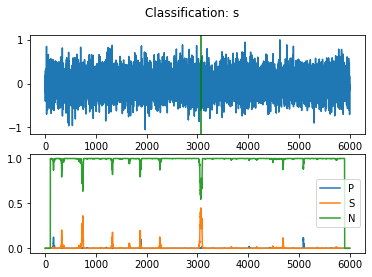

idx: 132
Origin time: 2018-10-29T11:44:40.201886Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

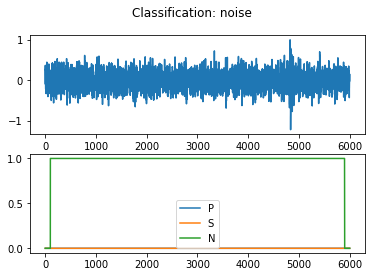

idx: 133
Origin time: 2018-10-19T13:20:46.841106Z
Station: 6.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

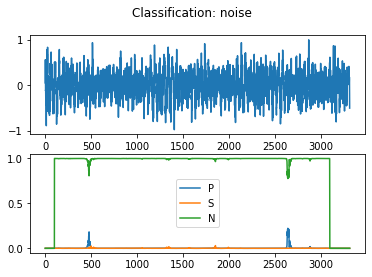

idx: 134
Origin time: 2018-10-25T14:56:26.483150Z
Station: 5.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

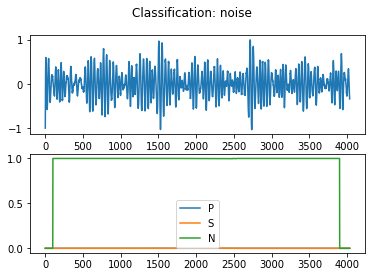

idx: 135
Origin time: 2018-10-26T02:12:59.995291Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

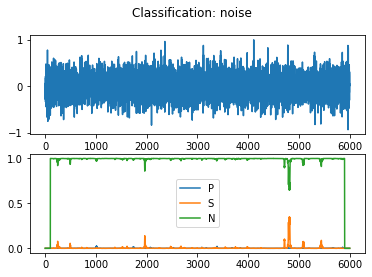

idx: 136
Origin time: 2018-12-10T10:30:56.174963Z
Station: 18.0
29/29 [==============================] - 0s 2ms/step


<Figure size 432x288 with 0 Axes>

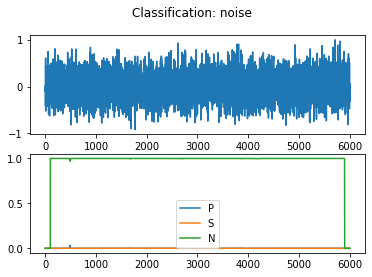

idx: 137
Origin time: 2018-12-11T10:20:25.858469Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

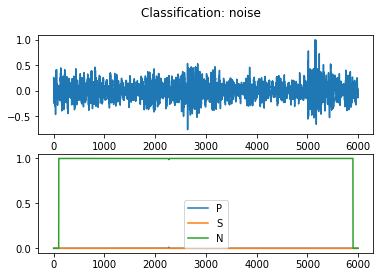

idx: 138
Origin time: 2018-10-27T11:07:14.001670Z
Station: 15.0
23/23 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

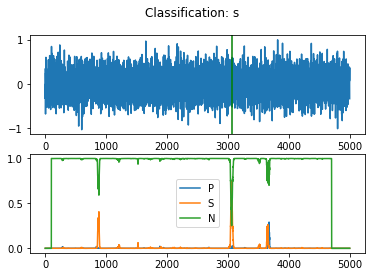

idx: 139
Origin time: 2018-12-14T13:06:38.173000Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

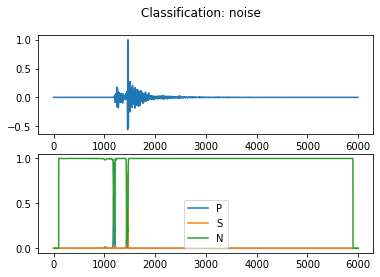

idx: 140
Origin time: 2018-10-26T14:14:02.064392Z
Station: 3.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

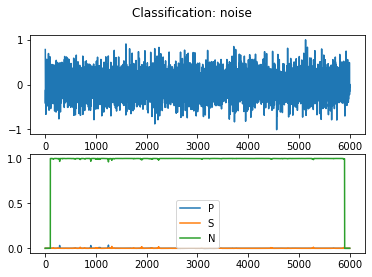

idx: 141
Origin time: 2018-10-26T11:17:00.133776Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

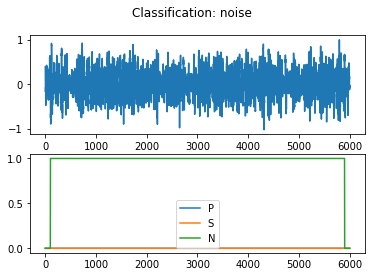

idx: 142
Origin time: 2018-12-14T13:18:28.591496Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

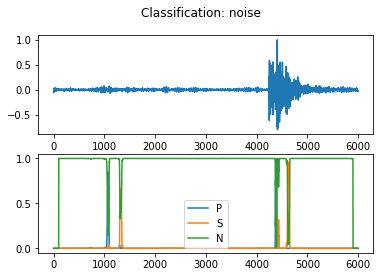

idx: 143
Origin time: 2018-12-11T09:34:04.615759Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

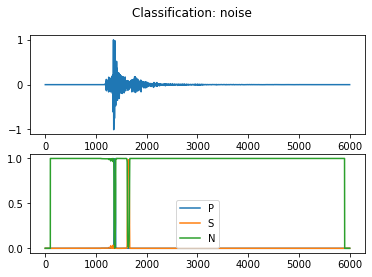

idx: 144
Origin time: 2018-10-25T17:04:11.657001Z
Station: 14.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

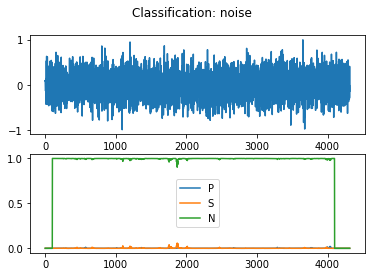

idx: 145
Origin time: 2018-10-24T13:18:58.879000Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

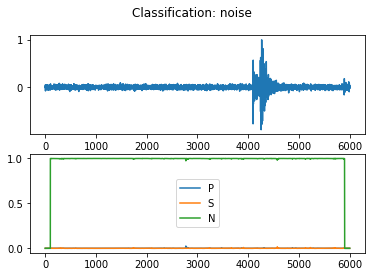

idx: 146
Origin time: 2018-10-29T11:42:49.719477Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

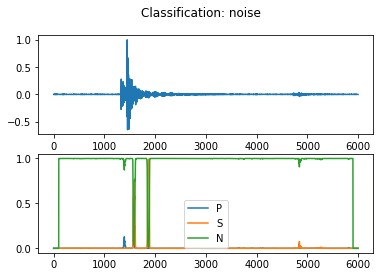

idx: 147
Origin time: 2018-10-25T15:23:48.987999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

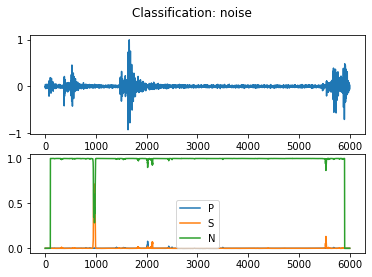

idx: 148
Origin time: 2018-10-24T12:57:12.116501Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

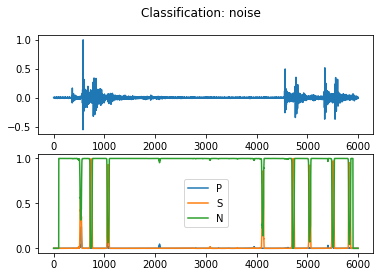

idx: 149
Origin time: 2018-10-25T15:22:57.260499Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

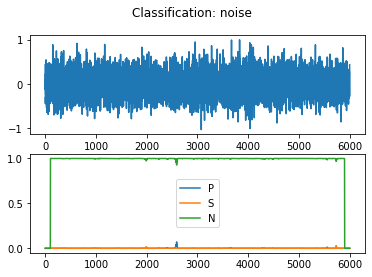

idx: 150
Origin time: 2018-12-15T09:40:05.380999Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

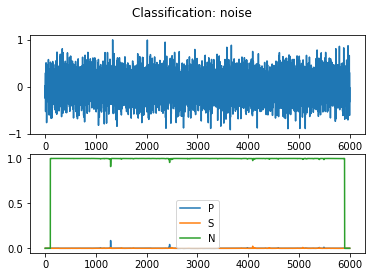

idx: 151
Origin time: 2018-12-14T19:22:43.298000Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

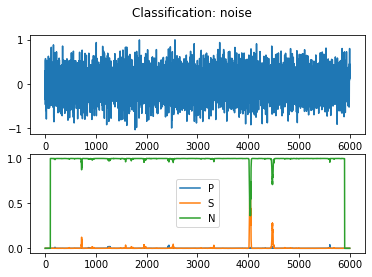

idx: 152
Origin time: 2018-12-15T05:14:03.533001Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

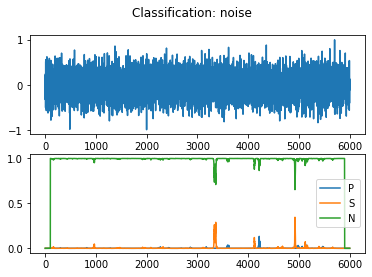

idx: 153
Origin time: 2018-12-14T20:17:13.597500Z
Station: 19.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

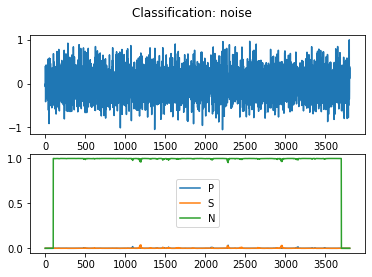

idx: 154
Origin time: 2018-12-18T02:37:04.920323Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

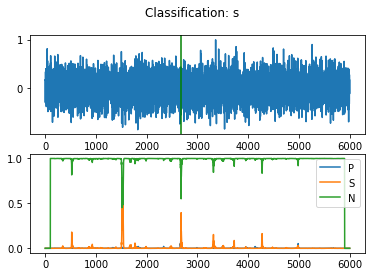

idx: 155
Origin time: 2018-12-18T08:08:31.404378Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

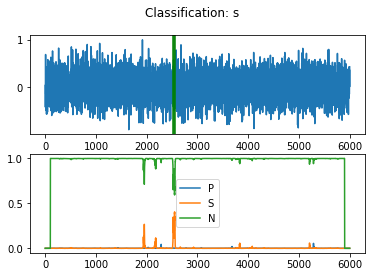

idx: 156
Origin time: 2018-12-14T19:05:17.706270Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

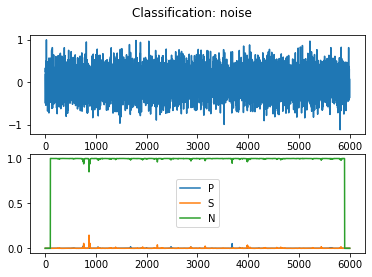

idx: 157
Origin time: 2018-12-17T17:53:13.415503Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

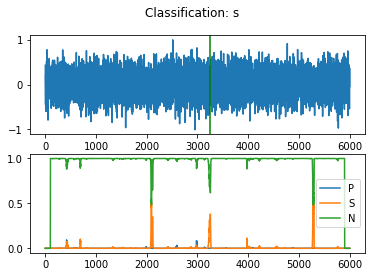

idx: 158
Origin time: 2018-12-18T08:09:09.558826Z
Station: 14.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

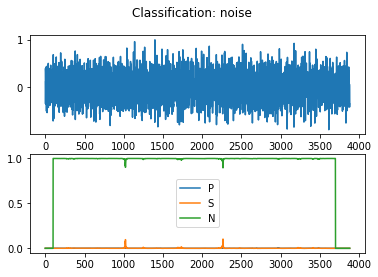

idx: 159
Origin time: 2018-12-18T00:16:29.176860Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

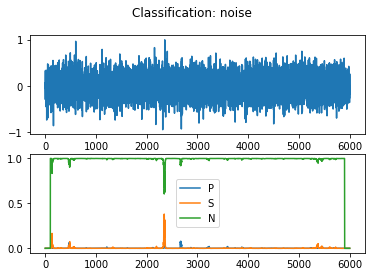

idx: 160
Origin time: 2018-12-15T04:24:15.802999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

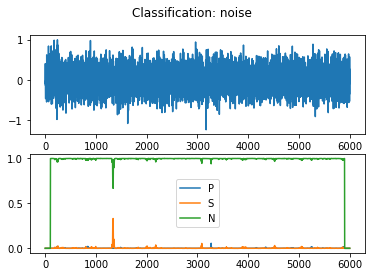

idx: 161
Origin time: 2018-12-17T18:23:05.929902Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

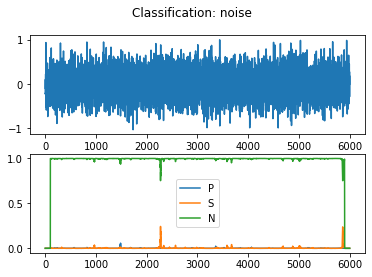

idx: 162
Origin time: 2018-12-17T17:35:38.960749Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

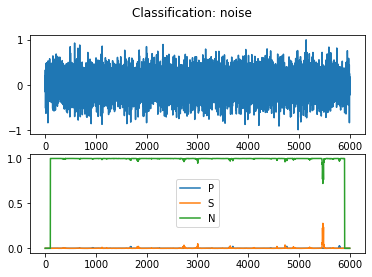

idx: 163
Origin time: 2018-12-14T15:44:58.467000Z
Station: 20.0
18/18 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

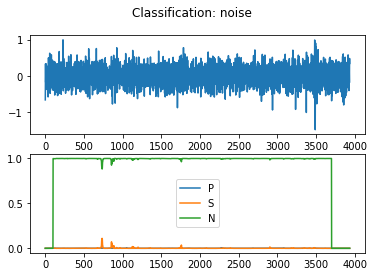

idx: 164
Origin time: 2018-12-17T19:39:33.612497Z
Station: 16.0
17/17 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

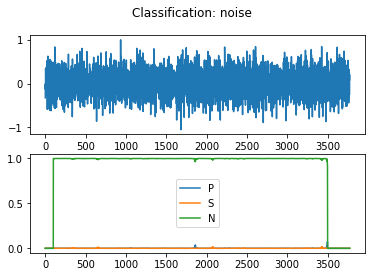

idx: 165
Origin time: 2018-12-18T00:20:41.060939Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

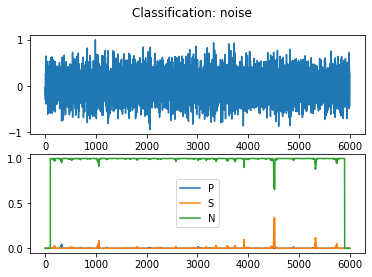

idx: 166
Origin time: 2018-12-18T00:39:01.095666Z
Station: 21.0
23/23 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

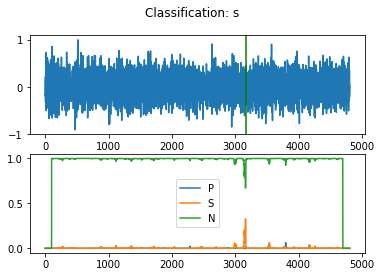

idx: 167
Origin time: 2018-12-15T03:05:15.485441Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

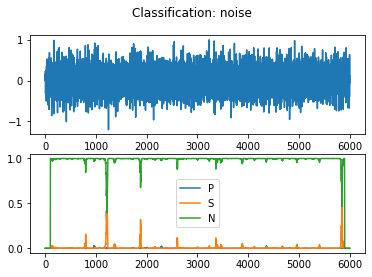

idx: 168
Origin time: 2018-12-18T03:38:53.633431Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

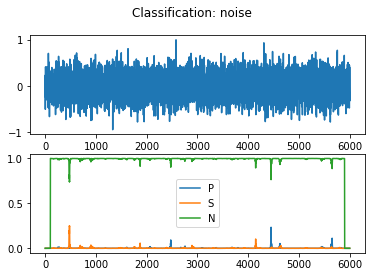

idx: 169
Origin time: 2018-12-18T04:16:01.604612Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

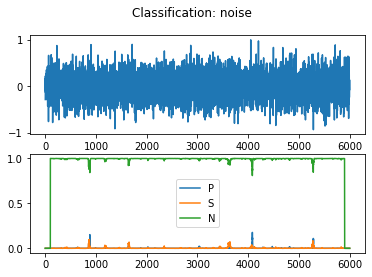

idx: 170
Origin time: 2018-12-18T03:49:21.433724Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

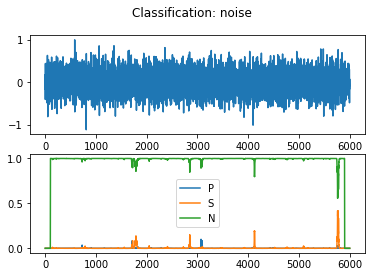

idx: 171
Origin time: 2018-12-14T20:53:05.808002Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

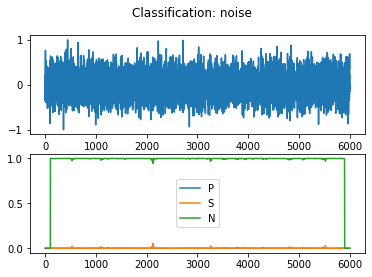

idx: 172
Origin time: 2018-12-17T16:25:29.783592Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

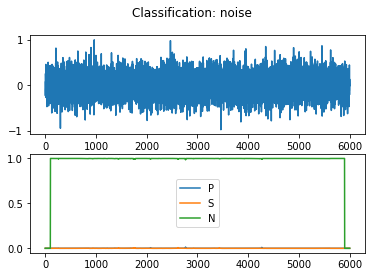

idx: 173
Origin time: 2018-12-14T14:59:44.866501Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

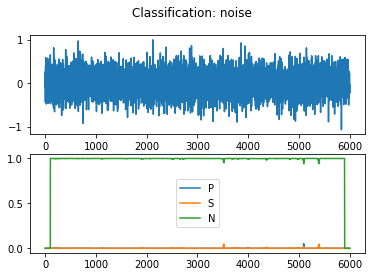

idx: 174
Origin time: 2018-12-17T22:22:53.176300Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

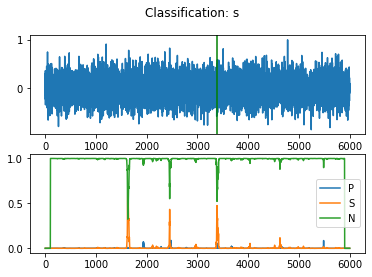

idx: 175
Origin time: 2018-12-17T23:33:55.632907Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

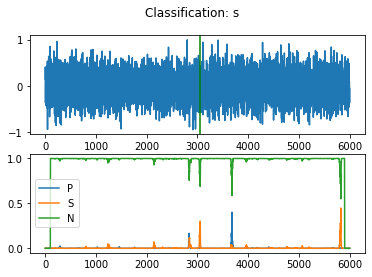

idx: 176
Origin time: 2018-12-18T01:05:36.723657Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

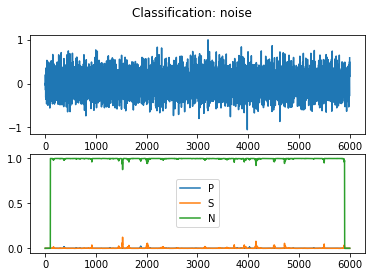

idx: 177
Origin time: 2018-12-17T20:33:51.832724Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

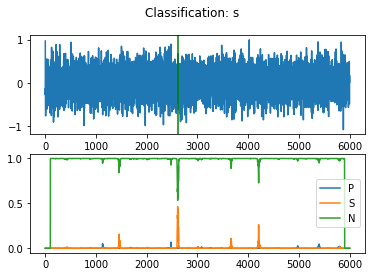

idx: 178
Origin time: 2018-12-14T19:41:41.565502Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

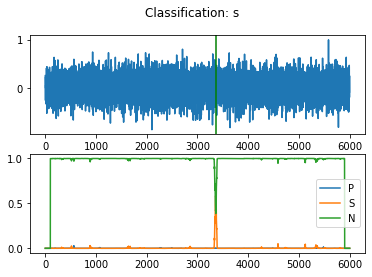

idx: 179
Origin time: 2018-12-18T05:43:57.300138Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

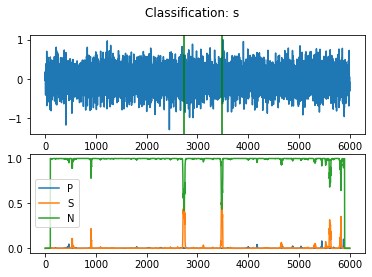

idx: 180
Origin time: 2018-12-14T16:34:57.666000Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

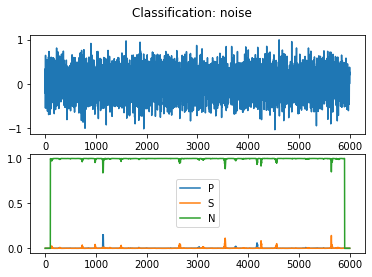

idx: 181
Origin time: 2018-12-18T02:14:25.814875Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

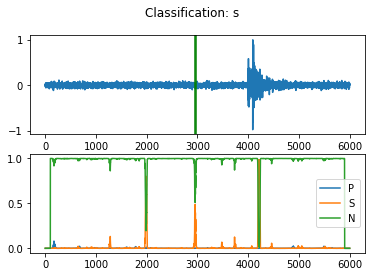

idx: 182
Origin time: 2018-12-17T23:51:15.367954Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

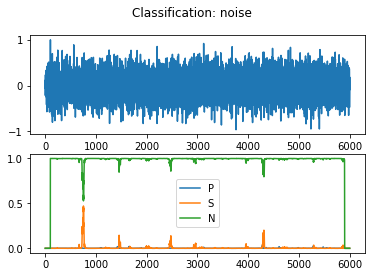

idx: 183
Origin time: 2018-12-18T08:22:55.926358Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

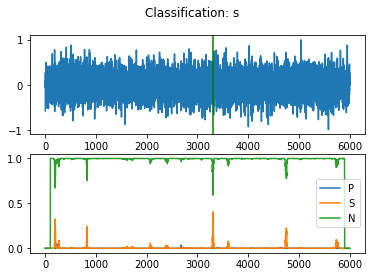

idx: 184
Origin time: 2018-12-14T17:22:40.540499Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

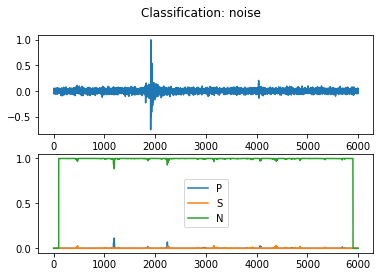

idx: 185
Origin time: 2018-12-15T03:03:10.531500Z
Station: 20.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

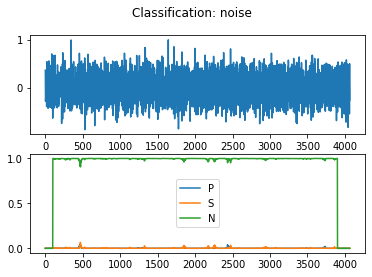

idx: 186
Origin time: 2018-12-17T18:35:56.740838Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

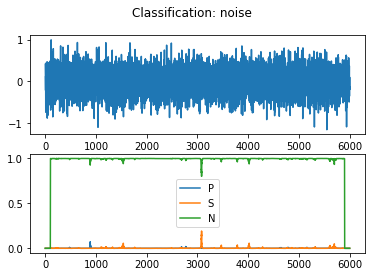

idx: 187
Origin time: 2018-12-15T04:53:39.408500Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

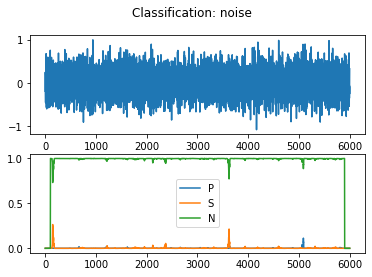

idx: 188
Origin time: 2018-12-17T19:46:29.421621Z
Station: 17.0
19/19 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

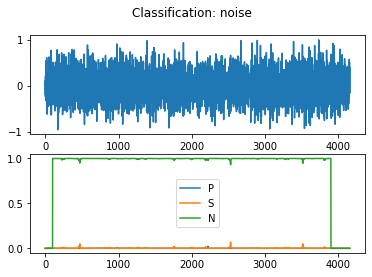

idx: 189
Origin time: 2018-12-18T01:06:02.209945Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

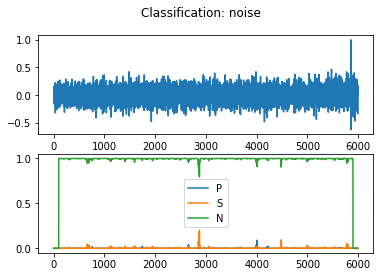

idx: 190
Origin time: 2018-12-14T15:03:33.396500Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

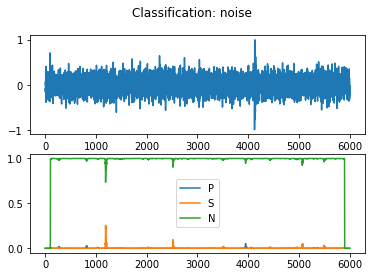

idx: 191
Origin time: 2018-12-18T04:02:53.189356Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

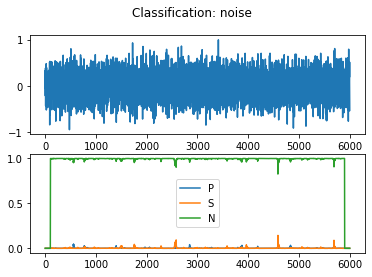

idx: 192
Origin time: 2018-12-14T17:35:09.780328Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

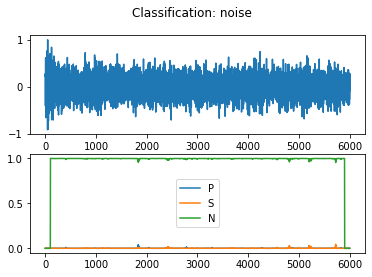

idx: 193
Origin time: 2018-12-17T21:07:03.273411Z
Station: 23.0
26/26 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

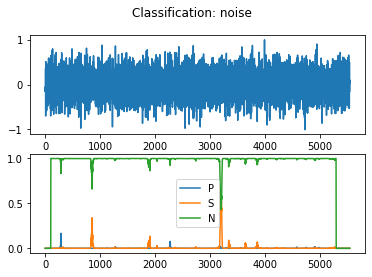

idx: 194
Origin time: 2018-12-14T20:25:13.901501Z
Station: 20.0
14/14 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

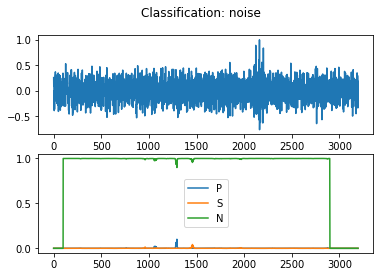

idx: 195
Origin time: 2018-12-18T05:28:25.031603Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

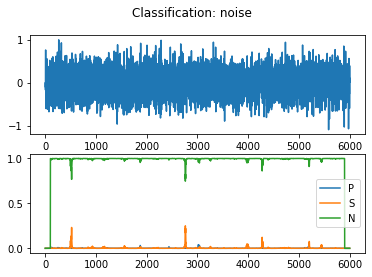

idx: 196
Origin time: 2018-12-15T04:40:30.429846Z
Station: 21.0
18/18 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

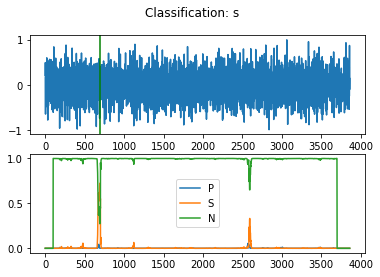

idx: 197
Origin time: 2018-12-14T15:59:44.792001Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

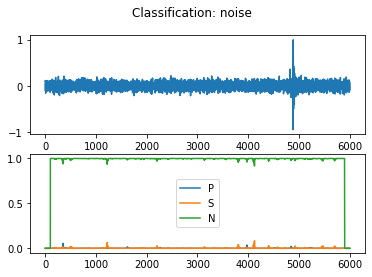

idx: 198
Origin time: 2018-12-17T19:05:24.908105Z
Station: 17.0
24/24 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

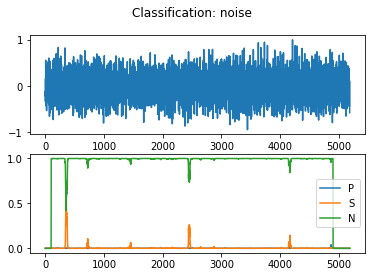

idx: 199
Origin time: 2018-12-15T14:18:24.858000Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

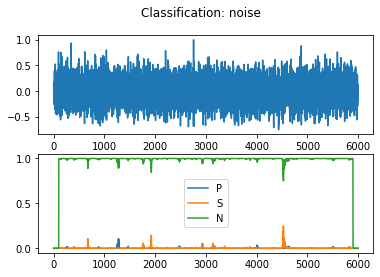

idx: 200
Origin time: 2018-10-16T13:49:59.824497Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

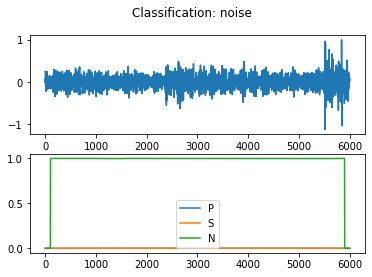

idx: 201
Origin time: 2018-10-18T14:36:54.081577Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

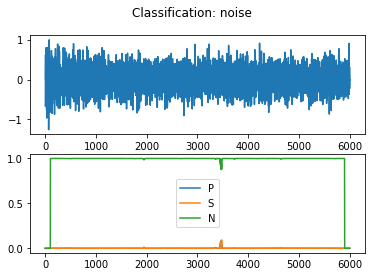

idx: 202
Origin time: 2018-10-18T15:28:08.172497Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

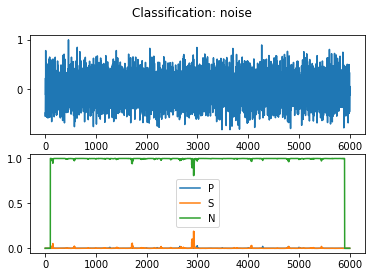

idx: 203
Origin time: 2018-10-22T11:50:56.058499Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

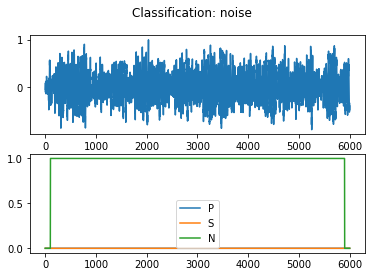

idx: 204
Origin time: 2018-10-24T13:39:30.415000Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

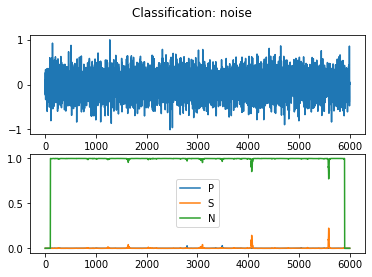

idx: 205
Origin time: 2018-10-24T13:50:28.123500Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

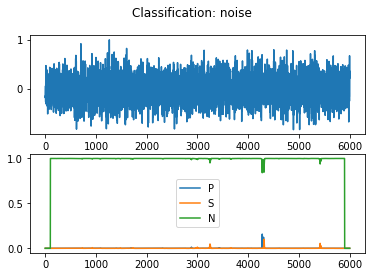

idx: 206
Origin time: 2018-10-25T11:35:06.813999Z
Station: 8.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

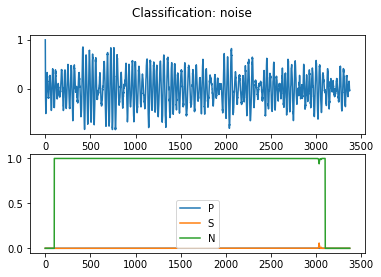

idx: 207
Origin time: 2018-10-25T12:06:03.809500Z
Station: 11.0
22/22 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

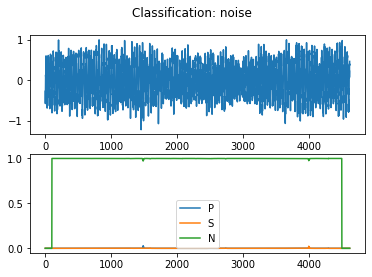

idx: 208
Origin time: 2018-10-25T13:06:01.177500Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

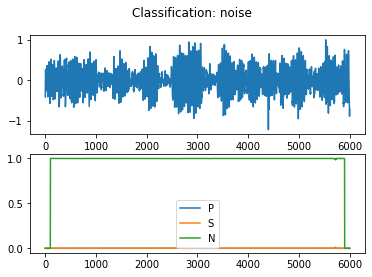

idx: 209
Origin time: 2018-10-25T13:24:55.688499Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

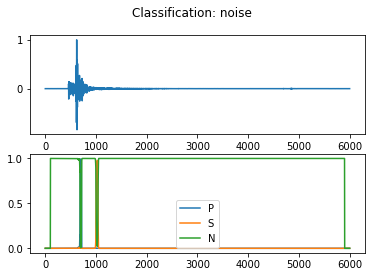

idx: 210
Origin time: 2018-10-25T14:51:06.781501Z
Station: 20.0
16/16 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

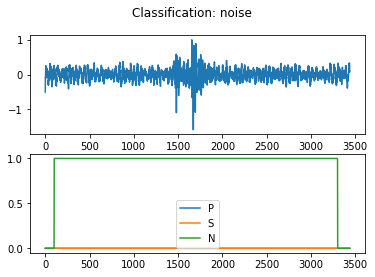

idx: 211
Origin time: 2018-10-25T15:21:00.353500Z
Station: 2.0
27/27 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

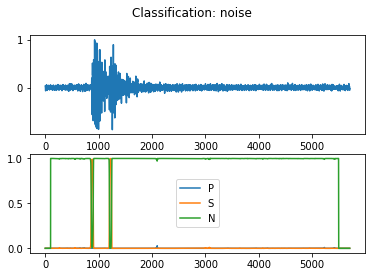

idx: 212
Origin time: 2018-10-25T15:29:03.817499Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

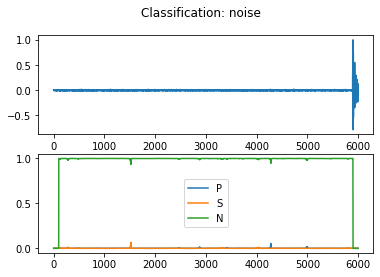

idx: 213
Origin time: 2018-10-26T08:41:31.695720Z
Station: 7.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

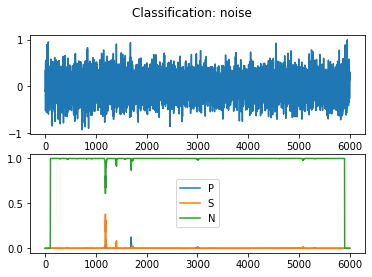

idx: 214
Origin time: 2018-10-26T11:10:35.557499Z
Station: 15.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

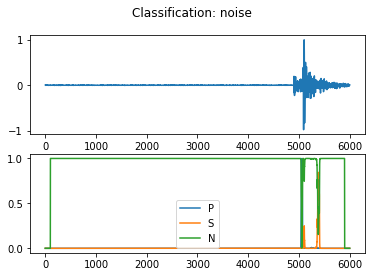

idx: 215
Origin time: 2018-10-27T11:03:23.426501Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

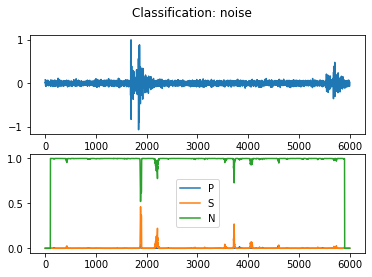

idx: 216
Origin time: 2018-10-27T11:07:25.788499Z
Station: 19.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

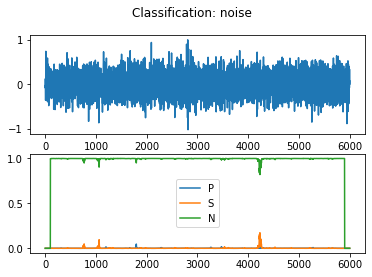

idx: 217
Origin time: 2018-10-30T14:44:11.823515Z
Station: 10.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

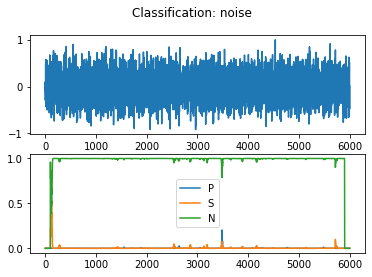

idx: 218
Origin time: 2018-10-31T08:22:51.389743Z
Station: 1.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

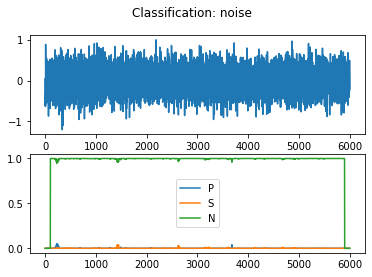

idx: 219
Origin time: 2018-10-31T10:41:18.284942Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

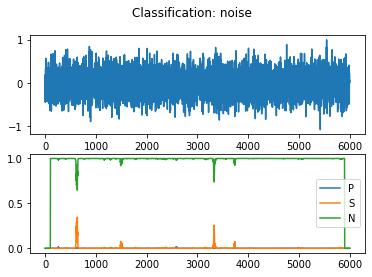

idx: 220
Origin time: 2018-12-09T21:15:02.914503Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

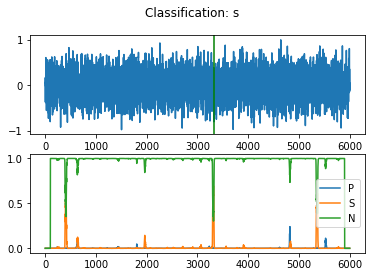

idx: 221
Origin time: 2018-12-10T12:38:45.835501Z
Station: 12.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

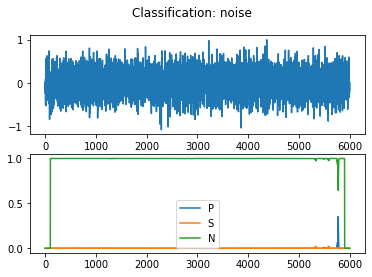

idx: 222
Origin time: 2018-12-11T10:02:16.506499Z
Station: 9.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

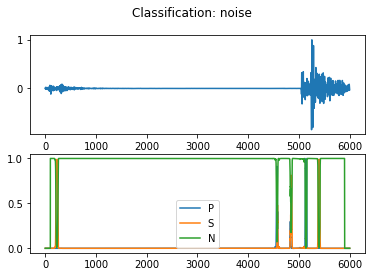

idx: 223
Origin time: 2018-12-14T13:08:07.714999Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

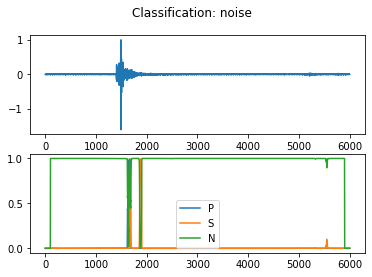

idx: 224
Origin time: 2018-12-14T14:29:26.360495Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

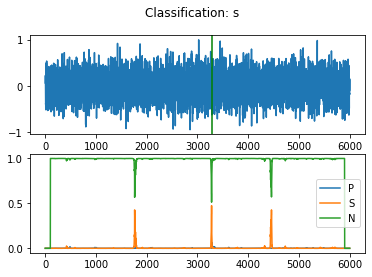

idx: 225
Origin time: 2018-10-16T14:19:04.527500Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

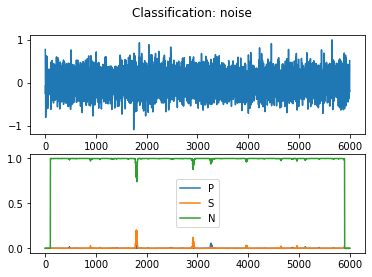

idx: 226
Origin time: 2018-10-16T15:09:01.566004Z
Station: 4.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

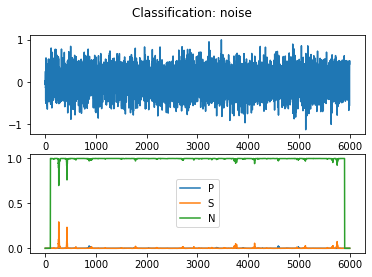

idx: 227
Origin time: 2018-10-17T17:42:00.022497Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

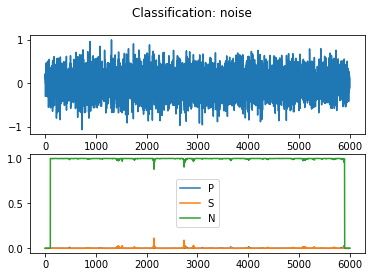

idx: 228
Origin time: 2018-10-17T18:08:07.517003Z
Station: 21.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

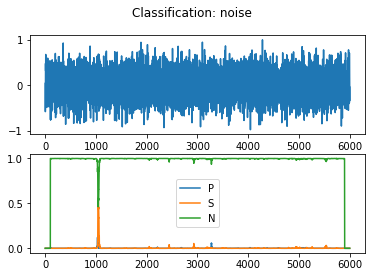

idx: 229
Origin time: 2018-10-18T14:33:00.017499Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

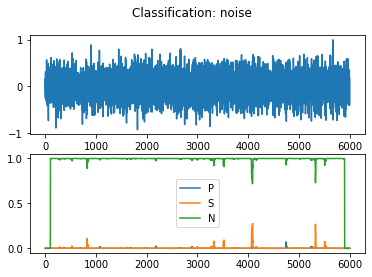

idx: 230
Origin time: 2018-10-18T14:51:25.291075Z
Station: 2.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

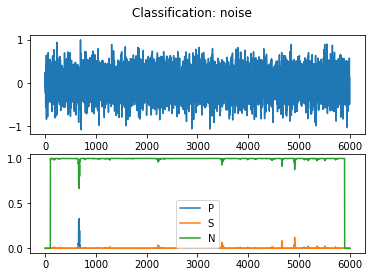

idx: 231
Origin time: 2018-10-19T12:51:43.176329Z
Station: 24.0
15/15 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

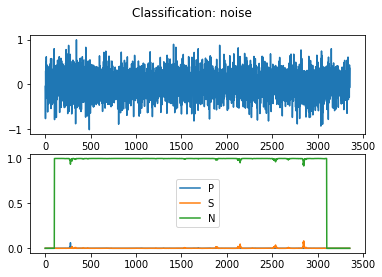

idx: 232
Origin time: 2018-10-22T22:16:26.187965Z
Station: 10.0
15/15 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

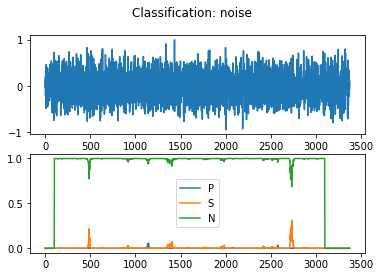

idx: 233
Origin time: 2018-10-25T11:39:18.022878Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

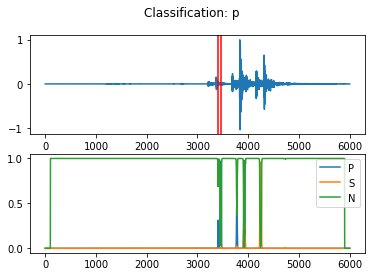

idx: 234
Origin time: 2018-10-25T12:17:15.683881Z
Station: 17.0
20/20 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

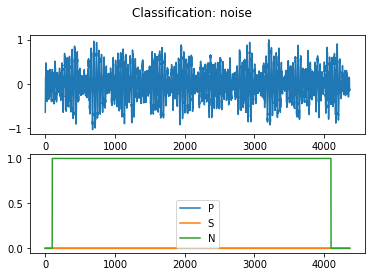

idx: 235
Origin time: 2018-10-25T12:41:29.403562Z
Station: 14.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

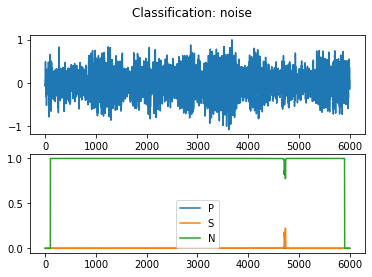

idx: 236
Origin time: 2018-10-25T15:07:12.805209Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

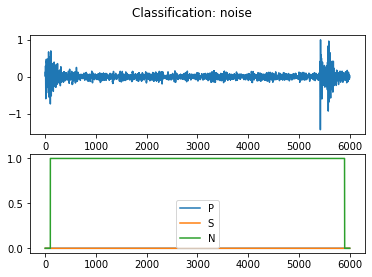

idx: 237
Origin time: 2018-10-25T17:08:33.172500Z
Station: 6.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

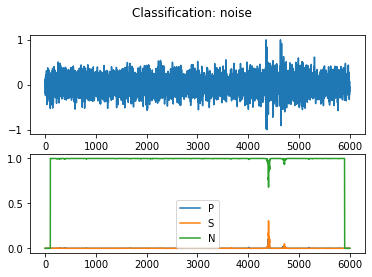

idx: 238
Origin time: 2018-10-26T11:31:41.799501Z
Station: 22.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

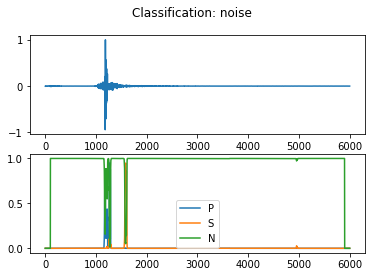

idx: 239
Origin time: 2018-10-27T10:38:19.212500Z
Station: 17.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

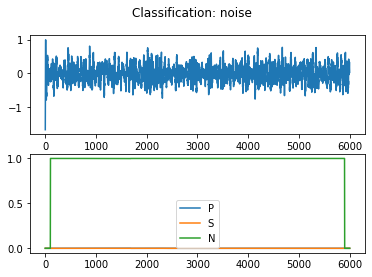

idx: 240
Origin time: 2018-10-27T10:58:58.104500Z
Station: 2.0
22/22 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

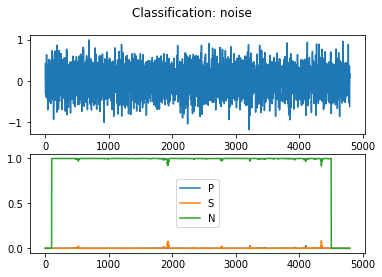

idx: 241
Origin time: 2018-10-27T14:33:31.600499Z
Station: 16.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

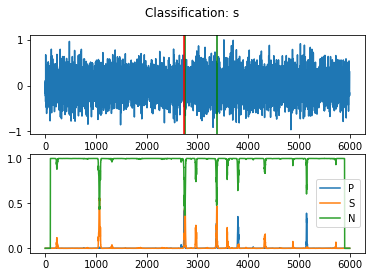

idx: 242
Origin time: 2018-11-02T17:45:59.884999Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

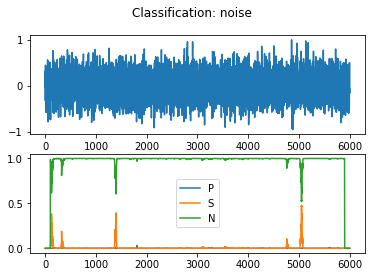

idx: 243
Origin time: 2018-12-11T09:21:25.517003Z
Station: 8.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

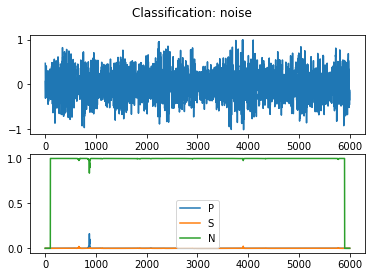

idx: 244
Origin time: 2018-12-11T09:32:02.381499Z
Station: 22.0
20/20 [==============================] - 0s 1ms/step


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:114: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:137: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<Figure size 432x288 with 0 Axes>

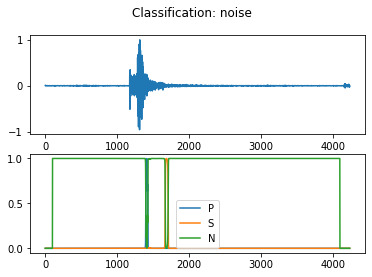

idx: 245
Origin time: 2018-12-11T10:29:16.927503Z
Station: 23.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

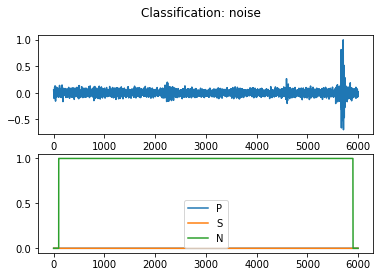

idx: 246
Origin time: 2018-12-13T11:19:17.937003Z
Station: 18.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

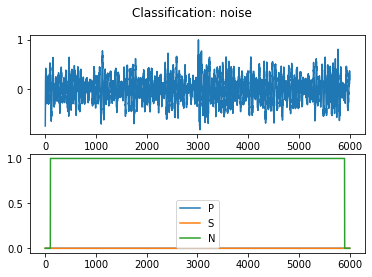

idx: 247
Origin time: 2018-12-14T20:12:21.600999Z
Station: 24.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

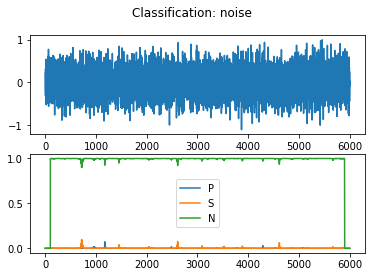

idx: 248
Origin time: 2018-12-17T11:31:04.611688Z
Station: 13.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

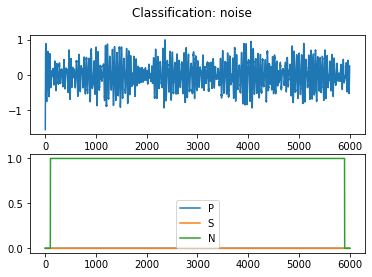

idx: 249
Origin time: 2018-12-17T12:07:48.136187Z
Station: 20.0
29/29 [==============================] - 0s 1ms/step


<Figure size 432x288 with 0 Axes>

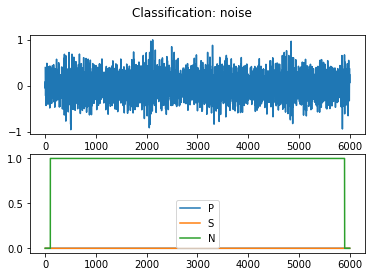

All done with N.


<Figure size 432x288 with 0 Axes>

In [19]:
# for N_df

results_N = pd.DataFrame(index= np.arange(0,len(N_df)),columns=['time', 'sta', 'pha', 'prob'])

for indx in np.arange(0, len(S_df)):
    # Dataframe to store picks from trigger
    df = pd.DataFrame(columns=['time', 'sta', 'pha', 'prob'])
    
    # read the data
    stcut_ENZ = read('./mseed_inputs/N_'+str(indx)+'.mseed',format='mseed')

    ##################################################

    # Expand overlapping windows using sliding_window function
    sliding_E = sliding_window(stcut_ENZ[0].data, 400, stepsize=shift_size) # Slide window across first component
    tr_win = np.zeros((sliding_E.shape[0], 400, 3)) # 3D array (of zeros)
    tr_win[:,:,0] = sliding_E # Add to 3D array
    sliding_E = None # clear some memory

    sliding_N = sliding_window(stcut_ENZ[1].data, 400, stepsize=shift_size) # Slide window across second component
    tr_win[:,:,1] = sliding_N # Add to 3D array
    sliding_N = None # clear some memory

    sliding_Z = sliding_window(stcut_ENZ[2].data, 400, stepsize=shift_size) # Slide window across third component
    tr_win[:,:,2] = sliding_Z # Add to 3D array
    sliding_Z = None # clear some memory

    tr_win = signal.detrend(tr_win, axis=1) # Detrend 
    tr_win = tr_win / np.max(np.abs(tr_win), axis=(1,2))[:,None,None] # Normalize between 0 and 1 (divide by max across 3 components for each window)
        
    # Model prediction step...
    ts = model.predict(tr_win, verbose=True, batch_size=batch_size)
    
    # Merge overlapping predictions:
    n_steps_per_win = 400/shift_size # No. of steps per window (i.e. how many overlapping windows)
    class_trace = np.zeros((len(stcut_ENZ[0].data), int(3))) # Create prediction traces to be same size as input data
    for i in np.arange(0, ts.shape[0]): # For each window
        class_trace[((i * shift_size) + 100):((i * shift_size) + 300), :] += ts[i, 100:300, :] # Keep middle 200 predictions


    # Extract probability trace for each (write to a file for future analysis?)
    prob_P = ts[:,0]
    prob_S = ts[:,1]
    prob_N = ts[:,2]

   # Use obspy trigger to find predictions above threshold (i.e. p_thresh and s_thresh)
    # P-wave picks (trigger):
    trigs = trigger_onset(class_trace[:,0], 0.3, trig_off) # Look for triggers (prediction trace exceeding p_thresh)
    p_picks = []
    p_probs = []
    
    for trig in trigs:
        if trig[1] == trig[0]:
            continue # If trigger on and off times are the same then ignore
        pick = np.argmax(class_trace[trig[0]:trig[1], 0]) + trig[0] # Use argmax between trigger on and off times as pick time
        stamp_pick = stcut_ENZ[0].stats.starttime + (pick * stcut_ENZ[0].stats.delta) # Pick time as UTCDateTime
        p_picks.append(stamp_pick) # Append time to list of P pick times
        p_probs.append(class_trace[pick, 0]) # Append prob to list of P pick probabilities
    
    
    # Add picks to df for this day            
    if len(p_picks) > 0:
        df_add = pd.DataFrame(p_picks, columns=['time'])
        df_add['pha'] = 'p'
        if (int(N_df['sta_str'].iloc[indx])+1) > 9:
            df_add['sta'] = "0" + str(int(N_df['sta_str'].iloc[indx]))
        else:
            df_add['sta'] = "00" + str(int(N_df['sta_str'].iloc[indx]))
        df_add['prob'] = p_probs
        df = pd.concat([df, df_add])
        
    # Repeat above for S-wave picks and s_thresh:
    trigs = trigger_onset(class_trace[:,1], s_thresh, trig_off)
    s_picks = []
    s_probs = []
    for trig in trigs:
        if trig[1] == trig[0]:
            continue
        pick = np.argmax(class_trace[trig[0]:trig[1], 1]) + trig[0]
        stamp_pick = stcut_ENZ[0].stats.starttime + (pick * stcut_ENZ[0].stats.delta)
        s_picks.append(stamp_pick)
        s_probs.append(class_trace[pick, 1])
        
    # Add picks to df for this day
    if len(s_picks) > 0:
        df_add = pd.DataFrame(s_picks, columns=['time'])
        df_add['pha'] = 's'
        if (int(N_df['sta_str'].iloc[indx])+1) > 9:
            df_add['sta'] = "0" + str(int(N_df['sta_str'].iloc[indx]))
        else:
            df_add['sta'] = "00" + str(int(N_df['sta_str'].iloc[indx]))
        df_add['prob'] = s_probs
        df = pd.concat([df, df_add])

    df = df.sort_values(by='prob',ascending=False).reset_index(drop=True)
    
    # get the picks that are +- 0.5 second (200 samples) of the phase time
    df_final = df[df['time'] >= N_df['starttime'].iloc[indx] -0.25]
    df_final = df_final[df_final['time'] <= N_df['starttime'].iloc[indx] +0.25]

#     then get the highest probability for that time window
    df_final = df_final.sort_values(by='prob',ascending=False).reset_index(drop=True)
    
    fig, axs = plt.subplots(2)
    

    # get the one nearest to the middle of the window
    if len(df_final) > 0:
        timediff = []
        for dfii in np.arange(0,len(df_final)):
            timediff1 = abs((stcut_ENZ[0].stats.starttime + 1.5) - df_final['time'].iloc[dfii])
            timediff.append(timediff1)
            
        fig.suptitle('Classification: '+ df_final['pha'].iloc[np.argmin(timediff)])
    else:
        fig.suptitle('Classification: noise')
        
        
    axs[0].plot(stcut_ENZ[(int(N_df['sta_str'].iloc[indx]) - 1)*3 + 2].data/max(stcut_ENZ[(int(N_df['sta_str'].iloc[indx]) - 1)*3 + 2].data))
    if len(df_final) > 0:
        df_final.to_csv('./Model_results/UGPD/N/df_final_'+str(indx)+'.csv')
        for thepicks in np.arange(0,len(df_final)):
            if df_final['pha'].iloc[thepicks] == 'p':
                axs[0].axvline(x=(abs(df_final['time'].iloc[thepicks] - stcut_ENZ[0].stats.starttime) / 0.0005),color='r')
            else:
                axs[0].axvline(x=(abs(df_final['time'].iloc[thepicks] - stcut_ENZ[0].stats.starttime) / 0.0005),color='g')
             
    else:
        pass
    axs[1].plot(class_trace[:,0],'-')
    axs[1].plot(class_trace[:,1],'-')
    axs[1].plot(class_trace[:,2],'-')
    axs[1].legend(['P','S','N'])
    
    plt.show()
    
    if indx < 10:
        fig.savefig('./Model_results/UGPD/N/N_result_00'+str(indx)+'.png')
    elif (indx > 9) and (indx < 100):
        fig.savefig('./Model_results/UGPD/N/N_result_0'+str(indx)+'.png')
    else:
        fig.savefig('./Model_results/UGPD/N/N_result_'+str(indx)+'.png')
        
    plt.close()
    plt.clf()
    #############
    
    # run through all P picks
    if len(df_final)>0:
        results_N['time'].iloc[indx] = df_final['time'].iloc[0]
        results_N['sta'].iloc[indx] = df_final['sta'].iloc[0]
        results_N['pha'].iloc[indx] = df_final['pha'].iloc[np.argmin(timediff)]
        results_N['prob'].iloc[indx] = df_final['prob'].iloc[np.argmin(timediff)]
    else:
        results_N['time'].iloc[indx] = np.nan
        results_N['sta'].iloc[indx] = N_df['sta_str'].iloc[indx]
        results_N['pha'].iloc[indx] = 'n'
        results_N['prob'].iloc[indx] = np.nan
        
results_N.to_csv('./Model_results/UGPD/N/250results_N.csv')
print("All done with N.")



___

# Confusion matrix calculations

In [20]:
len(results_P)
len(results_S)
len(results_N)

250

In [21]:
P_true = ['p'] * len(results_P)
S_true = ['s'] * len(results_S)
N_true = ['n'] * len(results_N)

P_predict = results_P['pha'].to_list()
S_predict = results_S['pha'].to_list()
N_predict = results_N['pha'].to_list()

from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix

true = P_true + S_true + N_true
predict = P_predict + S_predict + N_predict

# precision, recall, weigted f-score
precision, recall, fscore, nth = precision_recall_fscore_support(true, predict, average='weighted',labels=['p', 's', 'n'])
PRF_250ev_df = pd.DataFrame(index = np.arange(0,1), columns=['Precision','Recall', 'F-score'])
PRF_250ev_df.iloc[0] = [precision, recall, fscore]

# PRF_250ev_df.to_pickle(root + 'confusion_matrix/PRF_250ev_df_'+str(min_proba[i_thr])+'_thr.pkl')
PRF_250ev_df.to_csv('./Model_results/UGPD/UGPD_PRF_250ev_df.csv')

CFM_df = pd.DataFrame.from_items([('P', CFM[0]), 
                         ('S', CFM[1]),
                         ('Noise', CFM[2])],
                        orient='index',
                        columns=['P', 'S', 'Noise'])

CFM_250evdf = CFM_df.copy()
# CFM_250evdf.to_pickle(root+'confusion_matrix/CFM_f50_250evdf_'+str(min_proba[i_thr])+'_thr.pkl')
CFM_250evdf.to_csv('./Model_results/UGPD/UGPD_CFM_250ev_df.csv')

print('All done.')

All done.


/Users/cl16908/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
